In [1]:
import os
import cv2
import math
import keras
import seaborn
import h5py

import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import pandas as pd

from skimage.transform import resize
from sklearn.model_selection import train_test_split, StratifiedKFold

from keras.models import Model
from keras import layers, models
from keras import backend as K
from keras.callbacks import EarlyStopping, TensorBoard, ModelCheckpoint, ReduceLROnPlateau

from scipy.ndimage.filters import uniform_filter
from scipy.ndimage.measurements import variance

from tqdm import tqdm_notebook

In [2]:
config = tf.ConfigProto()
config.gpu_options.allow_growth = True
session = tf.Session(config=config)

In [3]:
K.set_image_data_format('channels_last')

create_image_rows = 420
create_image_cols = 580
smooth = 1.0

In [ ]:
image_t =h5py.File('./imgs_train_SRAD_40.h5', 'r')
image_t =image_t.get('image')
image_t= np.array(image_t)
image_t=np.transpose(image_t)

In [4]:
mask_t = np.load('./imgs_mask_train.npy')
image_t = np.load('./imgs_train.npy')

In [5]:
import warnings
warnings.filterwarnings(action='ignore')

In [6]:
def lee_filter(img, size):
    img_mean = uniform_filter(img, (size, size))
    img_sqr_mean = uniform_filter(img**2, (size, size))
    img_variance = img_sqr_mean - img_mean**2

    overall_variance = variance(img)

    img_weights = img_variance / (img_variance + overall_variance)
    img_output = img_mean + img_weights * (img - img_mean)
    return img_output

In [7]:
def SRAD(i, niter, lamda, rect):
    # make image a double and normalize on[0, 1]
    i = i.astype('float32')
    mx = np.max(i[:])
    mn = np.min(i[:])
    i = (i-mn)/(mx-mn)

    # make image a double and normalize on[0, 1]
    [M, N] = np.shape(i)

    # image indices (using boudary conditions)
    iN = np.hstack((np.array(0),np.arange(0,M-1)))
    iS = np.hstack((np.arange(1,M-1),np.array(M-1),np.array(M-1)))
    jW = np.hstack((np.array(0),np.arange(0,N-1)))
    jE = np.hstack((np.arange(1,N-1),np.array(N-1),np.array(N-1)))
    
    # log uncompress (also eliminates zero value pixels)
    i = np.exp(i)

    # main algorithm
    for liter in np.arange(1,niter+1):

         # speckle scale function
        Iuniform = i[rect[0]:rect[1],rect[2]:rect[3]]
        q0_squared = np.var(Iuniform[:]) / ((np.mean(Iuniform[:]))**2)

        # difference
        dN = i[iN, :] - i
        dS = i[iS, :] - i
        dW = i[:, jW] - i
        dE = i[:, jE] - i

        # normalized discrete gradient magnitude squared (equ 52,53)
        G2 = (pow(dN,2) + pow(dS, 2) + pow(dW, 2) + pow(dE, 2)) / (pow(i, 2))

        # normalized discrete laplacian (equ 54)
        L = (dN + dS + dW + dE)/i

        # ICOV (equ 31/35)
        num = (0.5*G2) - ((1/16)*(pow(L, 2)))
        den = pow((1 + ((1/4)*L)), 2)
        q_squared = num / (den + np.finfo(float).eps)

        # diffusion coefficent (equ 33)
        den = (q_squared - q0_squared) / (q0_squared * (1 + q0_squared) +np.finfo(float).eps)
        c = 1 / (1 + den)

        # saturate diffusion coefficent
        c[c < 0] = 0
        c[c > 1] = 1

        # divergence (equ 58)
        cS = c[iS, :]
        cE = c[:,jE]
        D = (c*dN) + (cS*dS) + (c*dW) + (cE*dE)
        
        # update
        i = i + (lamda/4)*D; 
        
    J = np.log(i)
    J=np.round(J*255)
    J=J.astype('uint8')
    return J

In [8]:
def dice_coef(y_true, y_pred):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)

    intersection = K.sum(y_true_f * y_pred_f)

    return (2. * intersection+ K.epsilon()) / (K.sum(y_true_f) + K.sum(y_pred_f) + K.epsilon())


def dice_coef_loss(y_true, y_pred):
    return 1-dice_coef(y_true, y_pred)


def recall(y_true, y_pred):
    # clip(t, clip_value_min, clip_value_max) : clip_value_min~clip_value_max 이외 가장자리를 깎아 낸다
    # round : 반올림한다
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)

    # 예측값을 0(Negative) 또는 1(Positive)로 설정한다
    y_pred_yn = K.round(K.clip(y_pred_f, 0, 1))
    # 실제값을 0(Negative) 또는 1(Positive)로 설정한다
    y_target_yn = K.round(K.clip(y_true_f, 0, 1))

    # True Positive는 실제 값과 예측 값이 모두 1(Positive)인 경우이다
    count_true_positive = K.sum(y_target_yn * y_pred_yn)

    # (True Positive + False Negative) = 실제 값이 1(Positive) 전체
    count_true_positive_false_negative = K.sum(y_target_yn)

    # Recall =  (True Positive) / (True Positive + False Negative)
    # K.epsilon()는 'divide by zero error' 예방차원에서 작은 수를 더한다
    recall = (count_true_positive+ K.epsilon()) / \
        (count_true_positive_false_negative + K.epsilon())

    # return a single tensor value
    return recall


def precision(y_true, y_pred):
    # clip(t, clip_value_min, clip_value_max) : clip_value_min~clip_value_max 이외 가장자리를 깎아 낸다
    # round : 반올림한다

    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)

    # 예측값을 0(Negative) 또는 1(Positive)로 설정한다
    y_pred_yn = K.round(K.clip(y_pred_f, 0, 1))
    # 실제값을 0(Negative) 또는 1(Positive)로 설정한다
    y_target_yn = K.round(K.clip(y_true_f, 0, 1))

    # True Positive는 실제 값과 예측 값이 모두 1(Positive)인 경우이다
    count_true_positive = K.sum(y_target_yn * y_pred_yn)

    # (True Positive + False Positive) = 예측 값이 1(Positive) 전체
    count_true_positive_false_positive = K.sum(y_pred_yn)

    # Precision = (True Positive) / (True Positive + False Positive)
    # K.epsilon()는 'divide by zero error' 예방차원에서 작은 수를 더한다
    precision = (count_true_positive+ K.epsilon()) / \
        (count_true_positive_false_positive + K.epsilon())

    # return a single tensor value
    return precision


def mean_iou(y_true, y_pred, smooth=1):
    y_pred_N = K.round(K.clip(y_pred, 0, 1))
    y_true_N = K.round(K.clip(y_true, 0, 1))
    intersection = K.sum(K.abs(y_pred_N * y_true_N), axis=-1)
    union = K.sum(y_true_N, axis=-1) + K.sum(y_pred_N, axis=-1)
    iou = (intersection+ K.epsilon()) / (union+ K.epsilon())
    return iou

In [9]:
from keras import regularizers


def get_unet():
    inputs = layers.Input((train_image_rows, train_image_cols, 1))
    conv1 = layers.Conv2D(32, (3, 3), activation='elu', kernel_regularizer=regularizers.l2(
        0.001), padding='same', kernel_initializer='lecun_normal')(inputs)
    conv1 = layers.Dropout(0.5)(conv1)
    conv1 = layers.Conv2D(32, (3, 3), activation='elu',  kernel_regularizer=regularizers.l2(
        0.001), padding='same', kernel_initializer='he_normal')(conv1)
    pool1 = layers.MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = layers.Conv2D(64, (3, 3), activation='elu', kernel_regularizer=regularizers.l2(
        0.001), padding='same', kernel_initializer='he_normal')(pool1)
    conv2 = layers.Dropout(0.5)(conv2)
    conv2 = layers.Conv2D(64, (3, 3), activation='elu', kernel_regularizer=regularizers.l2(
        0.001), padding='same', kernel_initializer='he_normal')(conv2)
    pool2 = layers.MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = layers.Conv2D(128, (3, 3), activation='elu', kernel_regularizer=regularizers.l2(
        0.001), padding='same', kernel_initializer='he_normal')(pool2)
    conv3 = layers.Dropout(0.5)(conv3)
    conv3 = layers.Conv2D(128, (3, 3), activation='elu', kernel_regularizer=regularizers.l2(
        0.001), padding='same', kernel_initializer='he_normal')(conv3)
    pool3 = layers.MaxPooling2D(pool_size=(2, 2))(conv3)

    conv4 = layers.Conv2D(256, (3, 3), activation='elu', kernel_regularizer=regularizers.l2(
        0.001), padding='same', kernel_initializer='he_normal')(pool3)
    conv4 = layers.Dropout(0.5)(conv4)
    conv4 = layers.Conv2D(256, (3, 3), activation='elu', kernel_regularizer=regularizers.l2(
        0.001), padding='same', kernel_initializer='he_normal')(conv4)
    pool4 = layers.MaxPooling2D(pool_size=(2, 2))(conv4)

    conv5 = layers.Conv2D(512, (3, 3), activation='elu', kernel_regularizer=regularizers.l2(
        0.001), padding='same', kernel_initializer='he_normal')(pool4)
    conv5 = layers.Dropout(0.5)(conv5)
    conv5 = layers.Conv2D(512, (3, 3), activation='elu', kernel_regularizer=regularizers.l2(
        0.001), padding='same', kernel_initializer='he_normal')(conv5)

    up6 = layers.concatenate([layers.Conv2DTranspose(256, (2, 2), strides=(
        2, 2), padding='same')(conv5), conv4], axis=3)
    conv6 = layers.Conv2D(256, (3, 3), activation='elu', kernel_regularizer=regularizers.l2(
        0.001), padding='same', kernel_initializer='he_normal')(up6)
    conv6 = layers.Dropout(0.5)(conv6)
    conv6 = layers.Conv2D(256, (3, 3), activation='elu', kernel_regularizer=regularizers.l2(
        0.001), padding='same', kernel_initializer='he_normal')(conv6)

    up7 = layers.concatenate([layers.Conv2DTranspose(128, (2, 2), strides=(
        2, 2), padding='same')(conv6), conv3], axis=3)
    conv7 = layers.Conv2D(128, (3, 3), activation='elu', kernel_regularizer=regularizers.l2(
        0.001), padding='same', kernel_initializer='he_normal')(up7)
    conv7 = layers.Dropout(0.5)(conv7)
    conv7 = layers.Conv2D(128, (3, 3), activation='elu', kernel_regularizer=regularizers.l2(
        0.001), padding='same', kernel_initializer='he_normal')(conv7)

    up8 = layers.concatenate([layers.Conv2DTranspose(64, (2, 2), strides=(
        2, 2), padding='same')(conv7), conv2], axis=3)
    conv8 = layers.Conv2D(64, (3, 3), activation='elu', kernel_regularizer=regularizers.l2(
        0.001), padding='same', kernel_initializer='he_normal')(up8)
    conv8 = layers.Dropout(0.5)(conv8)
    conv8 = layers.Conv2D(64, (3, 3), activation='elu', kernel_regularizer=regularizers.l2(
        0.001), padding='same', kernel_initializer='he_normal')(conv8)

    up9 = layers.concatenate([layers.Conv2DTranspose(32, (2, 2), strides=(
        2, 2), padding='same')(conv8), conv1], axis=3)
    conv9 = layers.Conv2D(32, (3, 3), activation='elu', kernel_regularizer=regularizers.l2(
        0.001), padding='same', kernel_initializer='he_normal')(up9)
    conv9 = layers.Dropout(0.5)(conv9)
    conv9 = layers.Conv2D(32, (3, 3), activation='elu', kernel_regularizer=regularizers.l2(
        0.001), padding='same', kernel_initializer='he_normal')(conv9)

    conv10 = layers.Conv2D(
        1, (1, 1), activation='sigmoid', padding='same')(conv9)

    model = Model(inputs=[inputs], outputs=[conv10])
    model.compile(optimizer=keras.optimizers.Adam(lr=.0001), loss=dice_coef_loss, metrics=[
                  dice_coef, recall, precision, mean_iou])
    # print((model.summary()))

    return model

In [10]:
def get_callbacks(name_weights, patience_lr):
    mcp_save = ModelCheckpoint(
        name_weights, save_best_only=True, monitor='val_loss', mode='min')
    reduce_lr_loss = ReduceLROnPlateau(
        monitor='val_loss', factor=0.1, patience=patience_lr, verbose=1, min_delta=1e-5, mode='min')
    early_stopping = EarlyStopping(
        monitor='val_loss', min_delta=0, patience=10, verbose=1, mode='auto')

    tb_hist = TensorBoard(log_dir='./logs',
                          histogram_freq=0, write_grads=True, write_images=True)
    return [mcp_save, reduce_lr_loss, early_stopping, tb_hist]

In [11]:
train_image_rows = 96
train_image_cols = 96


def preprocess_msk(imgs):
    imgs_p = np.ndarray(
        (imgs.shape[0], train_image_rows, train_image_cols), dtype=np.float32)
    for i in tqdm_notebook(np.arange(0,imgs.shape[0])):
        imgs_p[i] = resize(imgs[i].astype('float32'), (train_image_rows,
                                                       train_image_cols), mode='reflect', preserve_range=True)

    imgs_p = imgs_p[..., np.newaxis]
    return imgs_p


def preprocess_img(imgs):
    imgs_p = np.ndarray(
        (imgs.shape[0], train_image_rows, train_image_cols), dtype=np.float32)
    for i in tqdm_notebook(np.arange(0,imgs.shape[0])):
        #imgs[i] = lee_filter(imgs[i].astype('float32'),5)
        #imgs[i] = SRAD(imgs[i],10, 0.5, [0, 420, 0, 580])
        #img = scipy.signal.wiener(imgs[i].astype('float32'), mysize=13)
        imgs_p[i] = resize(imgs[i].astype('float32'), (train_image_rows,
                                                       train_image_cols), mode='reflect', preserve_range=True)
        mean = np.mean(imgs_p[i])
        std = np.std(imgs_p[i])

        imgs_p[i] -= mean
        imgs_p[i] /= std
        
    imgs_p = imgs_p[..., np.newaxis]
    return imgs_p

In [15]:
#image_c = preprocess_img(image_t)
mask_c = preprocess_msk(mask_t)

#mask_c = mask_c .astype('float32')
mask_c /= 255.  # scale masks to [0, 1]

In [32]:
from sklearn.model_selection import StratifiedKFold
folds = list(StratifiedKFold(n_splits=5, shuffle=True,
                             random_state=42).split(image_c[:, 0, 0], mask_c[:, 0, 0]))


Fold  0
Train on 4508 samples, validate on 1127 samples
Epoch 1/50
 - 16s - loss: 5.1264 - dice_coef: 0.0565 - recall: 0.6310 - precision: 0.0458 - mean_iou: 0.6144 - val_loss: 3.8304 - val_dice_coef: 0.1882 - val_recall: 0.5570 - val_precision: 0.1199 - val_mean_iou: 0.9403
Epoch 2/50
 - 14s - loss: 3.2629 - dice_coef: 0.3780 - recall: 0.4764 - precision: 0.3626 - mean_iou: 0.9749 - val_loss: 2.9758 - val_dice_coef: 0.3826 - val_recall: 0.6267 - val_precision: 0.2893 - val_mean_iou: 0.9735
Epoch 3/50
 - 14s - loss: 2.6860 - dice_coef: 0.4838 - recall: 0.5477 - precision: 0.4566 - mean_iou: 0.9830 - val_loss: 2.5487 - val_dice_coef: 0.4562 - val_recall: 0.5289 - val_precision: 0.4341 - val_mean_iou: 0.9832
Epoch 4/50
 - 14s - loss: 2.3578 - dice_coef: 0.5129 - recall: 0.5785 - precision: 0.4907 - mean_iou: 0.9836 - val_loss: 2.2714 - val_dice_coef: 0.4814 - val_recall: 0.6049 - val_precision: 0.4190 - val_mean_iou: 0.9821
Epoch 5/50
 - 14s - loss: 2.1206 - dice_coef: 0.5297 - recall: 

Epoch 38/50
 - 14s - loss: 0.6369 - dice_coef: 0.6358 - recall: 0.6693 - precision: 0.6312 - mean_iou: 0.9871 - val_loss: 0.7140 - val_dice_coef: 0.5573 - val_recall: 0.6701 - val_precision: 0.5012 - val_mean_iou: 0.9846
Epoch 39/50
 - 14s - loss: 0.6294 - dice_coef: 0.6369 - recall: 0.6695 - precision: 0.6305 - mean_iou: 0.9871 - val_loss: 0.7012 - val_dice_coef: 0.5631 - val_recall: 0.6693 - val_precision: 0.5187 - val_mean_iou: 0.9849
Epoch 40/50
 - 14s - loss: 0.6167 - dice_coef: 0.6421 - recall: 0.6701 - precision: 0.6387 - mean_iou: 0.9874 - val_loss: 0.7099 - val_dice_coef: 0.5474 - val_recall: 0.5758 - val_precision: 0.5846 - val_mean_iou: 0.9869
Epoch 41/50
 - 14s - loss: 0.6160 - dice_coef: 0.6357 - recall: 0.6733 - precision: 0.6268 - mean_iou: 0.9870 - val_loss: 0.6928 - val_dice_coef: 0.5582 - val_recall: 0.6392 - val_precision: 0.5383 - val_mean_iou: 0.9856
Epoch 42/50
 - 14s - loss: 0.6083 - dice_coef: 0.6376 - recall: 0.6697 - precision: 0.6336 - mean_iou: 0.9872 - val_

Epoch 25/50
 - 14s - loss: 0.4955 - dice_coef: 0.6500 - recall: 0.6777 - precision: 0.6439 - mean_iou: 0.9875 - val_loss: 0.5566 - val_dice_coef: 0.5908 - val_recall: 0.7031 - val_precision: 0.5280 - val_mean_iou: 0.9847
Epoch 26/50
 - 14s - loss: 0.4945 - dice_coef: 0.6497 - recall: 0.6789 - precision: 0.6474 - mean_iou: 0.9875 - val_loss: 0.5438 - val_dice_coef: 0.6017 - val_recall: 0.6631 - val_precision: 0.5750 - val_mean_iou: 0.9860
Epoch 27/50
 - 14s - loss: 0.4918 - dice_coef: 0.6510 - recall: 0.6856 - precision: 0.6413 - mean_iou: 0.9874 - val_loss: 0.5467 - val_dice_coef: 0.5992 - val_recall: 0.6420 - val_precision: 0.5930 - val_mean_iou: 0.9864
Epoch 28/50
 - 14s - loss: 0.4865 - dice_coef: 0.6548 - recall: 0.6898 - precision: 0.6446 - mean_iou: 0.9875 - val_loss: 0.5624 - val_dice_coef: 0.5805 - val_recall: 0.5366 - val_precision: 0.6840 - val_mean_iou: 0.9883
Epoch 29/50
 - 14s - loss: 0.4845 - dice_coef: 0.6548 - recall: 0.6852 - precision: 0.6519 - mean_iou: 0.9877 - val_

Epoch 12/50
 - 14s - loss: 0.4536 - dice_coef: 0.6602 - recall: 0.6882 - precision: 0.6572 - mean_iou: 0.9876 - val_loss: 0.4798 - val_dice_coef: 0.6369 - val_recall: 0.6956 - val_precision: 0.6210 - val_mean_iou: 0.9877
Epoch 13/50
 - 14s - loss: 0.4555 - dice_coef: 0.6586 - recall: 0.6915 - precision: 0.6506 - mean_iou: 0.9875 - val_loss: 0.4928 - val_dice_coef: 0.6253 - val_recall: 0.6675 - val_precision: 0.6289 - val_mean_iou: 0.9879
Epoch 14/50
 - 14s - loss: 0.4517 - dice_coef: 0.6621 - recall: 0.6937 - precision: 0.6538 - mean_iou: 0.9876 - val_loss: 0.4866 - val_dice_coef: 0.6303 - val_recall: 0.6685 - val_precision: 0.6259 - val_mean_iou: 0.9881
Epoch 15/50
 - 14s - loss: 0.4531 - dice_coef: 0.6606 - recall: 0.6867 - precision: 0.6570 - mean_iou: 0.9876 - val_loss: 0.4820 - val_dice_coef: 0.6358 - val_recall: 0.7089 - val_precision: 0.6068 - val_mean_iou: 0.9874
Epoch 16/50
 - 14s - loss: 0.4529 - dice_coef: 0.6609 - recall: 0.6888 - precision: 0.6548 - mean_iou: 0.9876 - val_

Epoch 10/50
 - 14s - loss: 0.4156 - dice_coef: 0.6868 - recall: 0.7100 - precision: 0.6826 - mean_iou: 0.9882 - val_loss: 0.4384 - val_dice_coef: 0.6661 - val_recall: 0.6995 - val_precision: 0.6780 - val_mean_iou: 0.9887
Epoch 11/50
 - 14s - loss: 0.4162 - dice_coef: 0.6862 - recall: 0.7087 - precision: 0.6832 - mean_iou: 0.9882 - val_loss: 0.4389 - val_dice_coef: 0.6656 - val_recall: 0.6967 - val_precision: 0.6797 - val_mean_iou: 0.9888

Epoch 00011: ReduceLROnPlateau reducing learning rate to 9.999999974752428e-08.
Epoch 00011: early stopping
[0.4388635942072813, 0.6656071543693542, 0.6967307925224304, 0.6796884536743164, 0.9887605309486389]


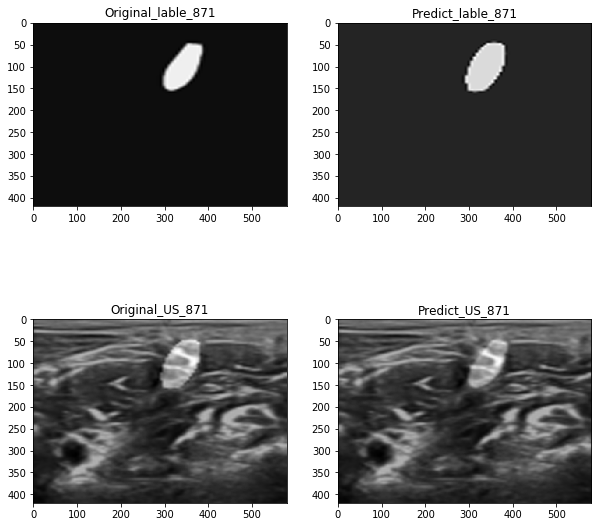

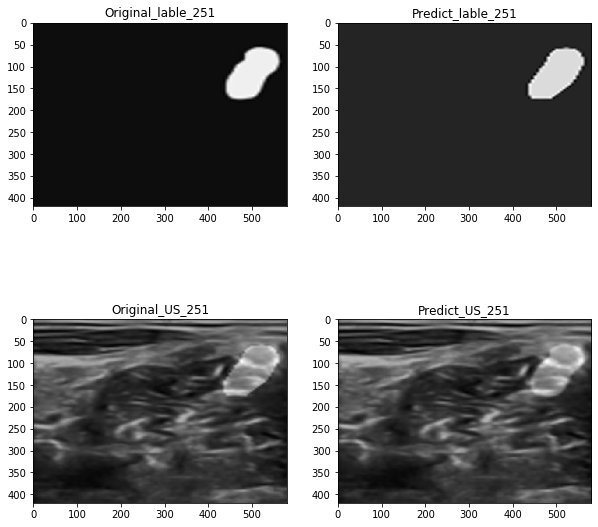

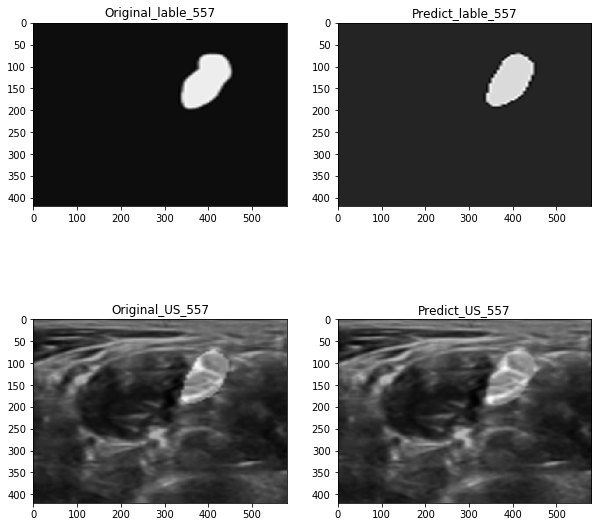

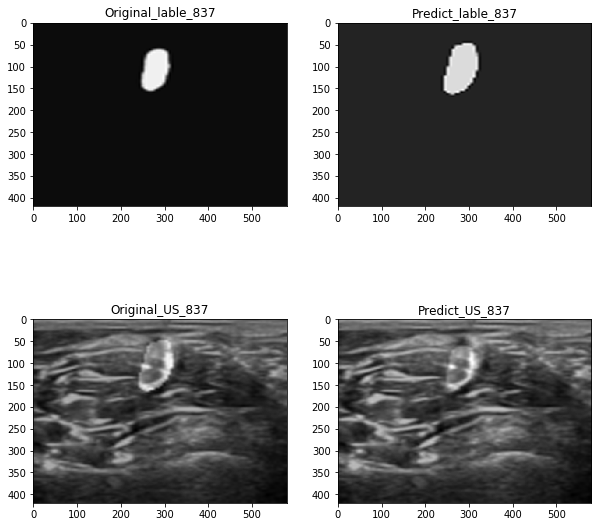

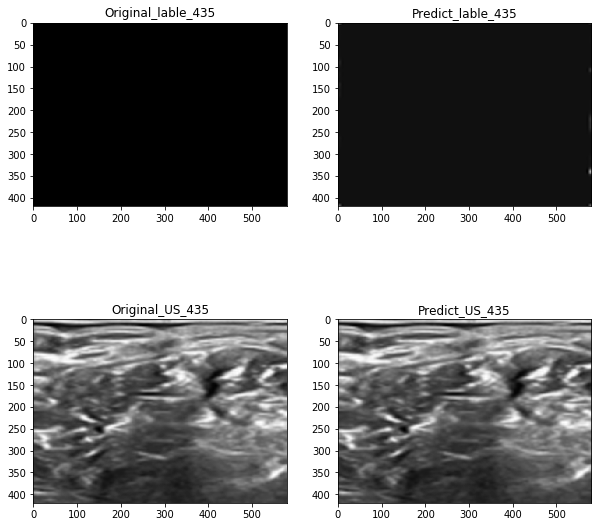

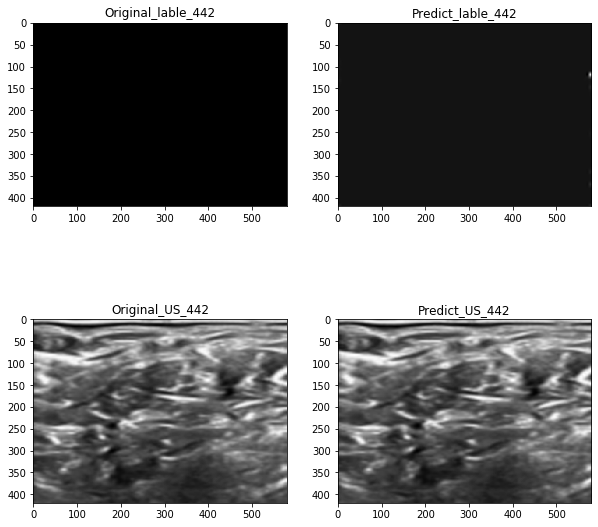

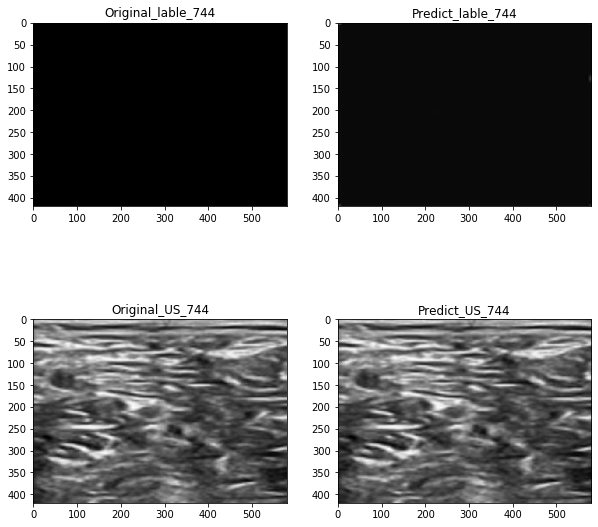

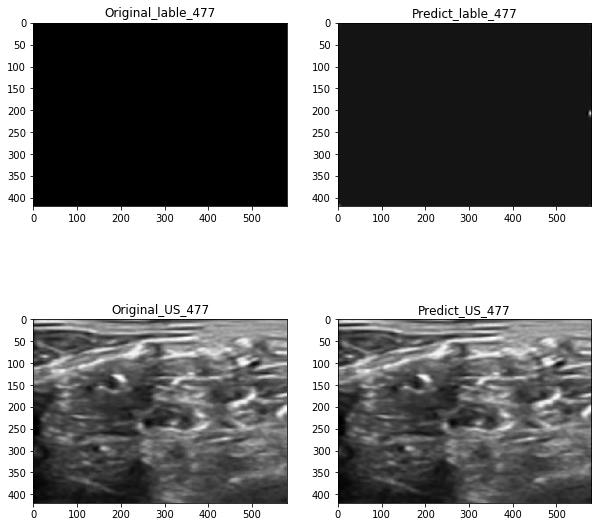

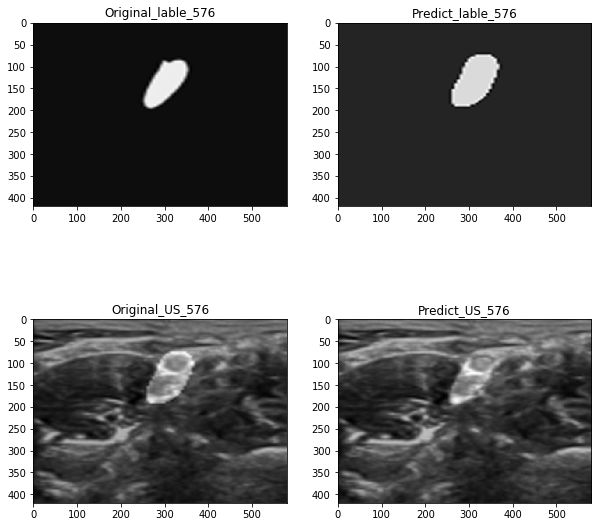

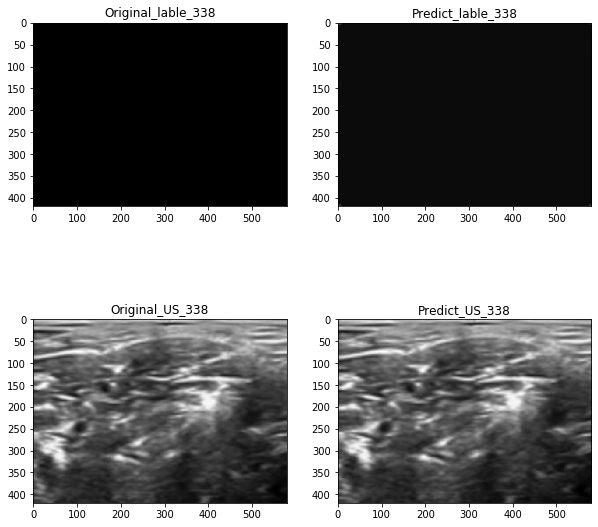


Fold  0
Train on 4508 samples, validate on 1127 samples
Epoch 1/50
 - 17s - loss: 5.1303 - dice_coef: 0.0533 - recall: 0.6905 - precision: 0.0351 - mean_iou: 0.5839 - val_loss: 3.8346 - val_dice_coef: 0.1723 - val_recall: 0.2276 - val_precision: 0.1808 - val_mean_iou: 0.9765
Epoch 2/50
 - 14s - loss: 3.2687 - dice_coef: 0.3641 - recall: 0.4959 - precision: 0.3415 - mean_iou: 0.9749 - val_loss: 2.9561 - val_dice_coef: 0.4020 - val_recall: 0.3970 - val_precision: 0.4578 - val_mean_iou: 0.9854
Epoch 3/50
 - 14s - loss: 2.6933 - dice_coef: 0.4762 - recall: 0.5560 - precision: 0.4428 - mean_iou: 0.9824 - val_loss: 2.5692 - val_dice_coef: 0.4332 - val_recall: 0.5202 - val_precision: 0.3946 - val_mean_iou: 0.9824
Epoch 4/50
 - 14s - loss: 2.3596 - dice_coef: 0.5099 - recall: 0.5763 - precision: 0.4839 - mean_iou: 0.9836 - val_loss: 2.2973 - val_dice_coef: 0.4536 - val_recall: 0.6289 - val_precision: 0.3689 - val_mean_iou: 0.9797
Epoch 5/50
 - 14s - loss: 2.1207 - dice_coef: 0.5262 - recall: 

Epoch 38/50
 - 14s - loss: 0.6378 - dice_coef: 0.6326 - recall: 0.6826 - precision: 0.6153 - mean_iou: 0.9866 - val_loss: 0.7036 - val_dice_coef: 0.5654 - val_recall: 0.6121 - val_precision: 0.5619 - val_mean_iou: 0.9863
Epoch 39/50
 - 14s - loss: 0.6231 - dice_coef: 0.6398 - recall: 0.6783 - precision: 0.6259 - mean_iou: 0.9870 - val_loss: 0.6866 - val_dice_coef: 0.5735 - val_recall: 0.6294 - val_precision: 0.5653 - val_mean_iou: 0.9863
Epoch 40/50
 - 14s - loss: 0.6198 - dice_coef: 0.6354 - recall: 0.6774 - precision: 0.6184 - mean_iou: 0.9870 - val_loss: 0.6892 - val_dice_coef: 0.5655 - val_recall: 0.5957 - val_precision: 0.5896 - val_mean_iou: 0.9868
Epoch 41/50
 - 14s - loss: 0.6133 - dice_coef: 0.6352 - recall: 0.6723 - precision: 0.6263 - mean_iou: 0.9871 - val_loss: 0.6772 - val_dice_coef: 0.5694 - val_recall: 0.6692 - val_precision: 0.5311 - val_mean_iou: 0.9851
Epoch 42/50
 - 14s - loss: 0.6000 - dice_coef: 0.6427 - recall: 0.6796 - precision: 0.6313 - mean_iou: 0.9872 - val_

Epoch 25/50
 - 14s - loss: 0.4889 - dice_coef: 0.6577 - recall: 0.6876 - precision: 0.6519 - mean_iou: 0.9876 - val_loss: 0.5519 - val_dice_coef: 0.5954 - val_recall: 0.6106 - val_precision: 0.6289 - val_mean_iou: 0.9872
Epoch 26/50
 - 14s - loss: 0.4869 - dice_coef: 0.6568 - recall: 0.6874 - precision: 0.6477 - mean_iou: 0.9876 - val_loss: 0.5612 - val_dice_coef: 0.5844 - val_recall: 0.6526 - val_precision: 0.5515 - val_mean_iou: 0.9856
Epoch 27/50
 - 14s - loss: 0.4907 - dice_coef: 0.6524 - recall: 0.6883 - precision: 0.6438 - mean_iou: 0.9876 - val_loss: 0.5552 - val_dice_coef: 0.5873 - val_recall: 0.5945 - val_precision: 0.6233 - val_mean_iou: 0.9872
Epoch 28/50
 - 14s - loss: 0.4928 - dice_coef: 0.6499 - recall: 0.6864 - precision: 0.6448 - mean_iou: 0.9874 - val_loss: 0.5593 - val_dice_coef: 0.5848 - val_recall: 0.5693 - val_precision: 0.6393 - val_mean_iou: 0.9877
Epoch 29/50
 - 14s - loss: 0.4851 - dice_coef: 0.6563 - recall: 0.6900 - precision: 0.6512 - mean_iou: 0.9876 - val_

Epoch 21/50
 - 14s - loss: 0.4460 - dice_coef: 0.6745 - recall: 0.6933 - precision: 0.6756 - mean_iou: 0.9881 - val_loss: 0.4542 - val_dice_coef: 0.6684 - val_recall: 0.7159 - val_precision: 0.6567 - val_mean_iou: 0.9884
Epoch 22/50
 - 14s - loss: 0.4419 - dice_coef: 0.6783 - recall: 0.7000 - precision: 0.6766 - mean_iou: 0.9881 - val_loss: 0.4565 - val_dice_coef: 0.6658 - val_recall: 0.7101 - val_precision: 0.6577 - val_mean_iou: 0.9885
Epoch 23/50
 - 14s - loss: 0.4486 - dice_coef: 0.6711 - recall: 0.6881 - precision: 0.6732 - mean_iou: 0.9880 - val_loss: 0.4561 - val_dice_coef: 0.6658 - val_recall: 0.7192 - val_precision: 0.6496 - val_mean_iou: 0.9883
Epoch 24/50
 - 14s - loss: 0.4434 - dice_coef: 0.6760 - recall: 0.6969 - precision: 0.6789 - mean_iou: 0.9881 - val_loss: 0.4546 - val_dice_coef: 0.6671 - val_recall: 0.7115 - val_precision: 0.6589 - val_mean_iou: 0.9885
Epoch 25/50
 - 14s - loss: 0.4384 - dice_coef: 0.6807 - recall: 0.6953 - precision: 0.6859 - mean_iou: 0.9882 - val_

Epoch 9/50
 - 14s - loss: 0.4333 - dice_coef: 0.6818 - recall: 0.7062 - precision: 0.6792 - mean_iou: 0.9882 - val_loss: 0.4579 - val_dice_coef: 0.6600 - val_recall: 0.6929 - val_precision: 0.6778 - val_mean_iou: 0.9887
Epoch 10/50
 - 14s - loss: 0.4309 - dice_coef: 0.6841 - recall: 0.7063 - precision: 0.6819 - mean_iou: 0.9882 - val_loss: 0.4580 - val_dice_coef: 0.6600 - val_recall: 0.6924 - val_precision: 0.6784 - val_mean_iou: 0.9887
Epoch 11/50
 - 14s - loss: 0.4310 - dice_coef: 0.6841 - recall: 0.7050 - precision: 0.6811 - mean_iou: 0.9882 - val_loss: 0.4580 - val_dice_coef: 0.6600 - val_recall: 0.6918 - val_precision: 0.6816 - val_mean_iou: 0.9887

Epoch 00011: ReduceLROnPlateau reducing learning rate to 1.0000000116860975e-08.
Epoch 00011: early stopping
[0.4579921436976202, 0.6599714159965515, 0.691813051700592, 0.6816354990005493, 0.9886835217475891]


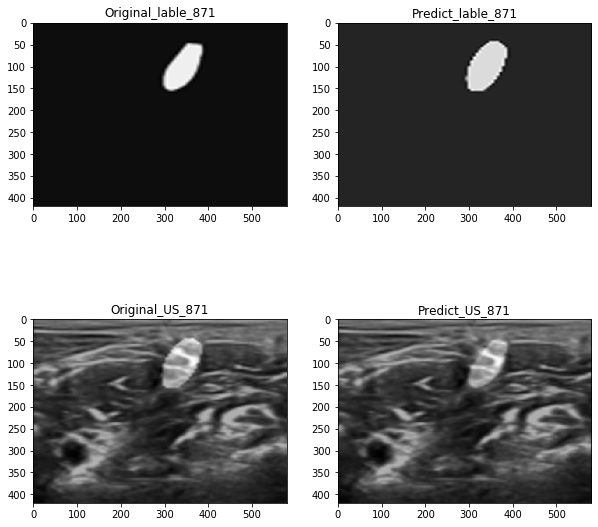

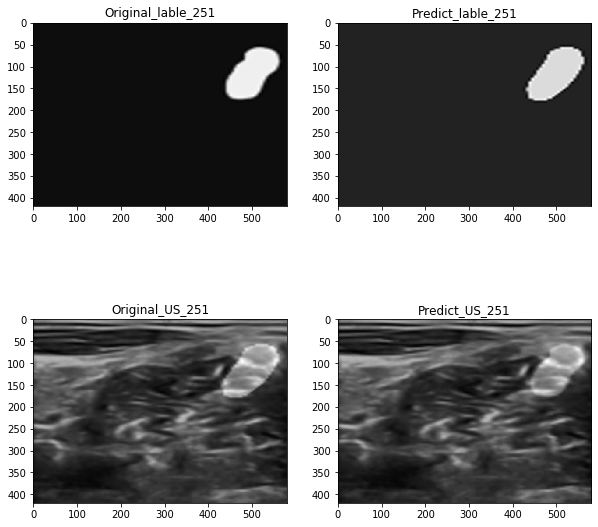

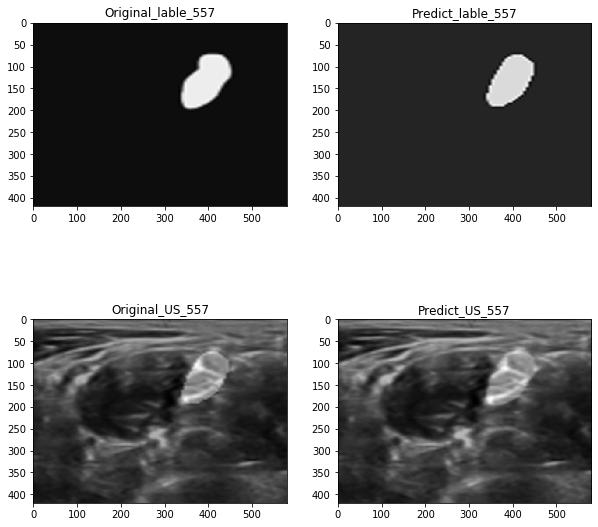

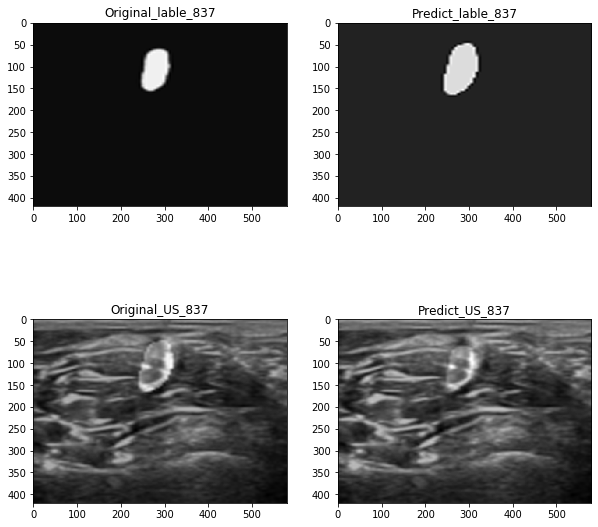

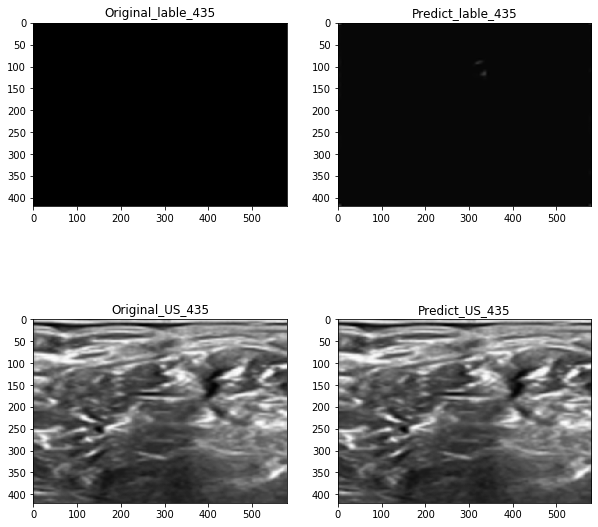

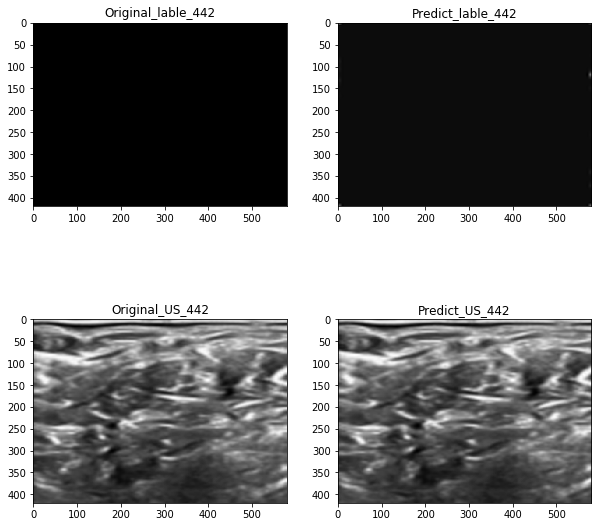

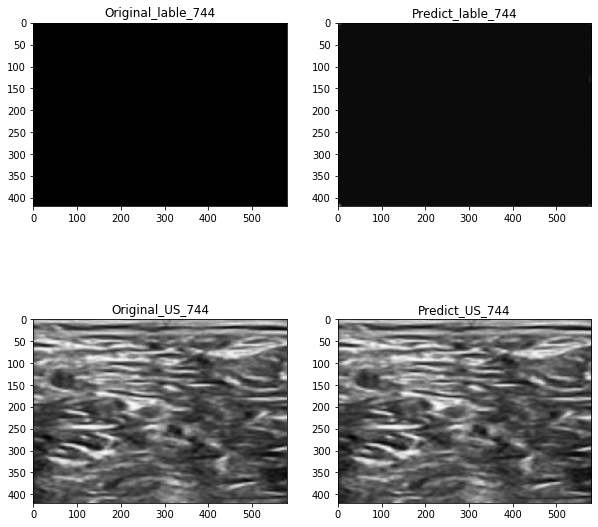

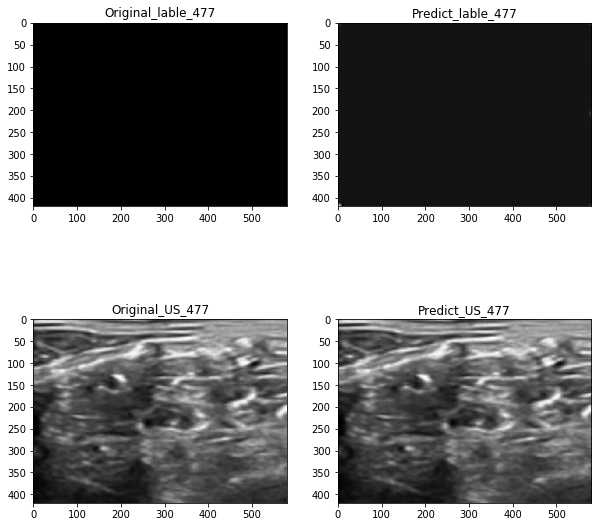

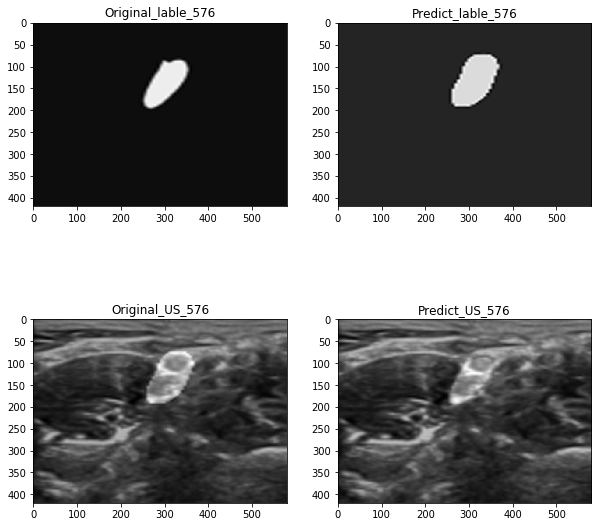

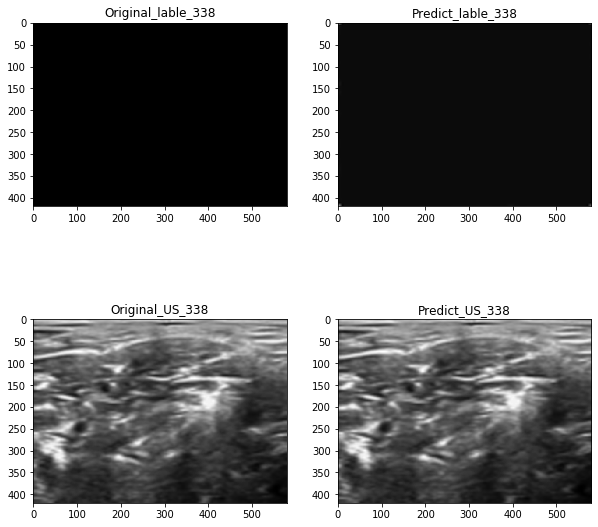


Fold  0
Train on 4508 samples, validate on 1127 samples
Epoch 1/50
 - 17s - loss: 5.1314 - dice_coef: 0.0522 - recall: 0.6999 - precision: 0.0326 - mean_iou: 0.5816 - val_loss: 3.8591 - val_dice_coef: 0.1527 - val_recall: 0.7238 - val_precision: 0.0904 - val_mean_iou: 0.9024
Epoch 2/50
 - 14s - loss: 3.2732 - dice_coef: 0.3526 - recall: 0.5077 - precision: 0.3247 - mean_iou: 0.9669 - val_loss: 2.9230 - val_dice_coef: 0.4164 - val_recall: 0.4560 - val_precision: 0.4201 - val_mean_iou: 0.9838
Epoch 3/50
 - 14s - loss: 2.6733 - dice_coef: 0.4724 - recall: 0.5434 - precision: 0.4454 - mean_iou: 0.9826 - val_loss: 2.5446 - val_dice_coef: 0.4333 - val_recall: 0.4889 - val_precision: 0.4168 - val_mean_iou: 0.9835
Epoch 4/50
 - 14s - loss: 2.3357 - dice_coef: 0.5055 - recall: 0.5753 - precision: 0.4761 - mean_iou: 0.9834 - val_loss: 2.2468 - val_dice_coef: 0.4720 - val_recall: 0.6060 - val_precision: 0.4048 - val_mean_iou: 0.9817
Epoch 5/50
 - 14s - loss: 2.0881 - dice_coef: 0.5262 - recall: 

Epoch 38/50
 - 14s - loss: 0.6285 - dice_coef: 0.6355 - recall: 0.6715 - precision: 0.6231 - mean_iou: 0.9871 - val_loss: 0.6915 - val_dice_coef: 0.5703 - val_recall: 0.6777 - val_precision: 0.5136 - val_mean_iou: 0.9850
Epoch 39/50
 - 14s - loss: 0.6195 - dice_coef: 0.6387 - recall: 0.6737 - precision: 0.6282 - mean_iou: 0.9871 - val_loss: 0.6872 - val_dice_coef: 0.5685 - val_recall: 0.6785 - val_precision: 0.5136 - val_mean_iou: 0.9849
Epoch 40/50
 - 14s - loss: 0.6123 - dice_coef: 0.6394 - recall: 0.6855 - precision: 0.6198 - mean_iou: 0.9869 - val_loss: 0.6828 - val_dice_coef: 0.5679 - val_recall: 0.6471 - val_precision: 0.5432 - val_mean_iou: 0.9855
Epoch 41/50
 - 14s - loss: 0.6111 - dice_coef: 0.6357 - recall: 0.6790 - precision: 0.6183 - mean_iou: 0.9870 - val_loss: 0.6766 - val_dice_coef: 0.5689 - val_recall: 0.6494 - val_precision: 0.5483 - val_mean_iou: 0.9857
Epoch 42/50
 - 14s - loss: 0.5994 - dice_coef: 0.6413 - recall: 0.6814 - precision: 0.6281 - mean_iou: 0.9871 - val_

Epoch 25/50
 - 14s - loss: 0.4871 - dice_coef: 0.6601 - recall: 0.6914 - precision: 0.6505 - mean_iou: 0.9877 - val_loss: 0.5555 - val_dice_coef: 0.5894 - val_recall: 0.5752 - val_precision: 0.6572 - val_mean_iou: 0.9877
Epoch 26/50
 - 14s - loss: 0.4892 - dice_coef: 0.6546 - recall: 0.6849 - precision: 0.6463 - mean_iou: 0.9876 - val_loss: 0.5636 - val_dice_coef: 0.5818 - val_recall: 0.5937 - val_precision: 0.6129 - val_mean_iou: 0.9870
Epoch 27/50
 - 14s - loss: 0.4911 - dice_coef: 0.6513 - recall: 0.6860 - precision: 0.6431 - mean_iou: 0.9876 - val_loss: 0.5463 - val_dice_coef: 0.5968 - val_recall: 0.6037 - val_precision: 0.6398 - val_mean_iou: 0.9873
Epoch 28/50
 - 14s - loss: 0.4861 - dice_coef: 0.6545 - recall: 0.6850 - precision: 0.6498 - mean_iou: 0.9876 - val_loss: 0.5444 - val_dice_coef: 0.5971 - val_recall: 0.6591 - val_precision: 0.5752 - val_mean_iou: 0.9860
Epoch 29/50
 - 14s - loss: 0.4897 - dice_coef: 0.6510 - recall: 0.6841 - precision: 0.6495 - mean_iou: 0.9875 - val_

Epoch 19/50
 - 14s - loss: 0.4401 - dice_coef: 0.6769 - recall: 0.6985 - precision: 0.6757 - mean_iou: 0.9880 - val_loss: 0.4578 - val_dice_coef: 0.6616 - val_recall: 0.7221 - val_precision: 0.6362 - val_mean_iou: 0.9882
Epoch 20/50
 - 14s - loss: 0.4402 - dice_coef: 0.6764 - recall: 0.7018 - precision: 0.6707 - mean_iou: 0.9880 - val_loss: 0.4572 - val_dice_coef: 0.6625 - val_recall: 0.7048 - val_precision: 0.6547 - val_mean_iou: 0.9885
Epoch 21/50
 - 14s - loss: 0.4376 - dice_coef: 0.6787 - recall: 0.6992 - precision: 0.6769 - mean_iou: 0.9881 - val_loss: 0.4562 - val_dice_coef: 0.6628 - val_recall: 0.7219 - val_precision: 0.6378 - val_mean_iou: 0.9882
Epoch 22/50
 - 14s - loss: 0.4356 - dice_coef: 0.6803 - recall: 0.6999 - precision: 0.6801 - mean_iou: 0.9881 - val_loss: 0.4560 - val_dice_coef: 0.6622 - val_recall: 0.7124 - val_precision: 0.6451 - val_mean_iou: 0.9883
Epoch 23/50
 - 14s - loss: 0.4378 - dice_coef: 0.6777 - recall: 0.7025 - precision: 0.6743 - mean_iou: 0.9880 - val_

Epoch 6/50
 - 14s - loss: 0.4217 - dice_coef: 0.6852 - recall: 0.7064 - precision: 0.6834 - mean_iou: 0.9884 - val_loss: 0.4306 - val_dice_coef: 0.6765 - val_recall: 0.7138 - val_precision: 0.6766 - val_mean_iou: 0.9881
Epoch 7/50
 - 14s - loss: 0.4241 - dice_coef: 0.6826 - recall: 0.7078 - precision: 0.6779 - mean_iou: 0.9883 - val_loss: 0.4316 - val_dice_coef: 0.6752 - val_recall: 0.7199 - val_precision: 0.6728 - val_mean_iou: 0.9879
Epoch 8/50
 - 14s - loss: 0.4205 - dice_coef: 0.6860 - recall: 0.7129 - precision: 0.6809 - mean_iou: 0.9883 - val_loss: 0.4308 - val_dice_coef: 0.6758 - val_recall: 0.7072 - val_precision: 0.6859 - val_mean_iou: 0.9882
Epoch 9/50
 - 14s - loss: 0.4204 - dice_coef: 0.6859 - recall: 0.7120 - precision: 0.6810 - mean_iou: 0.9883 - val_loss: 0.4324 - val_dice_coef: 0.6742 - val_recall: 0.7036 - val_precision: 0.6895 - val_mean_iou: 0.9882
Epoch 10/50
 - 14s - loss: 0.4222 - dice_coef: 0.6839 - recall: 0.7101 - precision: 0.6785 - mean_iou: 0.9883 - val_loss

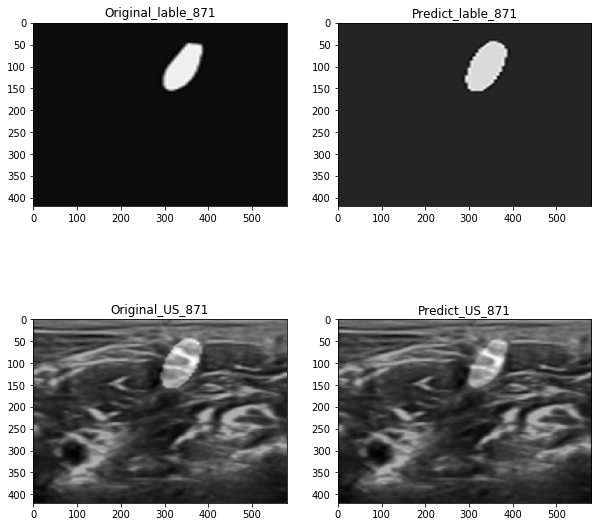

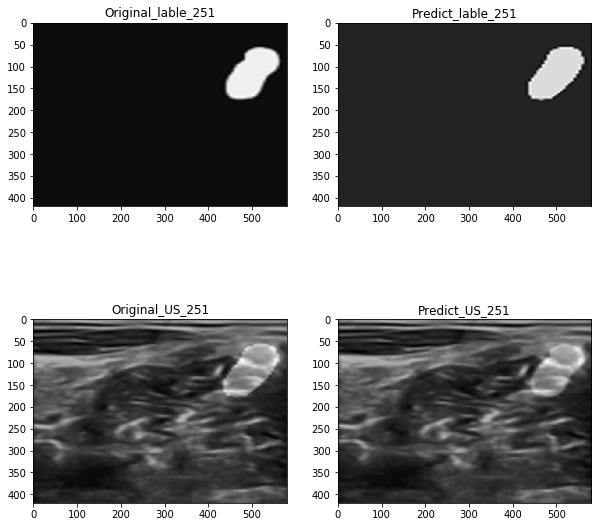

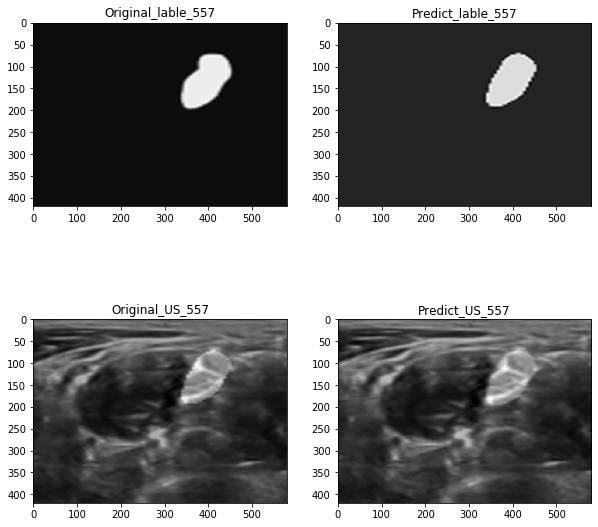

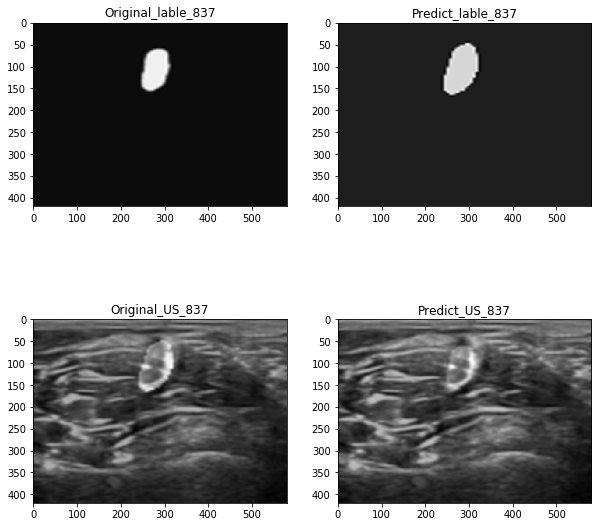

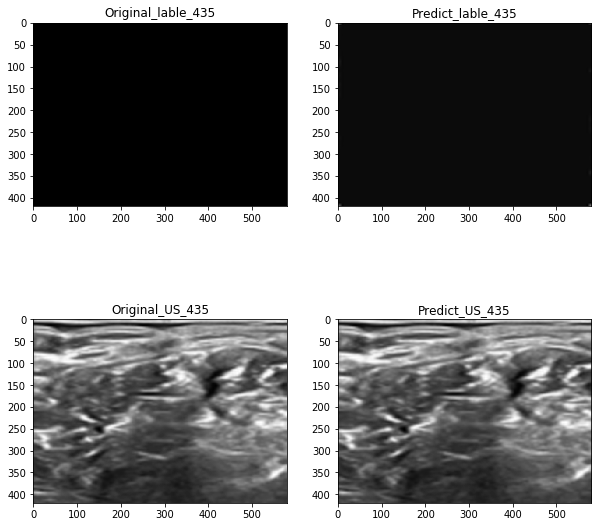

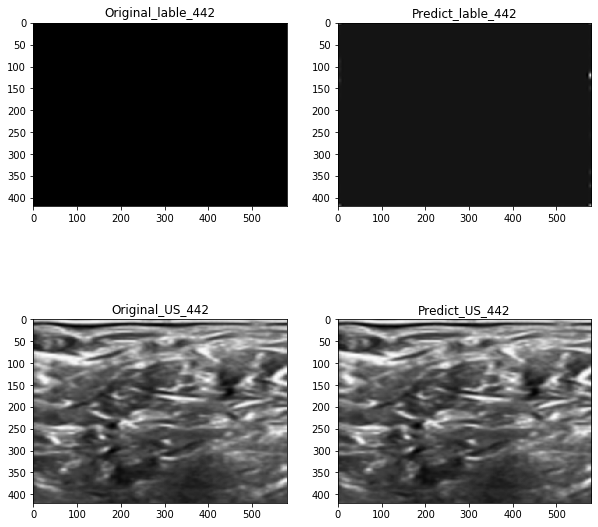

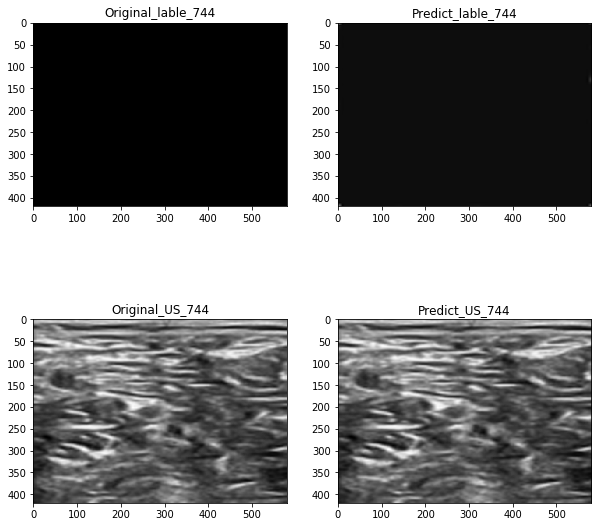

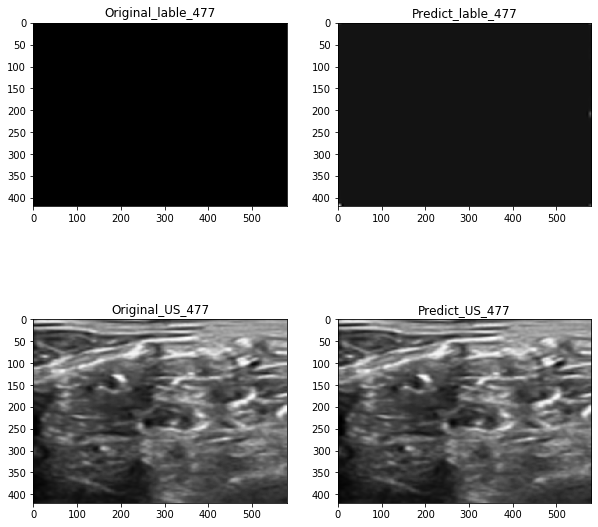

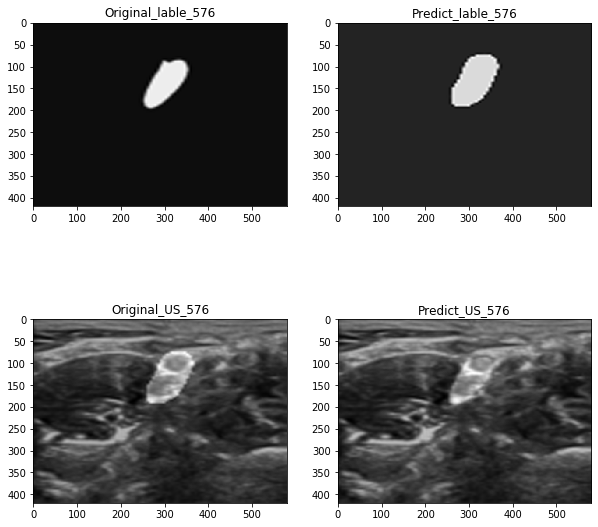

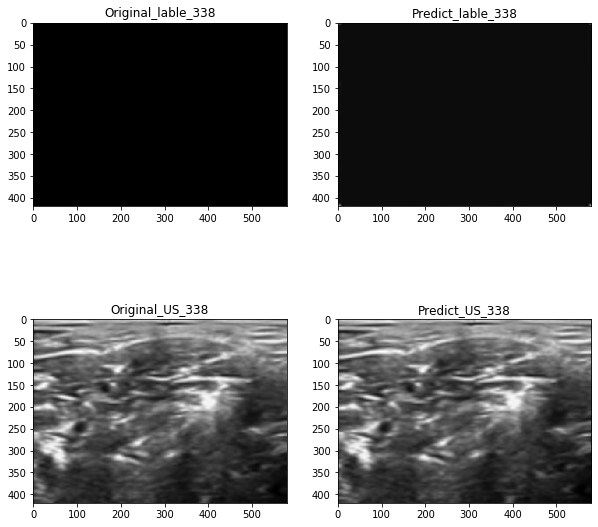


Fold  0
Train on 4508 samples, validate on 1127 samples
Epoch 1/50
 - 17s - loss: 5.1229 - dice_coef: 0.0615 - recall: 0.6691 - precision: 0.0388 - mean_iou: 0.5948 - val_loss: 3.9058 - val_dice_coef: 0.1129 - val_recall: 0.0841 - val_precision: 0.2384 - val_mean_iou: 0.9854
Epoch 2/50
 - 14s - loss: 3.3125 - dice_coef: 0.3652 - recall: 0.4995 - precision: 0.3391 - mean_iou: 0.9752 - val_loss: 3.0514 - val_dice_coef: 0.3643 - val_recall: 0.3241 - val_precision: 0.4782 - val_mean_iou: 0.9862
Epoch 3/50
 - 14s - loss: 2.7694 - dice_coef: 0.4664 - recall: 0.5452 - precision: 0.4397 - mean_iou: 0.9823 - val_loss: 2.6348 - val_dice_coef: 0.4351 - val_recall: 0.5238 - val_precision: 0.3963 - val_mean_iou: 0.9823
Epoch 4/50
 - 14s - loss: 2.4317 - dice_coef: 0.5049 - recall: 0.5765 - precision: 0.4779 - mean_iou: 0.9834 - val_loss: 2.3866 - val_dice_coef: 0.4275 - val_recall: 0.6452 - val_precision: 0.3315 - val_mean_iou: 0.9770
Epoch 5/50
 - 14s - loss: 2.1816 - dice_coef: 0.5267 - recall: 

Epoch 38/50
 - 14s - loss: 0.6385 - dice_coef: 0.6352 - recall: 0.6844 - precision: 0.6166 - mean_iou: 0.9868 - val_loss: 0.7039 - val_dice_coef: 0.5680 - val_recall: 0.6005 - val_precision: 0.5792 - val_mean_iou: 0.9869
Epoch 39/50
 - 14s - loss: 0.6321 - dice_coef: 0.6348 - recall: 0.6700 - precision: 0.6286 - mean_iou: 0.9870 - val_loss: 0.6961 - val_dice_coef: 0.5691 - val_recall: 0.6895 - val_precision: 0.5082 - val_mean_iou: 0.9845
Epoch 40/50
 - 14s - loss: 0.6219 - dice_coef: 0.6382 - recall: 0.6761 - precision: 0.6253 - mean_iou: 0.9871 - val_loss: 0.6884 - val_dice_coef: 0.5703 - val_recall: 0.6570 - val_precision: 0.5409 - val_mean_iou: 0.9855
Epoch 41/50
 - 14s - loss: 0.6252 - dice_coef: 0.6293 - recall: 0.6740 - precision: 0.6138 - mean_iou: 0.9868 - val_loss: 0.6779 - val_dice_coef: 0.5746 - val_recall: 0.6694 - val_precision: 0.5333 - val_mean_iou: 0.9854
Epoch 42/50
 - 14s - loss: 0.6049 - dice_coef: 0.6436 - recall: 0.6768 - precision: 0.6371 - mean_iou: 0.9873 - val_

Epoch 25/50
 - 14s - loss: 0.4962 - dice_coef: 0.6546 - recall: 0.6849 - precision: 0.6468 - mean_iou: 0.9876 - val_loss: 0.5584 - val_dice_coef: 0.5936 - val_recall: 0.6106 - val_precision: 0.6116 - val_mean_iou: 0.9871
Epoch 26/50
 - 14s - loss: 0.4977 - dice_coef: 0.6510 - recall: 0.6895 - precision: 0.6391 - mean_iou: 0.9874 - val_loss: 0.5576 - val_dice_coef: 0.5926 - val_recall: 0.6508 - val_precision: 0.5710 - val_mean_iou: 0.9860
Epoch 27/50
 - 14s - loss: 0.4931 - dice_coef: 0.6540 - recall: 0.6897 - precision: 0.6447 - mean_iou: 0.9876 - val_loss: 0.5504 - val_dice_coef: 0.5965 - val_recall: 0.5914 - val_precision: 0.6414 - val_mean_iou: 0.9876
Epoch 28/50
 - 14s - loss: 0.4919 - dice_coef: 0.6534 - recall: 0.6941 - precision: 0.6430 - mean_iou: 0.9874 - val_loss: 0.5514 - val_dice_coef: 0.5962 - val_recall: 0.6738 - val_precision: 0.5571 - val_mean_iou: 0.9857
Epoch 29/50
 - 14s - loss: 0.4858 - dice_coef: 0.6584 - recall: 0.6920 - precision: 0.6503 - mean_iou: 0.9877 - val_

Epoch 12/50
 - 14s - loss: 0.4583 - dice_coef: 0.6582 - recall: 0.6849 - precision: 0.6579 - mean_iou: 0.9876 - val_loss: 0.4778 - val_dice_coef: 0.6415 - val_recall: 0.6685 - val_precision: 0.6468 - val_mean_iou: 0.9883
Epoch 13/50
 - 14s - loss: 0.4556 - dice_coef: 0.6599 - recall: 0.6932 - precision: 0.6519 - mean_iou: 0.9875 - val_loss: 0.4775 - val_dice_coef: 0.6404 - val_recall: 0.6876 - val_precision: 0.6250 - val_mean_iou: 0.9880
Epoch 14/50
 - 14s - loss: 0.4532 - dice_coef: 0.6618 - recall: 0.6867 - precision: 0.6581 - mean_iou: 0.9877 - val_loss: 0.4742 - val_dice_coef: 0.6430 - val_recall: 0.6780 - val_precision: 0.6417 - val_mean_iou: 0.9883
Epoch 15/50
 - 14s - loss: 0.4544 - dice_coef: 0.6603 - recall: 0.6863 - precision: 0.6612 - mean_iou: 0.9876 - val_loss: 0.4844 - val_dice_coef: 0.6343 - val_recall: 0.6585 - val_precision: 0.6439 - val_mean_iou: 0.9882
Epoch 16/50
 - 14s - loss: 0.4509 - dice_coef: 0.6645 - recall: 0.6974 - precision: 0.6567 - mean_iou: 0.9876 - val_

Epoch 9/50
 - 14s - loss: 0.4217 - dice_coef: 0.6826 - recall: 0.7072 - precision: 0.6800 - mean_iou: 0.9882 - val_loss: 0.4457 - val_dice_coef: 0.6614 - val_recall: 0.6954 - val_precision: 0.6714 - val_mean_iou: 0.9887
Epoch 10/50
 - 14s - loss: 0.4198 - dice_coef: 0.6843 - recall: 0.7072 - precision: 0.6803 - mean_iou: 0.9882 - val_loss: 0.4465 - val_dice_coef: 0.6606 - val_recall: 0.6940 - val_precision: 0.6716 - val_mean_iou: 0.9887
Epoch 11/50
 - 14s - loss: 0.4205 - dice_coef: 0.6836 - recall: 0.7045 - precision: 0.6826 - mean_iou: 0.9883 - val_loss: 0.4466 - val_dice_coef: 0.6605 - val_recall: 0.6958 - val_precision: 0.6694 - val_mean_iou: 0.9886
Epoch 12/50
 - 14s - loss: 0.4187 - dice_coef: 0.6854 - recall: 0.7085 - precision: 0.6813 - mean_iou: 0.9882 - val_loss: 0.4467 - val_dice_coef: 0.6603 - val_recall: 0.6979 - val_precision: 0.6672 - val_mean_iou: 0.9886
Epoch 13/50
 - 14s - loss: 0.4226 - dice_coef: 0.6815 - recall: 0.7049 - precision: 0.6778 - mean_iou: 0.9882 - val_l

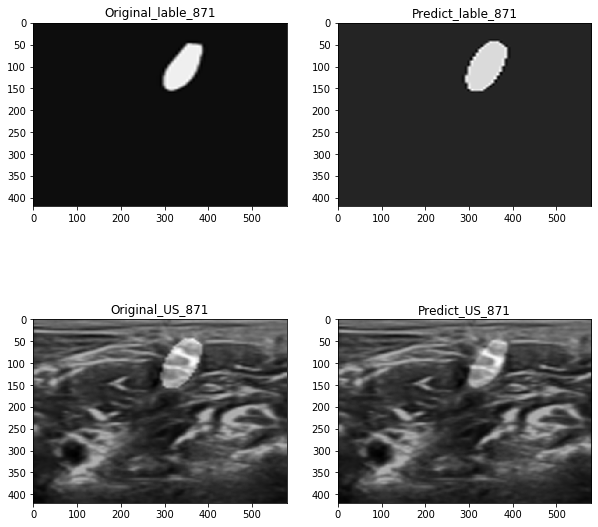

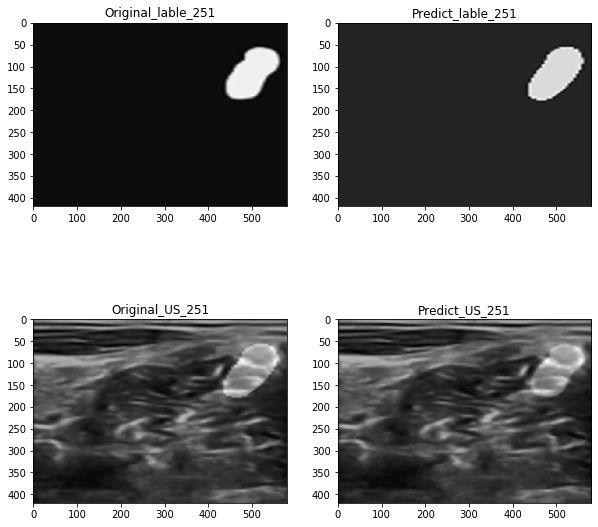

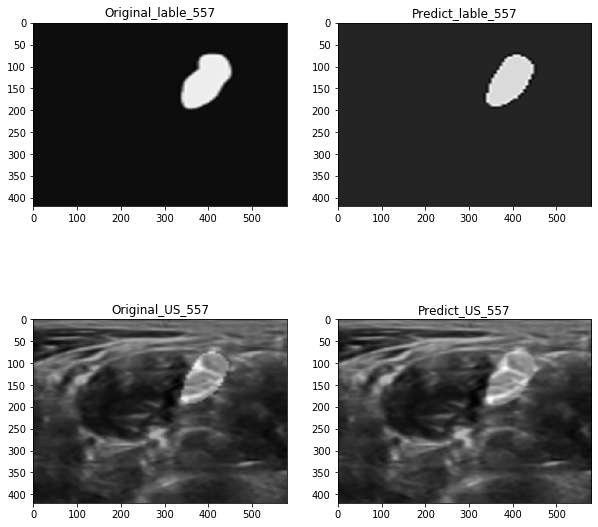

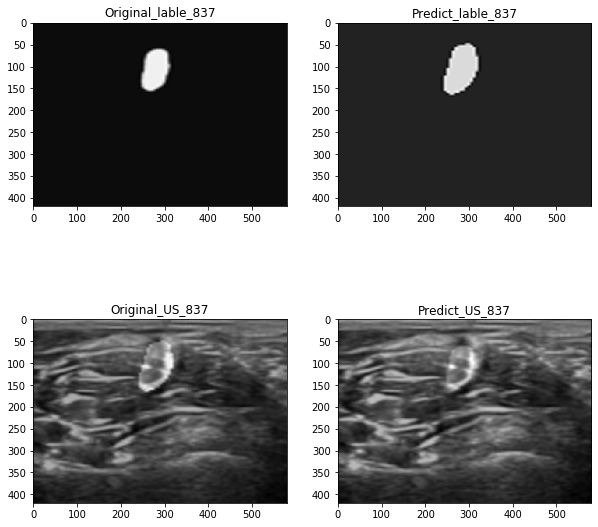

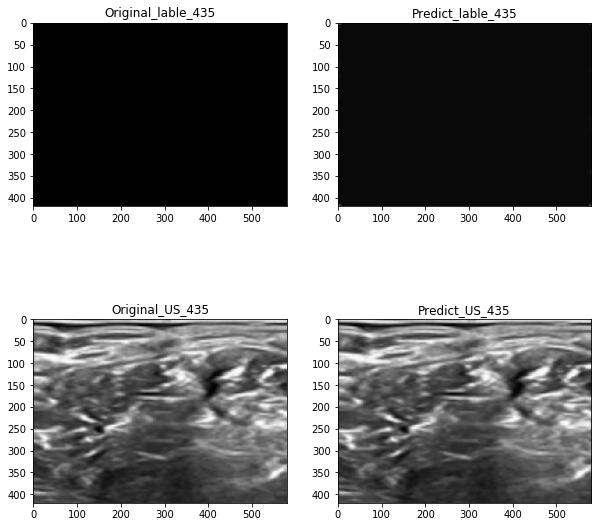

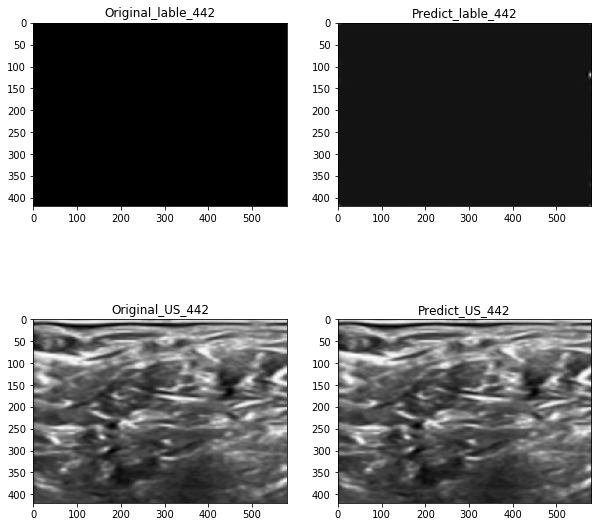

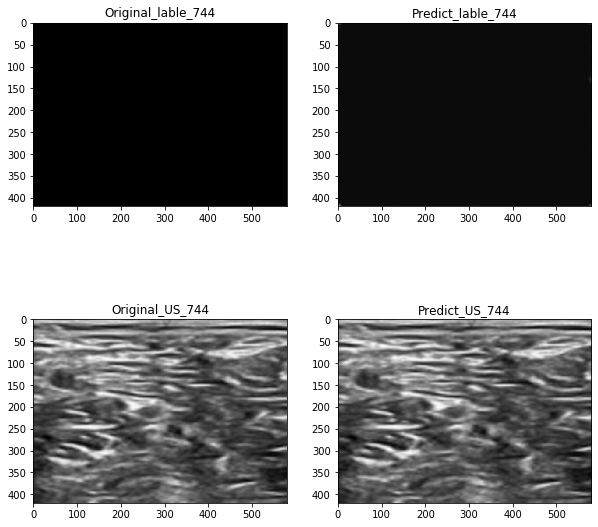

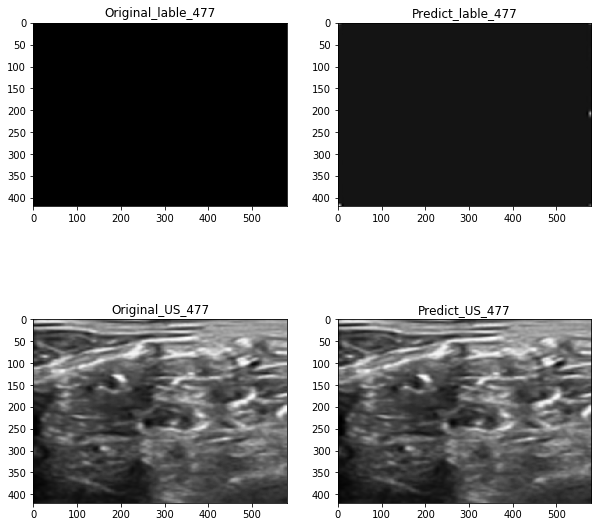

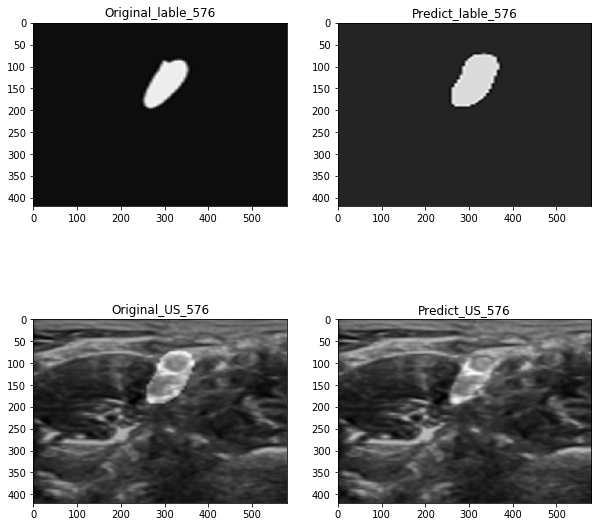

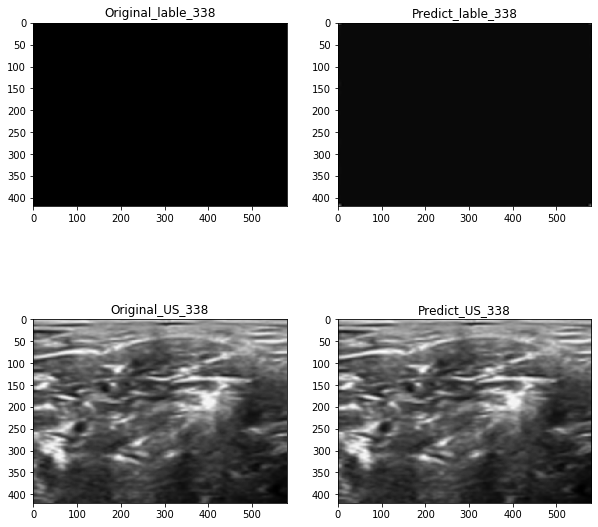


Fold  0
Train on 4508 samples, validate on 1127 samples
Epoch 1/50
 - 17s - loss: 5.1329 - dice_coef: 0.0515 - recall: 0.6973 - precision: 0.0322 - mean_iou: 0.5789 - val_loss: 3.8386 - val_dice_coef: 0.1761 - val_recall: 0.2154 - val_precision: 0.1918 - val_mean_iou: 0.9779
Epoch 2/50
 - 14s - loss: 3.2969 - dice_coef: 0.3310 - recall: 0.5064 - precision: 0.3085 - mean_iou: 0.9658 - val_loss: 2.9419 - val_dice_coef: 0.3907 - val_recall: 0.3950 - val_precision: 0.4316 - val_mean_iou: 0.9848
Epoch 3/50
 - 14s - loss: 2.6661 - dice_coef: 0.4691 - recall: 0.5433 - precision: 0.4428 - mean_iou: 0.9826 - val_loss: 2.5321 - val_dice_coef: 0.4304 - val_recall: 0.4921 - val_precision: 0.4100 - val_mean_iou: 0.9832
Epoch 4/50
 - 14s - loss: 2.3209 - dice_coef: 0.5071 - recall: 0.5769 - precision: 0.4790 - mean_iou: 0.9834 - val_loss: 2.2446 - val_dice_coef: 0.4615 - val_recall: 0.6589 - val_precision: 0.3671 - val_mean_iou: 0.9791
Epoch 5/50
 - 14s - loss: 2.0743 - dice_coef: 0.5286 - recall: 

Epoch 38/50
 - 14s - loss: 0.6162 - dice_coef: 0.6391 - recall: 0.6801 - precision: 0.6254 - mean_iou: 0.9870 - val_loss: 0.6998 - val_dice_coef: 0.5546 - val_recall: 0.5765 - val_precision: 0.5912 - val_mean_iou: 0.9870
Epoch 39/50
 - 14s - loss: 0.6120 - dice_coef: 0.6374 - recall: 0.6690 - precision: 0.6284 - mean_iou: 0.9871 - val_loss: 0.6796 - val_dice_coef: 0.5680 - val_recall: 0.6689 - val_precision: 0.5149 - val_mean_iou: 0.9851
Epoch 40/50
 - 14s - loss: 0.6040 - dice_coef: 0.6397 - recall: 0.6811 - precision: 0.6253 - mean_iou: 0.9871 - val_loss: 0.6792 - val_dice_coef: 0.5650 - val_recall: 0.5813 - val_precision: 0.5993 - val_mean_iou: 0.9871
Epoch 41/50
 - 14s - loss: 0.6042 - dice_coef: 0.6350 - recall: 0.6674 - precision: 0.6328 - mean_iou: 0.9872 - val_loss: 0.6636 - val_dice_coef: 0.5752 - val_recall: 0.6444 - val_precision: 0.5583 - val_mean_iou: 0.9860
Epoch 42/50
 - 14s - loss: 0.5936 - dice_coef: 0.6406 - recall: 0.6742 - precision: 0.6300 - mean_iou: 0.9872 - val_

Epoch 25/50
 - 14s - loss: 0.4861 - dice_coef: 0.6568 - recall: 0.6852 - precision: 0.6496 - mean_iou: 0.9877 - val_loss: 0.5814 - val_dice_coef: 0.5615 - val_recall: 0.5231 - val_precision: 0.6713 - val_mean_iou: 0.9882
Epoch 26/50
 - 14s - loss: 0.4849 - dice_coef: 0.6563 - recall: 0.6850 - precision: 0.6503 - mean_iou: 0.9876 - val_loss: 0.5616 - val_dice_coef: 0.5820 - val_recall: 0.6198 - val_precision: 0.5765 - val_mean_iou: 0.9865
Epoch 27/50
 - 14s - loss: 0.4897 - dice_coef: 0.6516 - recall: 0.6855 - precision: 0.6467 - mean_iou: 0.9876 - val_loss: 0.5527 - val_dice_coef: 0.5913 - val_recall: 0.6044 - val_precision: 0.6169 - val_mean_iou: 0.9873
Epoch 28/50
 - 14s - loss: 0.4910 - dice_coef: 0.6496 - recall: 0.6886 - precision: 0.6370 - mean_iou: 0.9874 - val_loss: 0.5543 - val_dice_coef: 0.5893 - val_recall: 0.6143 - val_precision: 0.5957 - val_mean_iou: 0.9868
Epoch 29/50
 - 14s - loss: 0.4848 - dice_coef: 0.6552 - recall: 0.6832 - precision: 0.6566 - mean_iou: 0.9877 - val_


Epoch 00011: ReduceLROnPlateau reducing learning rate to 9.999999747378752e-06.
Epoch 00011: early stopping
[0.4923101711188573, 0.6264525055885315, 0.7314704060554504, 0.573375940322876, 0.9867169260978699]

Fold  3
Train on 4508 samples, validate on 1127 samples
Epoch 1/50
 - 14s - loss: 0.4485 - dice_coef: 0.6674 - recall: 0.7032 - precision: 0.6541 - mean_iou: 0.9878 - val_loss: 0.4509 - val_dice_coef: 0.6635 - val_recall: 0.6933 - val_precision: 0.6723 - val_mean_iou: 0.9879
Epoch 2/50
 - 14s - loss: 0.4441 - dice_coef: 0.6709 - recall: 0.7032 - precision: 0.6581 - mean_iou: 0.9880 - val_loss: 0.4505 - val_dice_coef: 0.6631 - val_recall: 0.6851 - val_precision: 0.6799 - val_mean_iou: 0.9881
Epoch 3/50
 - 14s - loss: 0.4387 - dice_coef: 0.6754 - recall: 0.7001 - precision: 0.6729 - mean_iou: 0.9882 - val_loss: 0.4489 - val_dice_coef: 0.6643 - val_recall: 0.6792 - val_precision: 0.6891 - val_mean_iou: 0.9882
Epoch 4/50
 - 14s - loss: 0.4380 - dice_coef: 0.6755 - recall: 0.7014 - pr

Epoch 11/50
 - 14s - loss: 0.4183 - dice_coef: 0.6854 - recall: 0.7021 - precision: 0.6872 - mean_iou: 0.9883 - val_loss: 0.4381 - val_dice_coef: 0.6698 - val_recall: 0.6985 - val_precision: 0.7066 - val_mean_iou: 0.9889

Epoch 00011: ReduceLROnPlateau reducing learning rate to 9.999999974752428e-08.
Epoch 00011: early stopping
[0.4381468220289132, 0.6698487997055054, 0.6984913349151611, 0.7066314220428467, 0.988866925239563]


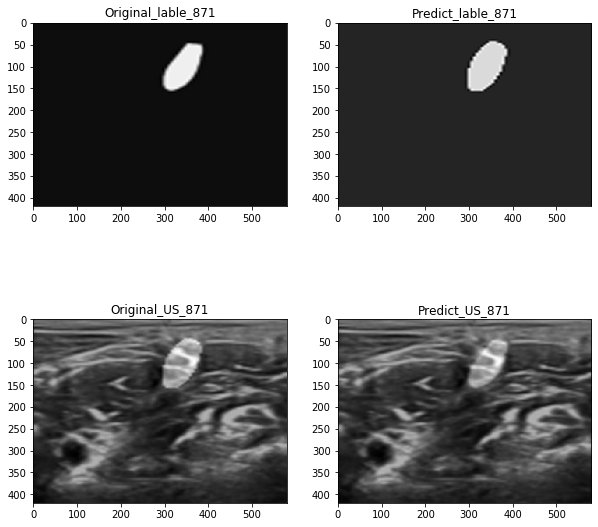

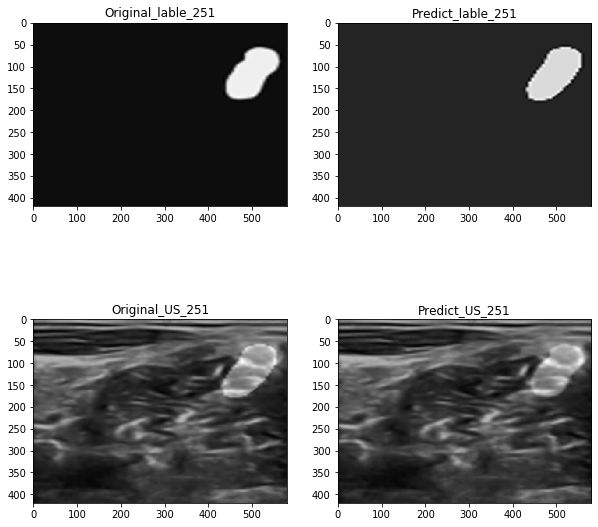

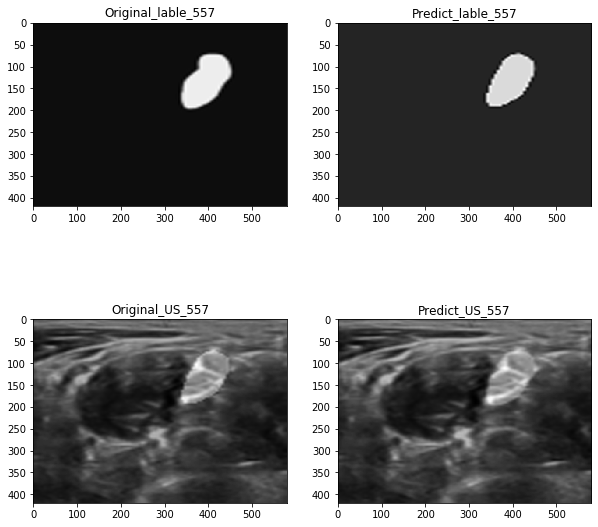

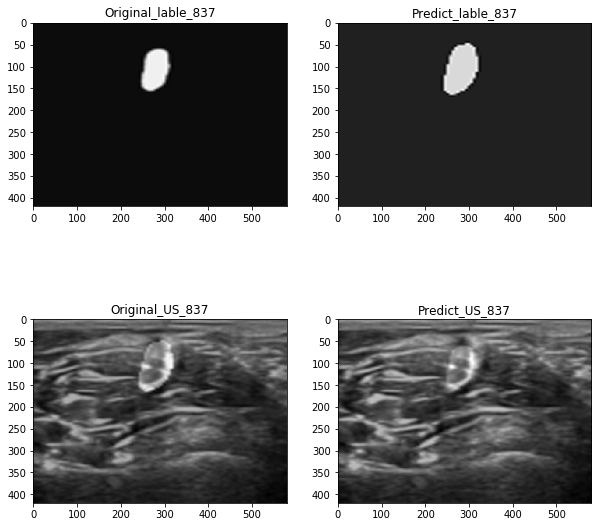

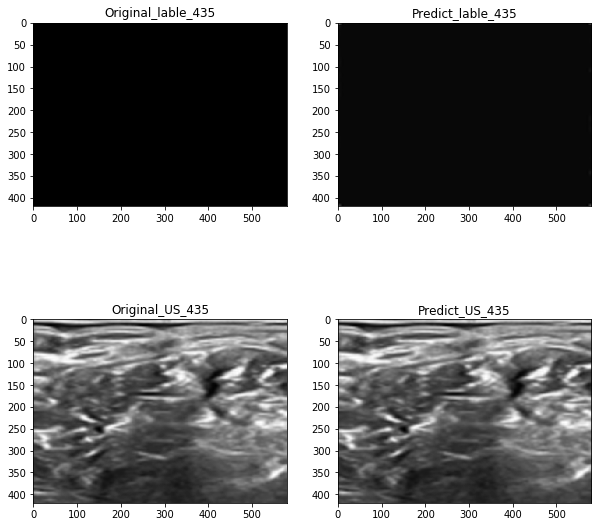

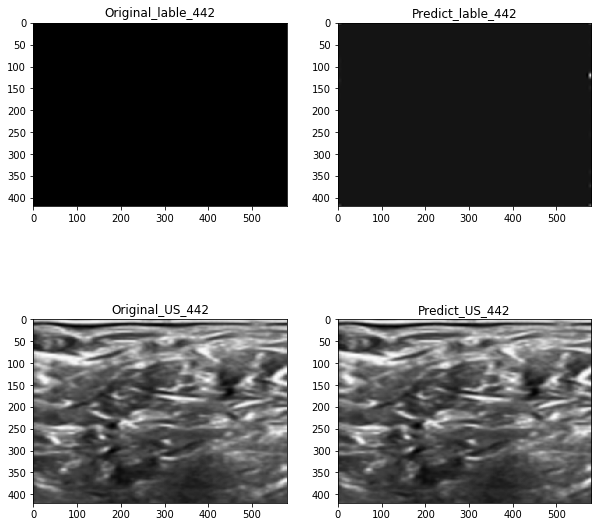

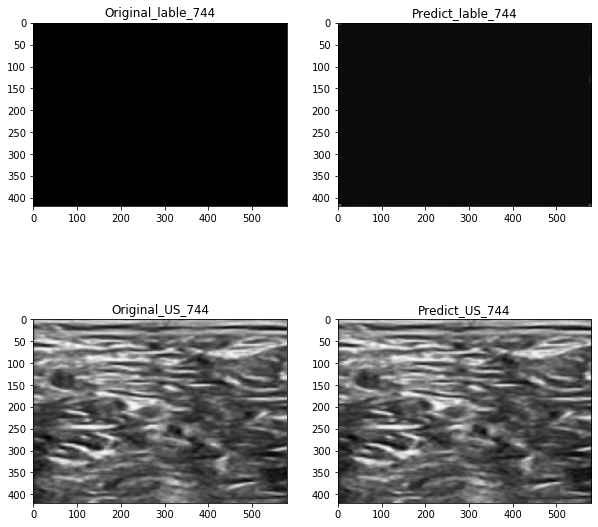

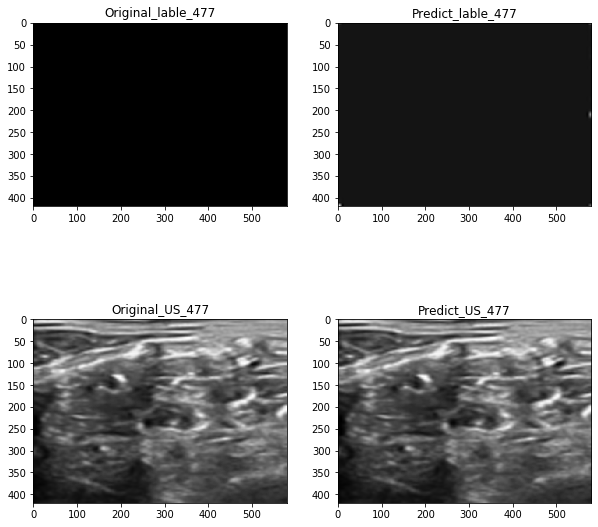

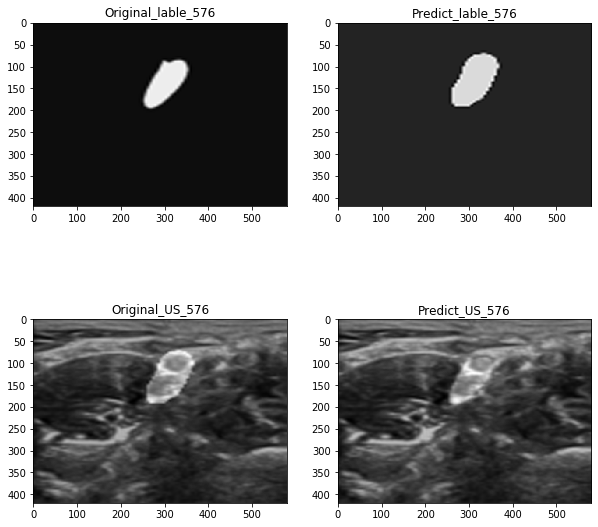

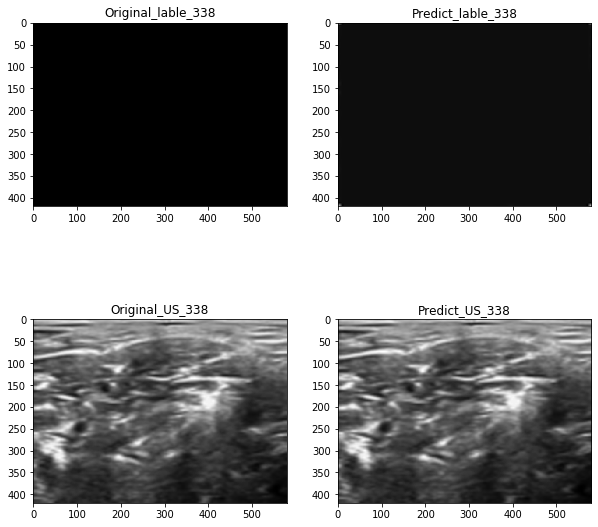

In [33]:
import h5py
import pandas as pd
import time
for ind_fil in ['']:
    '''
    image_t =h5py.File('./imgs_train_lemva_5_'+str(ind_fil) +'.h5', 'r')
    image_t =image_t.get('image')
    image_t= np.array(image_t)
    image_t=np.transpose(image_t)
    image_c = preprocess_img_n(image_t, ind_fil)
    '''
    for ind in ["/","/새 폴더", "/새 폴더 (2)", "/새 폴더 (3)", "/새 폴더 (4)"]:
        path = "./Result/U-Net/ori"+str(ind_fil) +ind
        CAE = get_unet()

        for j, (train_idx, val_idx) in enumerate(folds):
            now = time.localtime()
            s = "%02d-%02d-%02d_%02d;%02d" % (now.tm_year-2000,
                                          now.tm_mon, now.tm_mday, now.tm_hour, now.tm_min)
            print('\nFold ', j)
            image_train_cv = image_c[train_idx]
            mask_train_cv = mask_c[train_idx]
            image_valid_cv = image_c[val_idx]
            mask_valid_cv = mask_c[val_idx]

            name_weights = path+"/final_model_fold_" + \
                str(j) + "_weights.h5"
            callbackk = get_callbacks(name_weights=name_weights, patience_lr=10)

            history = CAE.fit(image_train_cv, mask_train_cv, epochs=50, verbose=2, shuffle=True, validation_data=(
            image_valid_cv, mask_valid_cv), batch_size=32, callbacks=callbackk)

            if history.history['dice_coef'][-1] < 0.05:
                break
            df = pd.DataFrame({"val_loss": history.history['val_loss'],
                           "val_dice_coef": history.history['val_dice_coef'],
                           "val_precision": history.history['val_precision'],
                           "val_recall": history.history['val_recall']})
            df = df*100
            df.to_csv(
                path+'/history_{:2.3}_{}.csv'.format(history.history['val_dice_coef'][-1], s))
            print(CAE.evaluate(image_valid_cv, mask_valid_cv, verbose=2))

        mask_predict = CAE.predict(image_valid_cv, verbose=2)

        mask_r = mask_predict.reshape(1127, 96, 96)
        mask_test_u = mask_valid_cv.reshape(1127, 96, 96)
        image_test_u = image_valid_cv.reshape(1127, 96, 96)

        img_test_o = (mask_r*2)+image_test_u
        img_predict_o = image_test_u+(mask_test_u*2)

        np.random.seed(0)
        for num in np.random.choice(1127, 10, replace=False):
            plt.figure(figsize=(10, 10))
            plt.subplot(2, 2, 1)
            plt.imshow(cv2.resize(mask_test_u[num], (580, 420),
                                  interpolation=cv2.INTER_CUBIC), cmap='gray')
            plt.title('Original_lable_'+str(num))

            plt.subplot(2, 2, 2)
            plt.imshow(cv2.resize(mask_r[num], (580, 420),
                                  interpolation=cv2.INTER_CUBIC), cmap='gray')
            plt.title('Predict_lable_'+str(num))

            plt.subplot(2, 2, 3)
            plt.imshow(cv2.resize(img_test_o[num], (580, 420),
                                  interpolation=cv2.INTER_CUBIC), cmap='gray')
            plt.title('Original_US_'+str(num))

            plt.subplot(2, 2, 4)
            plt.imshow(cv2.resize(img_predict_o[num], (580, 420),
                                  interpolation=cv2.INTER_CUBIC), cmap='gray')
            plt.title('Predict_US_'+str(num))
            plt.savefig(path+'/Result'+str(num)+'.png')
            plt.show()

In [13]:
def preprocess_img_n(imgs,lit):
    imgs_p = np.ndarray(
        (imgs.shape[0], train_image_rows, train_image_cols), dtype=np.float32)
    for i in tqdm_notebook(np.arange(0,imgs.shape[0])):
        #imgs = cv2.blur(imgs[i].astype('float32').astype('float32'),(lit,lit))
        imgs_p[i] = resize(imgs[i].astype('float32'), (train_image_rows,
                                                       train_image_cols), mode='reflect', preserve_range=True)
        mean = np.mean(imgs_p[i])
        std = np.std(imgs_p[i])

        imgs_p[i] -= mean
        imgs_p[i] /= std
        
    imgs_p = imgs_p[..., np.newaxis]
    return imgs_p


Fold  0
Train on 4508 samples, validate on 1127 samples
Epoch 1/50
 - 16s - loss: 5.1284 - dice_coef: 0.1224 - recall: 0.6017 - precision: 0.0924 - mean_iou: 0.7202 - val_loss: 4.0091 - val_dice_coef: 0.2625 - val_recall: 0.6160 - val_precision: 0.1747 - val_mean_iou: 0.9562
Epoch 2/50
 - 14s - loss: 3.5440 - dice_coef: 0.3570 - recall: 0.4671 - precision: 0.3218 - mean_iou: 0.9771 - val_loss: 3.2189 - val_dice_coef: 0.3727 - val_recall: 0.4643 - val_precision: 0.3310 - val_mean_iou: 0.9800
Epoch 3/50
 - 14s - loss: 2.9544 - dice_coef: 0.4297 - recall: 0.5161 - precision: 0.3933 - mean_iou: 0.9809 - val_loss: 2.8183 - val_dice_coef: 0.3747 - val_recall: 0.4236 - val_precision: 0.3681 - val_mean_iou: 0.9820
Epoch 4/50
 - 14s - loss: 2.5850 - dice_coef: 0.4641 - recall: 0.5392 - precision: 0.4268 - mean_iou: 0.9822 - val_loss: 2.5041 - val_dice_coef: 0.4048 - val_recall: 0.4427 - val_precision: 0.4023 - val_mean_iou: 0.9833
Epoch 5/50
 - 14s - loss: 2.3169 - dice_coef: 0.4845 - recall: 

Epoch 38/50
 - 14s - loss: 0.7005 - dice_coef: 0.6285 - recall: 0.6591 - precision: 0.6225 - mean_iou: 0.9870 - val_loss: 0.7708 - val_dice_coef: 0.5522 - val_recall: 0.6029 - val_precision: 0.5427 - val_mean_iou: 0.9860
Epoch 39/50
 - 14s - loss: 0.6919 - dice_coef: 0.6285 - recall: 0.6716 - precision: 0.6126 - mean_iou: 0.9868 - val_loss: 0.7713 - val_dice_coef: 0.5438 - val_recall: 0.6115 - val_precision: 0.5218 - val_mean_iou: 0.9854
Epoch 40/50
 - 14s - loss: 0.6834 - dice_coef: 0.6291 - recall: 0.6614 - precision: 0.6234 - mean_iou: 0.9870 - val_loss: 0.7470 - val_dice_coef: 0.5609 - val_recall: 0.6411 - val_precision: 0.5270 - val_mean_iou: 0.9854
Epoch 41/50
 - 14s - loss: 0.6802 - dice_coef: 0.6248 - recall: 0.6630 - precision: 0.6158 - mean_iou: 0.9868 - val_loss: 0.7455 - val_dice_coef: 0.5553 - val_recall: 0.6182 - val_precision: 0.5424 - val_mean_iou: 0.9857
Epoch 42/50
 - 14s - loss: 0.6619 - dice_coef: 0.6366 - recall: 0.6683 - precision: 0.6297 - mean_iou: 0.9872 - val_

Epoch 25/50
 - 14s - loss: 0.5247 - dice_coef: 0.6503 - recall: 0.6826 - precision: 0.6434 - mean_iou: 0.9874 - val_loss: 0.6022 - val_dice_coef: 0.5728 - val_recall: 0.6166 - val_precision: 0.5698 - val_mean_iou: 0.9862
Epoch 26/50
 - 14s - loss: 0.5207 - dice_coef: 0.6521 - recall: 0.6848 - precision: 0.6472 - mean_iou: 0.9875 - val_loss: 0.5961 - val_dice_coef: 0.5779 - val_recall: 0.6021 - val_precision: 0.5983 - val_mean_iou: 0.9867
Epoch 27/50
 - 14s - loss: 0.5207 - dice_coef: 0.6508 - recall: 0.6863 - precision: 0.6416 - mean_iou: 0.9875 - val_loss: 0.6039 - val_dice_coef: 0.5674 - val_recall: 0.5701 - val_precision: 0.6063 - val_mean_iou: 0.9871
Epoch 28/50
 - 14s - loss: 0.5164 - dice_coef: 0.6527 - recall: 0.6848 - precision: 0.6490 - mean_iou: 0.9876 - val_loss: 0.5996 - val_dice_coef: 0.5699 - val_recall: 0.5674 - val_precision: 0.6100 - val_mean_iou: 0.9872
Epoch 29/50
 - 14s - loss: 0.5154 - dice_coef: 0.6520 - recall: 0.6851 - precision: 0.6418 - mean_iou: 0.9875 - val_

Epoch 22/50
 - 14s - loss: 0.4616 - dice_coef: 0.6801 - recall: 0.7007 - precision: 0.6792 - mean_iou: 0.9882 - val_loss: 0.4771 - val_dice_coef: 0.6678 - val_recall: 0.7170 - val_precision: 0.6571 - val_mean_iou: 0.9884
Epoch 23/50
 - 14s - loss: 0.4615 - dice_coef: 0.6798 - recall: 0.6986 - precision: 0.6813 - mean_iou: 0.9881 - val_loss: 0.4776 - val_dice_coef: 0.6670 - val_recall: 0.7023 - val_precision: 0.6693 - val_mean_iou: 0.9886
Epoch 24/50
 - 14s - loss: 0.4575 - dice_coef: 0.6834 - recall: 0.7034 - precision: 0.6842 - mean_iou: 0.9882 - val_loss: 0.4763 - val_dice_coef: 0.6679 - val_recall: 0.7166 - val_precision: 0.6580 - val_mean_iou: 0.9884
Epoch 25/50
 - 14s - loss: 0.4575 - dice_coef: 0.6829 - recall: 0.7024 - precision: 0.6822 - mean_iou: 0.9882 - val_loss: 0.4746 - val_dice_coef: 0.6691 - val_recall: 0.7025 - val_precision: 0.6740 - val_mean_iou: 0.9886
Epoch 26/50
 - 14s - loss: 0.4520 - dice_coef: 0.6881 - recall: 0.7046 - precision: 0.6906 - mean_iou: 0.9883 - val_

Epoch 7/50
 - 14s - loss: 0.4513 - dice_coef: 0.6832 - recall: 0.7022 - precision: 0.6836 - mean_iou: 0.9882 - val_loss: 0.4628 - val_dice_coef: 0.6763 - val_recall: 0.7025 - val_precision: 0.6942 - val_mean_iou: 0.9889
Epoch 8/50
 - 14s - loss: 0.4464 - dice_coef: 0.6881 - recall: 0.7097 - precision: 0.6864 - mean_iou: 0.9883 - val_loss: 0.4629 - val_dice_coef: 0.6762 - val_recall: 0.7030 - val_precision: 0.6938 - val_mean_iou: 0.9889
Epoch 9/50
 - 14s - loss: 0.4497 - dice_coef: 0.6847 - recall: 0.7063 - precision: 0.6825 - mean_iou: 0.9882 - val_loss: 0.4629 - val_dice_coef: 0.6762 - val_recall: 0.7035 - val_precision: 0.6931 - val_mean_iou: 0.9889
Epoch 10/50
 - 14s - loss: 0.4479 - dice_coef: 0.6866 - recall: 0.7071 - precision: 0.6849 - mean_iou: 0.9883 - val_loss: 0.4629 - val_dice_coef: 0.6762 - val_recall: 0.7033 - val_precision: 0.6933 - val_mean_iou: 0.9889
Epoch 11/50
 - 14s - loss: 0.4474 - dice_coef: 0.6871 - recall: 0.7082 - precision: 0.6838 - mean_iou: 0.9882 - val_los

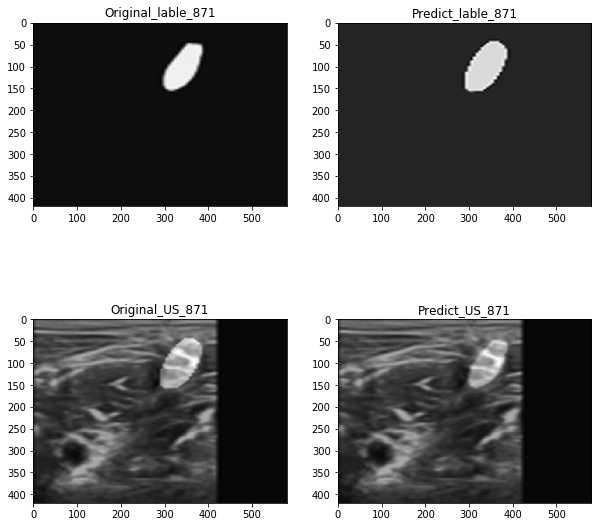

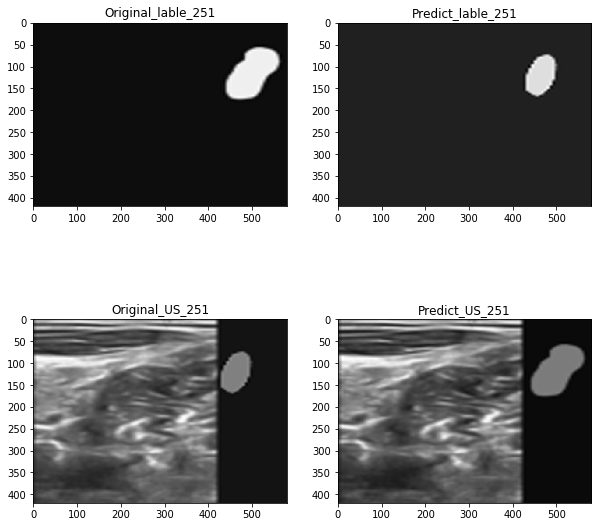

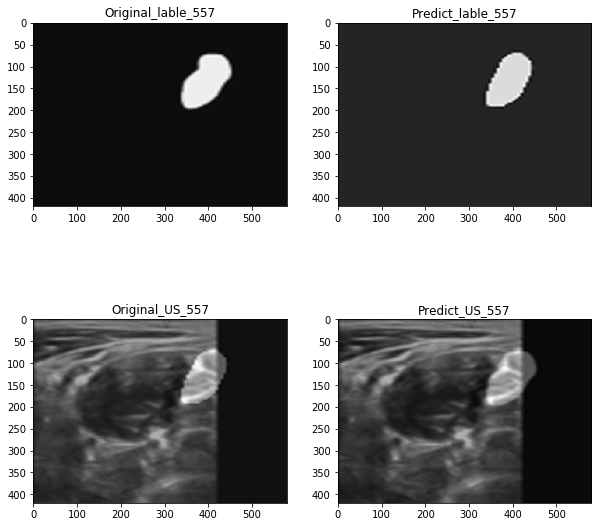

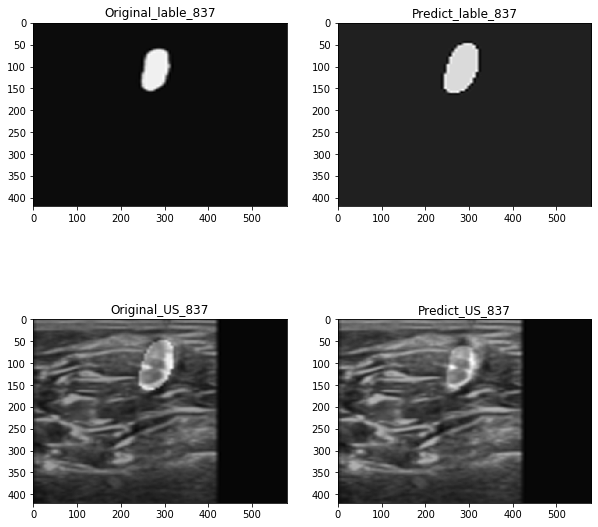

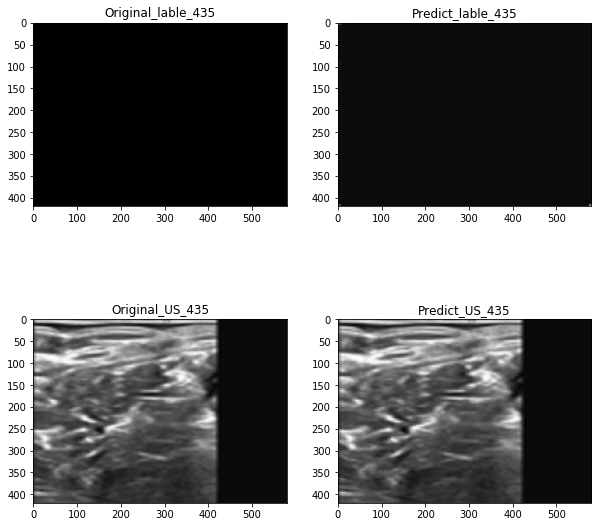

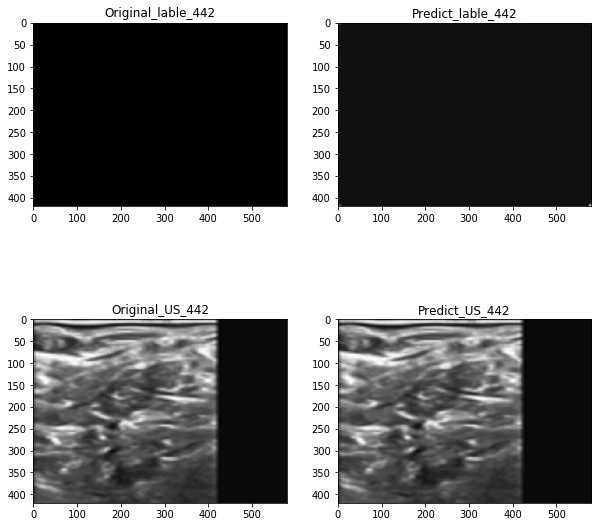

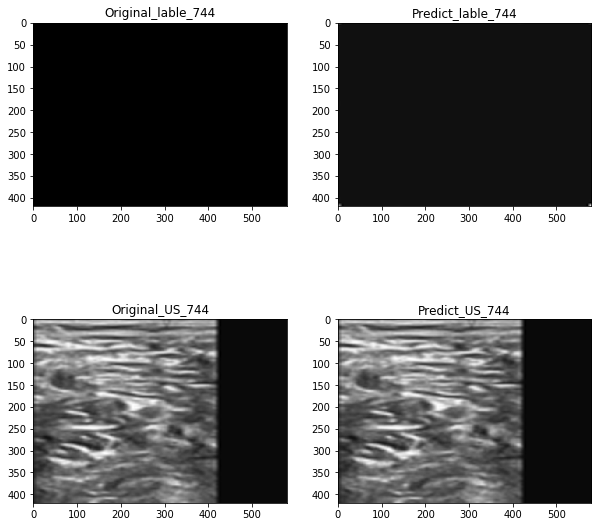

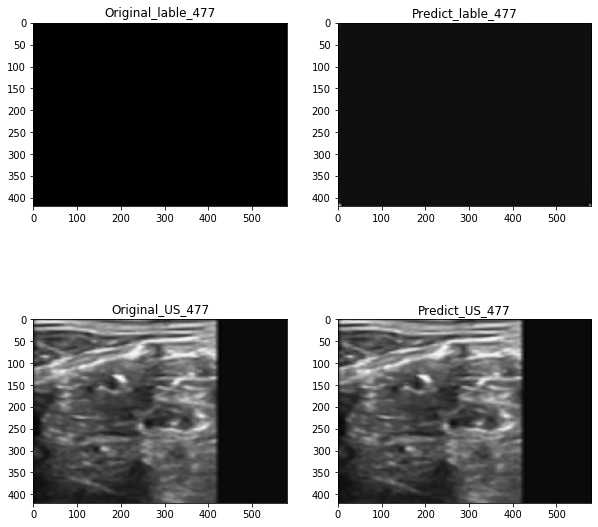

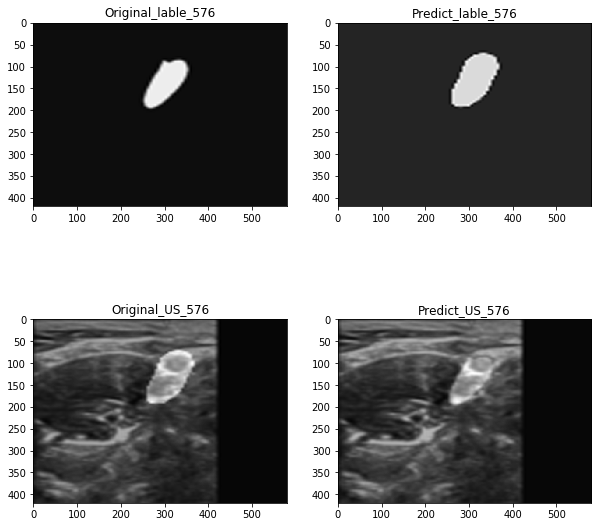

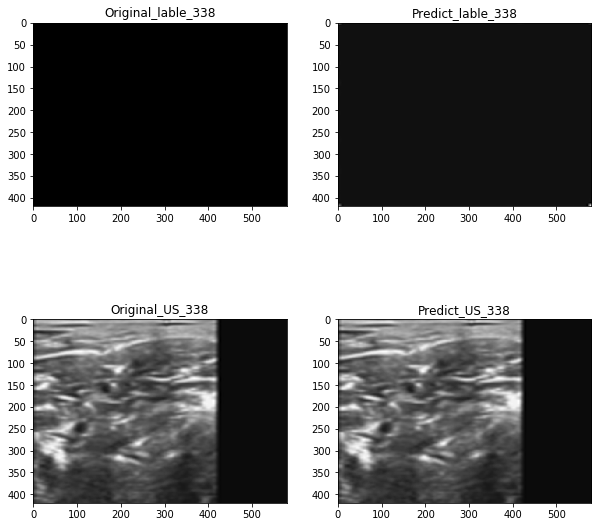


Fold  0
Train on 4508 samples, validate on 1127 samples
Epoch 1/50
 - 17s - loss: 5.1264 - dice_coef: 0.1234 - recall: 0.5959 - precision: 0.0939 - mean_iou: 0.7192 - val_loss: 4.0436 - val_dice_coef: 0.2231 - val_recall: 0.7373 - val_precision: 0.1359 - val_mean_iou: 0.9352
Epoch 2/50
 - 14s - loss: 3.5395 - dice_coef: 0.3613 - recall: 0.4705 - precision: 0.3272 - mean_iou: 0.9776 - val_loss: 3.2362 - val_dice_coef: 0.3643 - val_recall: 0.5401 - val_precision: 0.2894 - val_mean_iou: 0.9756
Epoch 3/50
 - 14s - loss: 2.9600 - dice_coef: 0.4308 - recall: 0.5135 - precision: 0.3978 - mean_iou: 0.9811 - val_loss: 2.8052 - val_dice_coef: 0.3986 - val_recall: 0.5152 - val_precision: 0.3474 - val_mean_iou: 0.9797
Epoch 4/50
 - 14s - loss: 2.5956 - dice_coef: 0.4634 - recall: 0.5381 - precision: 0.4268 - mean_iou: 0.9822 - val_loss: 2.5171 - val_dice_coef: 0.4043 - val_recall: 0.4886 - val_precision: 0.3693 - val_mean_iou: 0.9813
Epoch 5/50
 - 14s - loss: 2.3313 - dice_coef: 0.4811 - recall: 

Epoch 38/50
 - 14s - loss: 0.7047 - dice_coef: 0.6264 - recall: 0.6574 - precision: 0.6214 - mean_iou: 0.9870 - val_loss: 0.7708 - val_dice_coef: 0.5533 - val_recall: 0.6393 - val_precision: 0.5153 - val_mean_iou: 0.9852
Epoch 39/50
 - 14s - loss: 0.6975 - dice_coef: 0.6246 - recall: 0.6521 - precision: 0.6218 - mean_iou: 0.9870 - val_loss: 0.7712 - val_dice_coef: 0.5449 - val_recall: 0.6381 - val_precision: 0.5092 - val_mean_iou: 0.9849
Epoch 40/50
 - 14s - loss: 0.6871 - dice_coef: 0.6264 - recall: 0.6555 - precision: 0.6205 - mean_iou: 0.9870 - val_loss: 0.7575 - val_dice_coef: 0.5522 - val_recall: 0.6094 - val_precision: 0.5408 - val_mean_iou: 0.9859
Epoch 41/50
 - 14s - loss: 0.6832 - dice_coef: 0.6235 - recall: 0.6472 - precision: 0.6264 - mean_iou: 0.9871 - val_loss: 0.7451 - val_dice_coef: 0.5588 - val_recall: 0.5972 - val_precision: 0.5704 - val_mean_iou: 0.9865
Epoch 42/50
 - 14s - loss: 0.6691 - dice_coef: 0.6311 - recall: 0.6594 - precision: 0.6277 - mean_iou: 0.9871 - val_

Epoch 25/50
 - 15s - loss: 0.5200 - dice_coef: 0.6519 - recall: 0.6852 - precision: 0.6410 - mean_iou: 0.9874 - val_loss: 0.6099 - val_dice_coef: 0.5594 - val_recall: 0.5537 - val_precision: 0.6193 - val_mean_iou: 0.9874
Epoch 26/50
 - 14s - loss: 0.5192 - dice_coef: 0.6497 - recall: 0.6754 - precision: 0.6495 - mean_iou: 0.9876 - val_loss: 0.6055 - val_dice_coef: 0.5637 - val_recall: 0.5785 - val_precision: 0.6182 - val_mean_iou: 0.9867
Epoch 27/50
 - 15s - loss: 0.5253 - dice_coef: 0.6426 - recall: 0.6815 - precision: 0.6327 - mean_iou: 0.9873 - val_loss: 0.6178 - val_dice_coef: 0.5489 - val_recall: 0.5317 - val_precision: 0.6375 - val_mean_iou: 0.9875
Epoch 28/50
 - 14s - loss: 0.5160 - dice_coef: 0.6499 - recall: 0.6795 - precision: 0.6469 - mean_iou: 0.9876 - val_loss: 0.5985 - val_dice_coef: 0.5659 - val_recall: 0.6241 - val_precision: 0.5416 - val_mean_iou: 0.9857
Epoch 29/50
 - 14s - loss: 0.5131 - dice_coef: 0.6510 - recall: 0.6870 - precision: 0.6438 - mean_iou: 0.9875 - val_

Epoch 12/50
 - 14s - loss: 0.4750 - dice_coef: 0.6555 - recall: 0.6796 - precision: 0.6543 - mean_iou: 0.9876 - val_loss: 0.5066 - val_dice_coef: 0.6274 - val_recall: 0.7146 - val_precision: 0.5924 - val_mean_iou: 0.9870
Epoch 13/50
 - 14s - loss: 0.4712 - dice_coef: 0.6586 - recall: 0.6886 - precision: 0.6534 - mean_iou: 0.9875 - val_loss: 0.5072 - val_dice_coef: 0.6252 - val_recall: 0.7342 - val_precision: 0.5648 - val_mean_iou: 0.9865
Epoch 14/50
 - 14s - loss: 0.4671 - dice_coef: 0.6623 - recall: 0.6860 - precision: 0.6615 - mean_iou: 0.9877 - val_loss: 0.4951 - val_dice_coef: 0.6362 - val_recall: 0.7121 - val_precision: 0.5974 - val_mean_iou: 0.9873
Epoch 15/50
 - 15s - loss: 0.4684 - dice_coef: 0.6599 - recall: 0.6880 - precision: 0.6576 - mean_iou: 0.9876 - val_loss: 0.4953 - val_dice_coef: 0.6361 - val_recall: 0.6687 - val_precision: 0.6399 - val_mean_iou: 0.9881
Epoch 16/50
 - 15s - loss: 0.4598 - dice_coef: 0.6671 - recall: 0.6912 - precision: 0.6672 - mean_iou: 0.9878 - val_

Epoch 16/50
 - 14s - loss: 0.4300 - dice_coef: 0.6884 - recall: 0.7085 - precision: 0.6882 - mean_iou: 0.9883 - val_loss: 0.4510 - val_dice_coef: 0.6714 - val_recall: 0.6978 - val_precision: 0.6990 - val_mean_iou: 0.9890
Epoch 17/50
 - 14s - loss: 0.4310 - dice_coef: 0.6871 - recall: 0.7092 - precision: 0.6832 - mean_iou: 0.9882 - val_loss: 0.4509 - val_dice_coef: 0.6714 - val_recall: 0.7003 - val_precision: 0.6961 - val_mean_iou: 0.9889
Epoch 18/50
 - 15s - loss: 0.4306 - dice_coef: 0.6876 - recall: 0.7099 - precision: 0.6838 - mean_iou: 0.9883 - val_loss: 0.4513 - val_dice_coef: 0.6710 - val_recall: 0.6970 - val_precision: 0.6992 - val_mean_iou: 0.9890
Epoch 19/50
 - 15s - loss: 0.4318 - dice_coef: 0.6865 - recall: 0.7092 - precision: 0.6832 - mean_iou: 0.9882 - val_loss: 0.4517 - val_dice_coef: 0.6706 - val_recall: 0.6956 - val_precision: 0.7007 - val_mean_iou: 0.9890
Epoch 20/50
 - 15s - loss: 0.4341 - dice_coef: 0.6841 - recall: 0.7062 - precision: 0.6820 - mean_iou: 0.9882 - val_

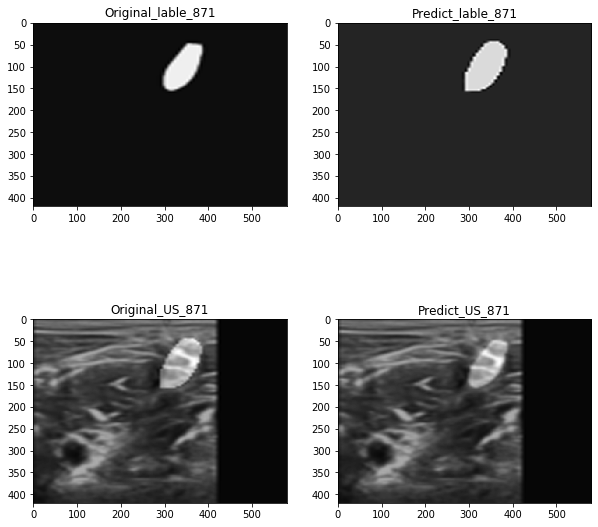

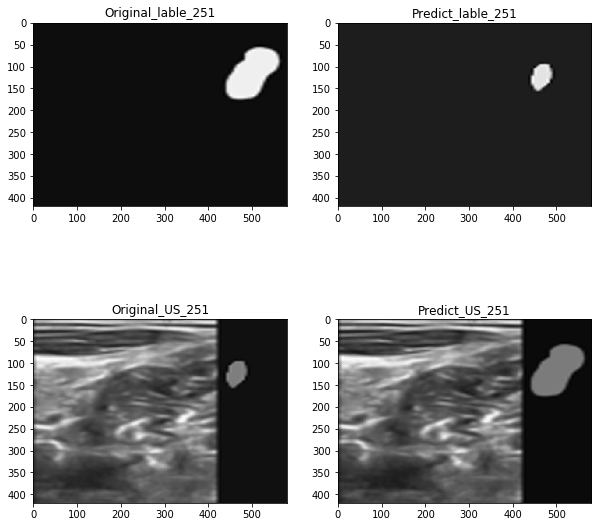

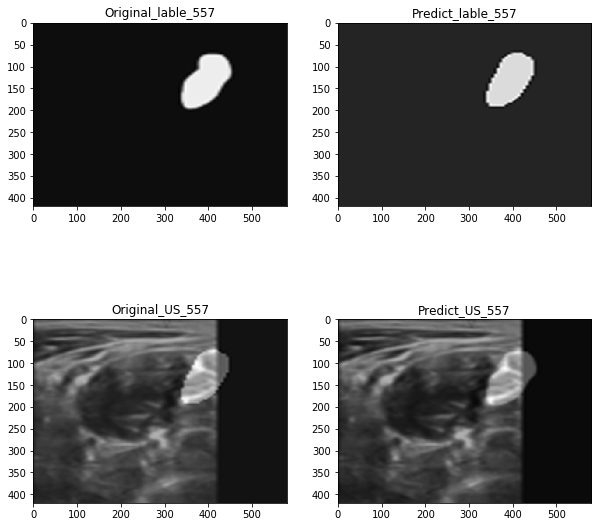

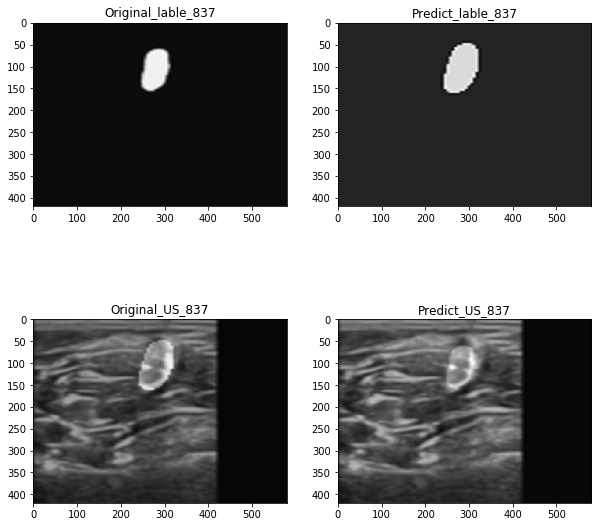

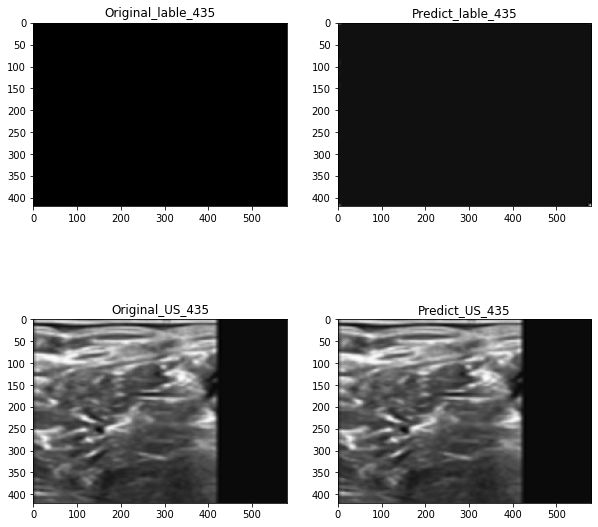

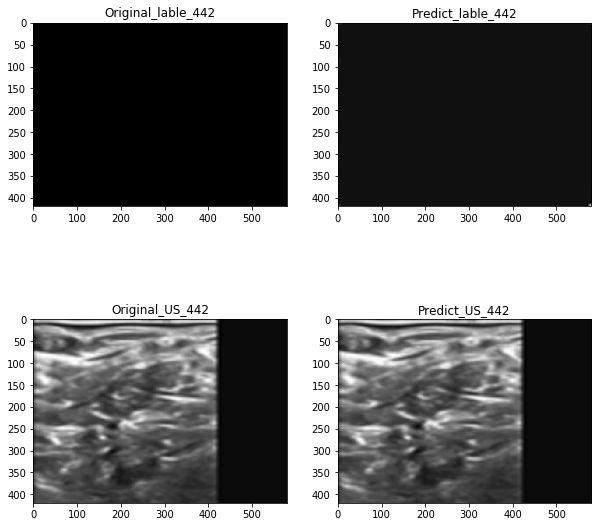

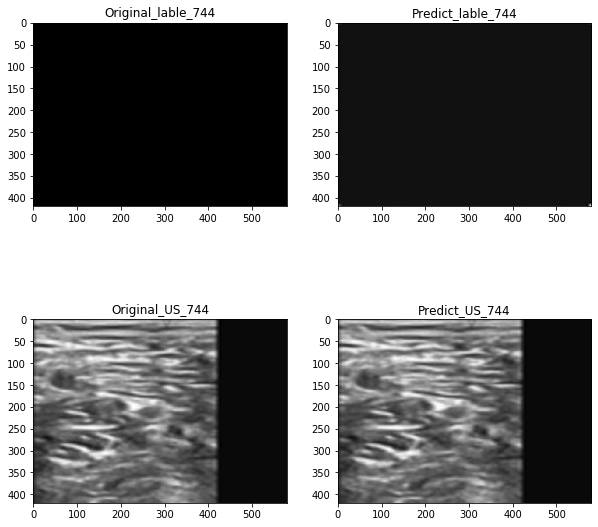

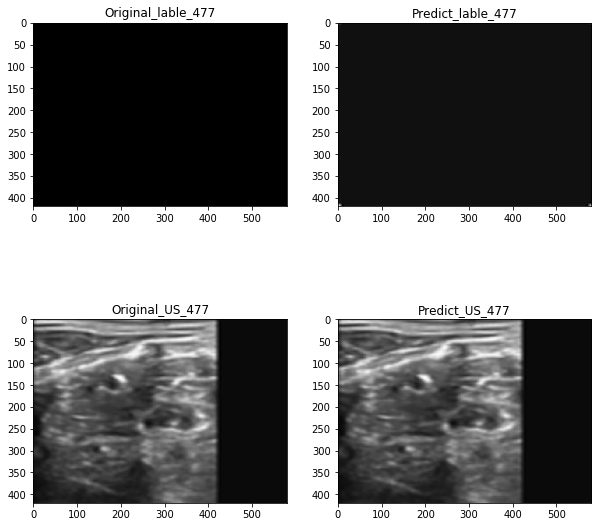

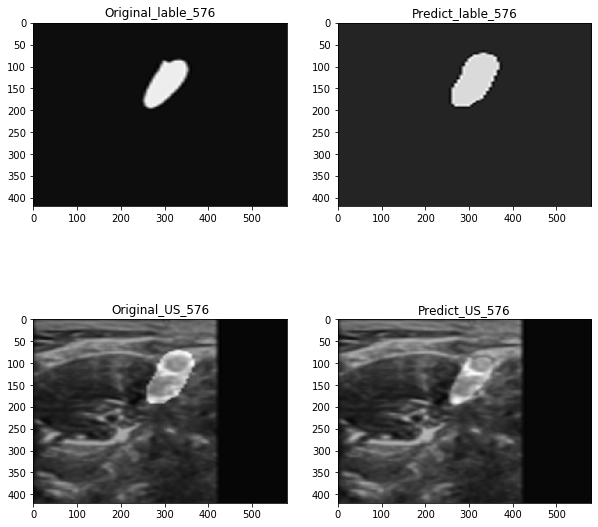

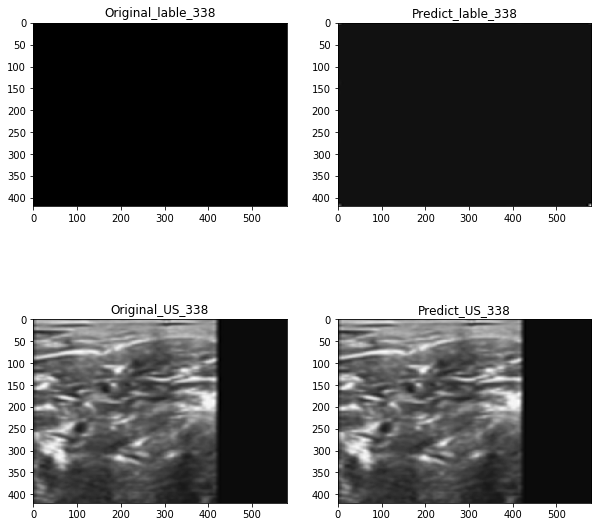


Fold  0
Train on 4508 samples, validate on 1127 samples
Epoch 1/50
 - 17s - loss: 5.1215 - dice_coef: 0.1277 - recall: 0.5944 - precision: 0.0989 - mean_iou: 0.7202 - val_loss: 4.0402 - val_dice_coef: 0.2307 - val_recall: 0.6870 - val_precision: 0.1439 - val_mean_iou: 0.9421
Epoch 2/50
 - 14s - loss: 3.5489 - dice_coef: 0.3572 - recall: 0.4626 - precision: 0.3261 - mean_iou: 0.9774 - val_loss: 3.2325 - val_dice_coef: 0.3706 - val_recall: 0.4998 - val_precision: 0.3101 - val_mean_iou: 0.9781
Epoch 3/50
 - 15s - loss: 2.9663 - dice_coef: 0.4299 - recall: 0.5110 - precision: 0.3968 - mean_iou: 0.9812 - val_loss: 2.8519 - val_dice_coef: 0.3559 - val_recall: 0.3724 - val_precision: 0.3843 - val_mean_iou: 0.9835
Epoch 4/50
 - 15s - loss: 2.5976 - dice_coef: 0.4644 - recall: 0.5349 - precision: 0.4263 - mean_iou: 0.9824 - val_loss: 2.5431 - val_dice_coef: 0.3794 - val_recall: 0.3938 - val_precision: 0.4027 - val_mean_iou: 0.9840
Epoch 5/50
 - 15s - loss: 2.3331 - dice_coef: 0.4829 - recall: 

Epoch 38/50
 - 15s - loss: 0.7057 - dice_coef: 0.6271 - recall: 0.6653 - precision: 0.6141 - mean_iou: 0.9868 - val_loss: 0.7669 - val_dice_coef: 0.5597 - val_recall: 0.5884 - val_precision: 0.5700 - val_mean_iou: 0.9866
Epoch 39/50
 - 15s - loss: 0.6961 - dice_coef: 0.6277 - recall: 0.6611 - precision: 0.6192 - mean_iou: 0.9870 - val_loss: 0.7736 - val_dice_coef: 0.5449 - val_recall: 0.6283 - val_precision: 0.5114 - val_mean_iou: 0.9850
Epoch 40/50
 - 15s - loss: 0.6932 - dice_coef: 0.6234 - recall: 0.6507 - precision: 0.6213 - mean_iou: 0.9870 - val_loss: 0.7536 - val_dice_coef: 0.5586 - val_recall: 0.6054 - val_precision: 0.5564 - val_mean_iou: 0.9862
Epoch 41/50
 - 15s - loss: 0.6897 - dice_coef: 0.6201 - recall: 0.6536 - precision: 0.6122 - mean_iou: 0.9868 - val_loss: 0.7541 - val_dice_coef: 0.5510 - val_recall: 0.5991 - val_precision: 0.5502 - val_mean_iou: 0.9861
Epoch 42/50
 - 15s - loss: 0.6740 - dice_coef: 0.6276 - recall: 0.6517 - precision: 0.6285 - mean_iou: 0.9871 - val_

Epoch 25/50
 - 15s - loss: 0.5187 - dice_coef: 0.6534 - recall: 0.6832 - precision: 0.6457 - mean_iou: 0.9875 - val_loss: 0.5988 - val_dice_coef: 0.5721 - val_recall: 0.5654 - val_precision: 0.6279 - val_mean_iou: 0.9873
Epoch 26/50
 - 14s - loss: 0.5235 - dice_coef: 0.6467 - recall: 0.6771 - precision: 0.6429 - mean_iou: 0.9874 - val_loss: 0.6130 - val_dice_coef: 0.5600 - val_recall: 0.5506 - val_precision: 0.6201 - val_mean_iou: 0.9873
Epoch 27/50
 - 15s - loss: 0.5245 - dice_coef: 0.6452 - recall: 0.6765 - precision: 0.6383 - mean_iou: 0.9875 - val_loss: 0.6046 - val_dice_coef: 0.5658 - val_recall: 0.5495 - val_precision: 0.6381 - val_mean_iou: 0.9875
Epoch 28/50
 - 15s - loss: 0.5273 - dice_coef: 0.6409 - recall: 0.6777 - precision: 0.6370 - mean_iou: 0.9872 - val_loss: 0.5946 - val_dice_coef: 0.5730 - val_recall: 0.6190 - val_precision: 0.5612 - val_mean_iou: 0.9860
Epoch 29/50
 - 15s - loss: 0.5154 - dice_coef: 0.6509 - recall: 0.6816 - precision: 0.6475 - mean_iou: 0.9876 - val_

Epoch 12/50
 - 15s - loss: 0.4752 - dice_coef: 0.6560 - recall: 0.6899 - precision: 0.6465 - mean_iou: 0.9874 - val_loss: 0.4955 - val_dice_coef: 0.6382 - val_recall: 0.7029 - val_precision: 0.6082 - val_mean_iou: 0.9876
Epoch 13/50
 - 15s - loss: 0.4733 - dice_coef: 0.6561 - recall: 0.6859 - precision: 0.6503 - mean_iou: 0.9875 - val_loss: 0.5126 - val_dice_coef: 0.6187 - val_recall: 0.6727 - val_precision: 0.6086 - val_mean_iou: 0.9874

Epoch 00013: ReduceLROnPlateau reducing learning rate to 9.999999747378752e-06.
Epoch 00013: early stopping
[0.5126410093631169, 0.6186814904212952, 0.6727465987205505, 0.6085813045501709, 0.9874235987663269]

Fold  3
Train on 4508 samples, validate on 1127 samples
Epoch 1/50
 - 15s - loss: 0.4591 - dice_coef: 0.6697 - recall: 0.6876 - precision: 0.6694 - mean_iou: 0.9881 - val_loss: 0.4591 - val_dice_coef: 0.6685 - val_recall: 0.6882 - val_precision: 0.7057 - val_mean_iou: 0.9883
Epoch 2/50
 - 14s - loss: 0.4603 - dice_coef: 0.6679 - recall: 0.6875 -

Epoch 6/50
 - 15s - loss: 0.4313 - dice_coef: 0.6858 - recall: 0.7033 - precision: 0.6870 - mean_iou: 0.9883 - val_loss: 0.4454 - val_dice_coef: 0.6764 - val_recall: 0.7051 - val_precision: 0.6973 - val_mean_iou: 0.9889
Epoch 7/50
 - 15s - loss: 0.4312 - dice_coef: 0.6859 - recall: 0.7068 - precision: 0.6863 - mean_iou: 0.9883 - val_loss: 0.4450 - val_dice_coef: 0.6768 - val_recall: 0.7029 - val_precision: 0.7003 - val_mean_iou: 0.9890
Epoch 8/50
 - 14s - loss: 0.4305 - dice_coef: 0.6864 - recall: 0.7059 - precision: 0.6884 - mean_iou: 0.9883 - val_loss: 0.4448 - val_dice_coef: 0.6769 - val_recall: 0.7037 - val_precision: 0.6990 - val_mean_iou: 0.9890
Epoch 9/50
 - 14s - loss: 0.4306 - dice_coef: 0.6864 - recall: 0.7056 - precision: 0.6868 - mean_iou: 0.9883 - val_loss: 0.4449 - val_dice_coef: 0.6768 - val_recall: 0.7041 - val_precision: 0.6989 - val_mean_iou: 0.9890
Epoch 10/50
 - 14s - loss: 0.4330 - dice_coef: 0.6841 - recall: 0.7061 - precision: 0.6837 - mean_iou: 0.9883 - val_loss

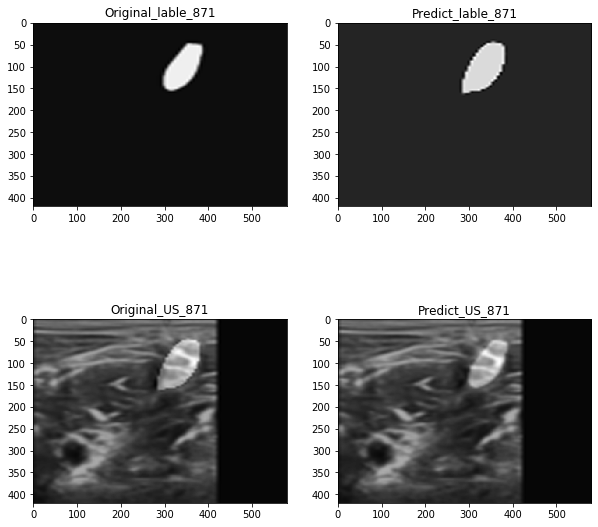

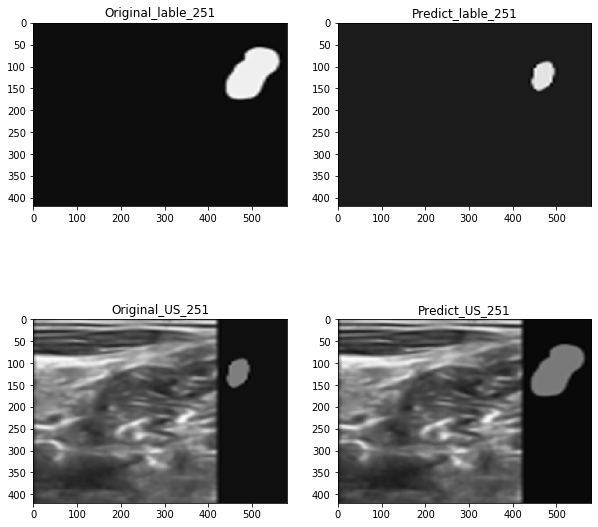

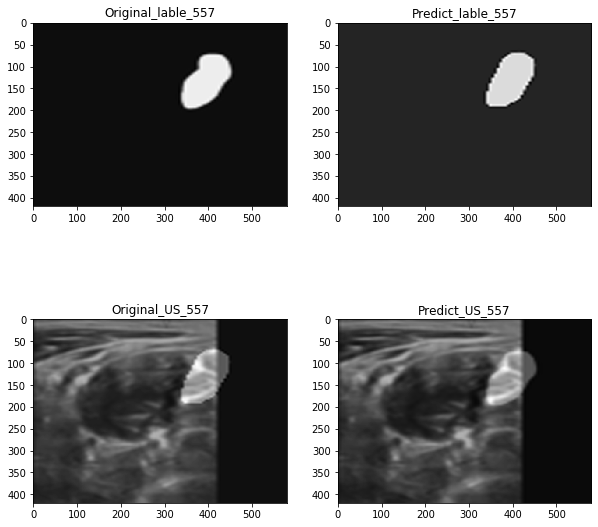

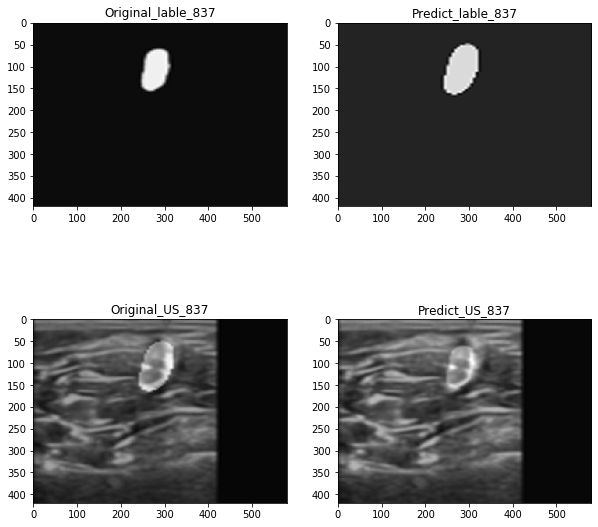

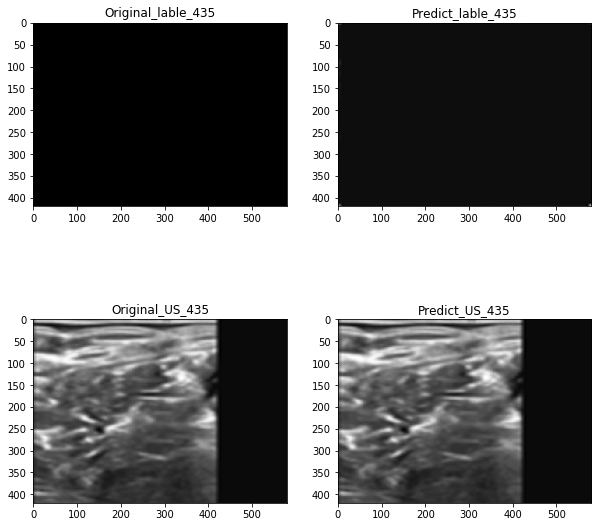

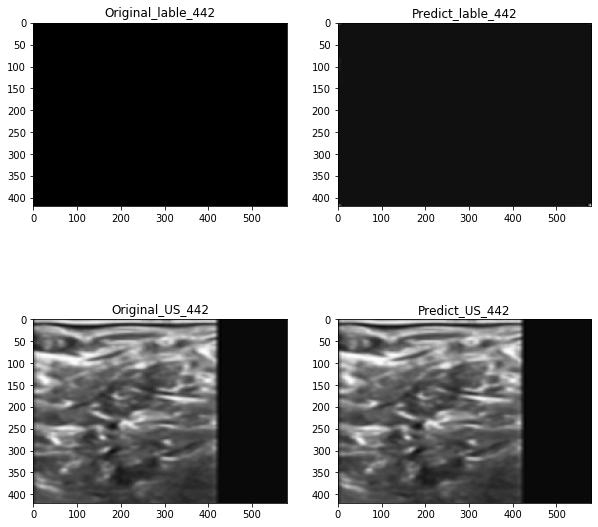

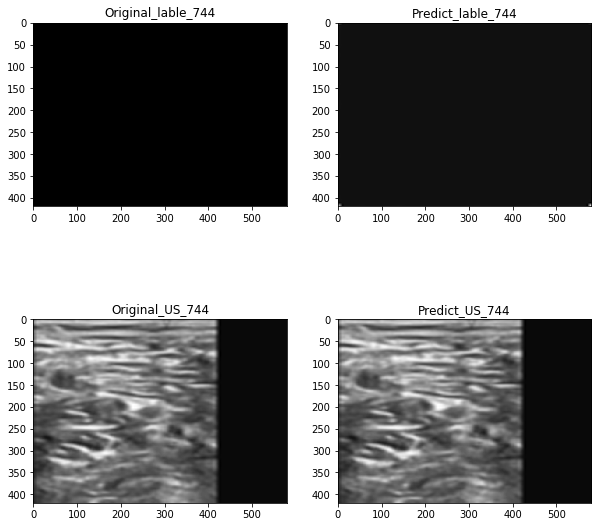

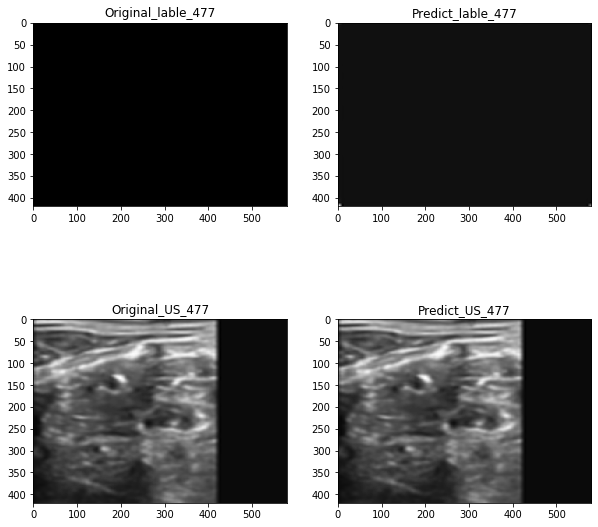

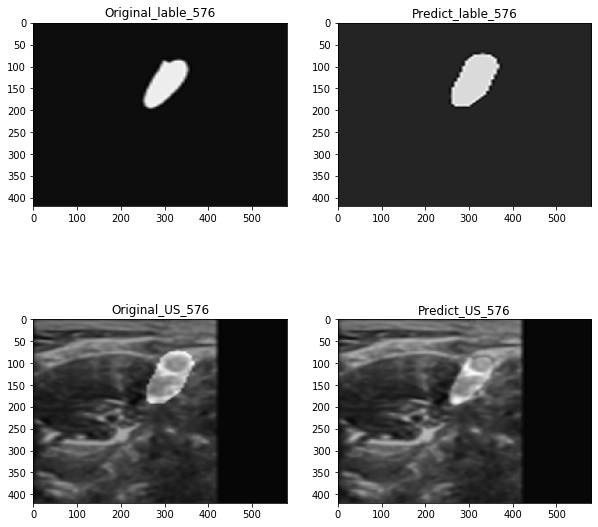

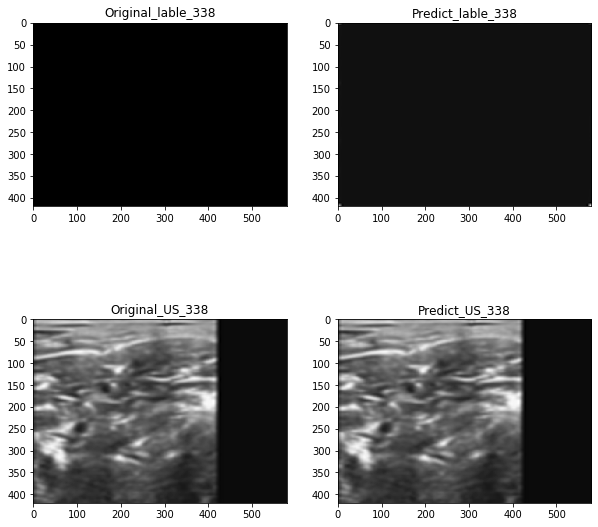


Fold  0
Train on 4508 samples, validate on 1127 samples
Epoch 1/50
 - 17s - loss: 5.1217 - dice_coef: 0.1273 - recall: 0.5980 - precision: 0.0983 - mean_iou: 0.7191 - val_loss: 4.0421 - val_dice_coef: 0.2295 - val_recall: 0.6954 - val_precision: 0.1427 - val_mean_iou: 0.9410
Epoch 2/50
 - 14s - loss: 3.5557 - dice_coef: 0.3535 - recall: 0.4741 - precision: 0.3188 - mean_iou: 0.9762 - val_loss: 3.2283 - val_dice_coef: 0.3782 - val_recall: 0.4204 - val_precision: 0.3704 - val_mean_iou: 0.9826
Epoch 3/50
 - 14s - loss: 2.9778 - dice_coef: 0.4244 - recall: 0.5123 - precision: 0.3915 - mean_iou: 0.9808 - val_loss: 2.8189 - val_dice_coef: 0.3942 - val_recall: 0.4608 - val_precision: 0.3752 - val_mean_iou: 0.9818
Epoch 4/50
 - 14s - loss: 2.6027 - dice_coef: 0.4635 - recall: 0.5360 - precision: 0.4261 - mean_iou: 0.9823 - val_loss: 2.5501 - val_dice_coef: 0.3765 - val_recall: 0.4218 - val_precision: 0.3745 - val_mean_iou: 0.9825
Epoch 5/50
 - 15s - loss: 2.3342 - dice_coef: 0.4833 - recall: 

Epoch 38/50
 - 15s - loss: 0.7111 - dice_coef: 0.6203 - recall: 0.6497 - precision: 0.6185 - mean_iou: 0.9869 - val_loss: 0.7850 - val_dice_coef: 0.5398 - val_recall: 0.5479 - val_precision: 0.5796 - val_mean_iou: 0.9870
Epoch 39/50
 - 15s - loss: 0.6921 - dice_coef: 0.6294 - recall: 0.6527 - precision: 0.6300 - mean_iou: 0.9872 - val_loss: 0.7721 - val_dice_coef: 0.5434 - val_recall: 0.5865 - val_precision: 0.5460 - val_mean_iou: 0.9861
Epoch 40/50
 - 15s - loss: 0.6840 - dice_coef: 0.6286 - recall: 0.6612 - precision: 0.6183 - mean_iou: 0.9870 - val_loss: 0.7563 - val_dice_coef: 0.5502 - val_recall: 0.5889 - val_precision: 0.5556 - val_mean_iou: 0.9862
Epoch 41/50
 - 15s - loss: 0.6830 - dice_coef: 0.6216 - recall: 0.6549 - precision: 0.6173 - mean_iou: 0.9869 - val_loss: 0.7444 - val_dice_coef: 0.5548 - val_recall: 0.5849 - val_precision: 0.5668 - val_mean_iou: 0.9865
Epoch 42/50
 - 15s - loss: 0.6673 - dice_coef: 0.6299 - recall: 0.6583 - precision: 0.6248 - mean_iou: 0.9871 - val_

Epoch 25/50
 - 16s - loss: 0.5170 - dice_coef: 0.6531 - recall: 0.6821 - precision: 0.6458 - mean_iou: 0.9875 - val_loss: 0.5981 - val_dice_coef: 0.5699 - val_recall: 0.5660 - val_precision: 0.6297 - val_mean_iou: 0.9874
Epoch 26/50
 - 15s - loss: 0.5205 - dice_coef: 0.6475 - recall: 0.6798 - precision: 0.6423 - mean_iou: 0.9874 - val_loss: 0.5901 - val_dice_coef: 0.5780 - val_recall: 0.6206 - val_precision: 0.5663 - val_mean_iou: 0.9863
Epoch 27/50
 - 15s - loss: 0.5198 - dice_coef: 0.6472 - recall: 0.6809 - precision: 0.6417 - mean_iou: 0.9874 - val_loss: 0.5981 - val_dice_coef: 0.5674 - val_recall: 0.5684 - val_precision: 0.6137 - val_mean_iou: 0.9872
Epoch 28/50
 - 15s - loss: 0.5156 - dice_coef: 0.6493 - recall: 0.6796 - precision: 0.6462 - mean_iou: 0.9875 - val_loss: 0.6053 - val_dice_coef: 0.5598 - val_recall: 0.5753 - val_precision: 0.5836 - val_mean_iou: 0.9866
Epoch 29/50
 - 15s - loss: 0.5204 - dice_coef: 0.6426 - recall: 0.6738 - precision: 0.6400 - mean_iou: 0.9874 - val_


Epoch 00011: ReduceLROnPlateau reducing learning rate to 9.999999747378752e-06.
Epoch 00011: early stopping
[0.5104122457244064, 0.6217204332351685, 0.6482730507850647, 0.6467861533164978, 0.9881410598754883]

Fold  3
Train on 4508 samples, validate on 1127 samples
Epoch 1/50
 - 15s - loss: 0.4628 - dice_coef: 0.6663 - recall: 0.6842 - precision: 0.6685 - mean_iou: 0.9881 - val_loss: 0.4581 - val_dice_coef: 0.6711 - val_recall: 0.7134 - val_precision: 0.6874 - val_mean_iou: 0.9878
Epoch 2/50
 - 16s - loss: 0.4574 - dice_coef: 0.6710 - recall: 0.6962 - precision: 0.6644 - mean_iou: 0.9881 - val_loss: 0.4553 - val_dice_coef: 0.6731 - val_recall: 0.7031 - val_precision: 0.6998 - val_mean_iou: 0.9881
Epoch 3/50
 - 15s - loss: 0.4579 - dice_coef: 0.6699 - recall: 0.7004 - precision: 0.6622 - mean_iou: 0.9880 - val_loss: 0.4535 - val_dice_coef: 0.6742 - val_recall: 0.6953 - val_precision: 0.7092 - val_mean_iou: 0.9883
Epoch 4/50
 - 15s - loss: 0.4523 - dice_coef: 0.6748 - recall: 0.7007 - p


Epoch 00011: ReduceLROnPlateau reducing learning rate to 9.999999974752428e-08.
Epoch 00011: early stopping
[0.4538450933655702, 0.6680948734283447, 0.6965382099151611, 0.6909106969833374, 0.988910436630249]


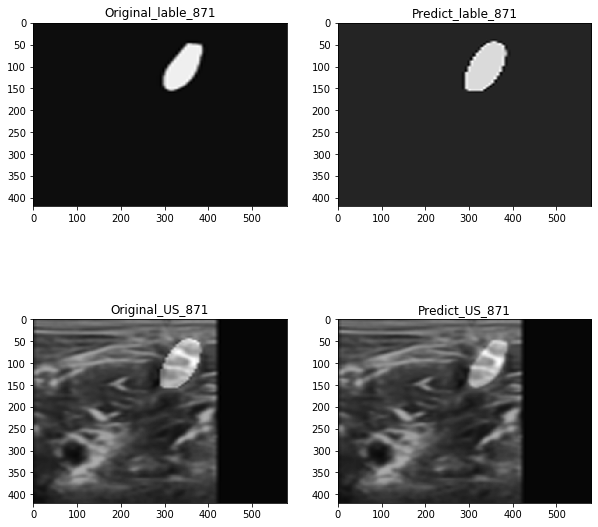

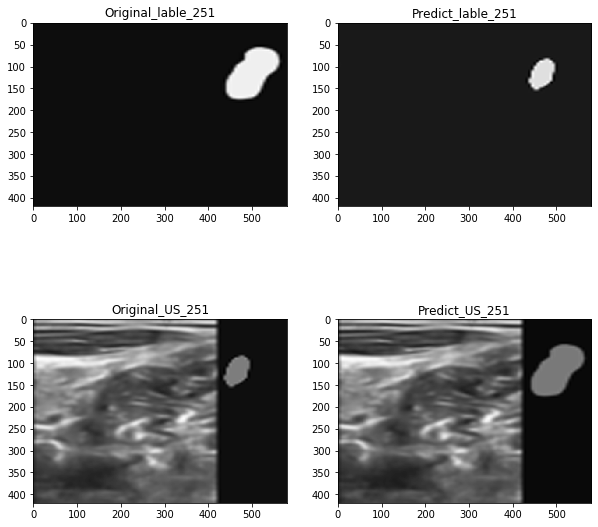

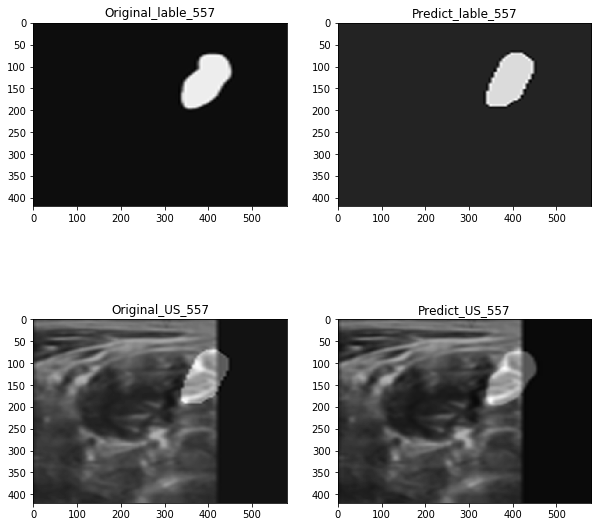

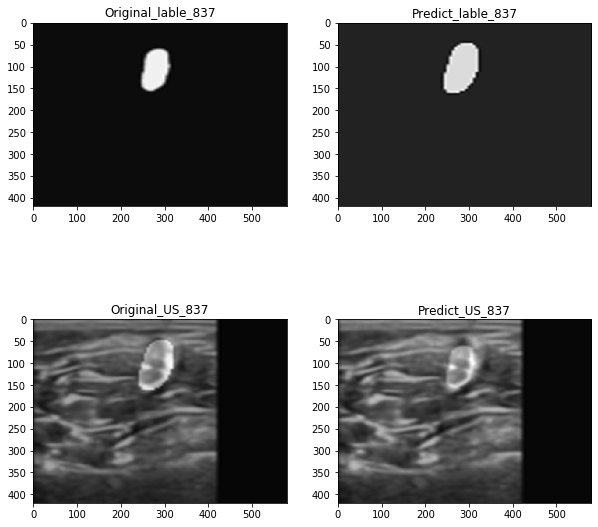

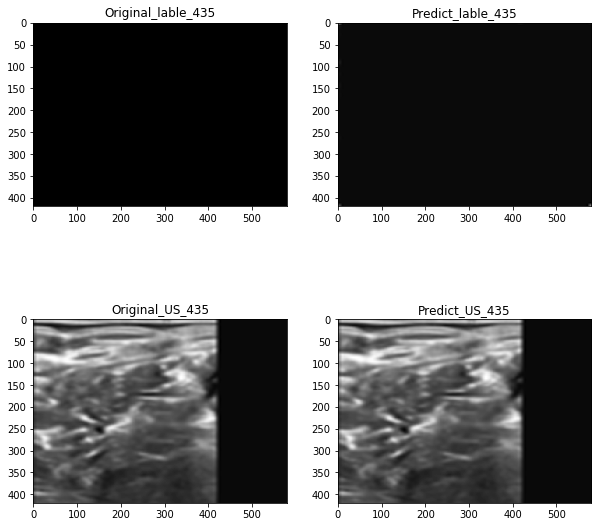

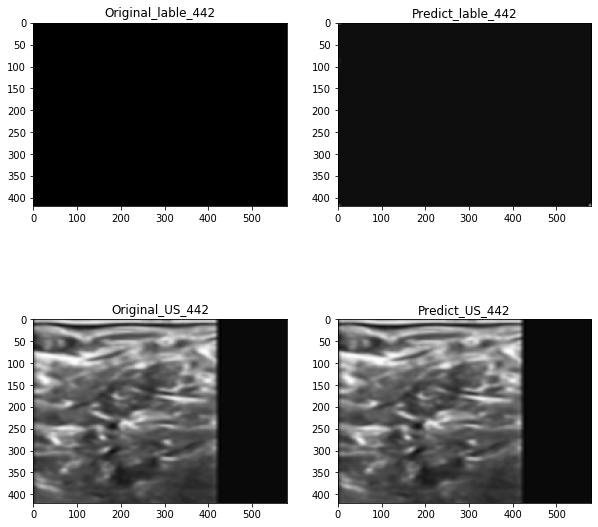

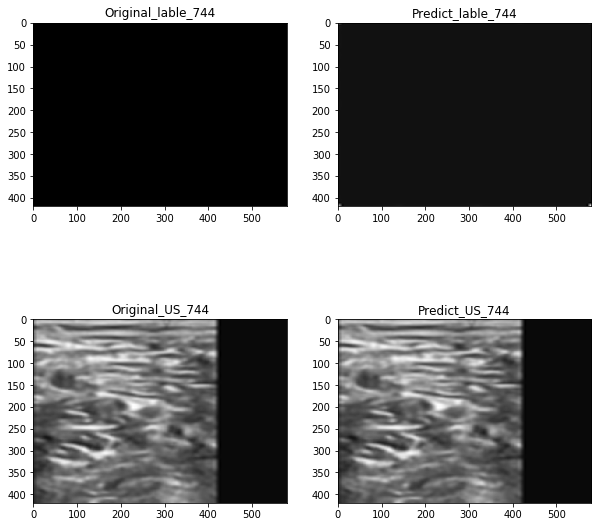

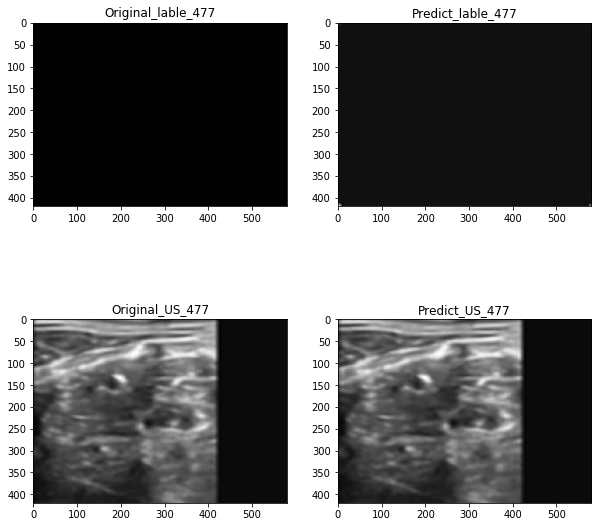

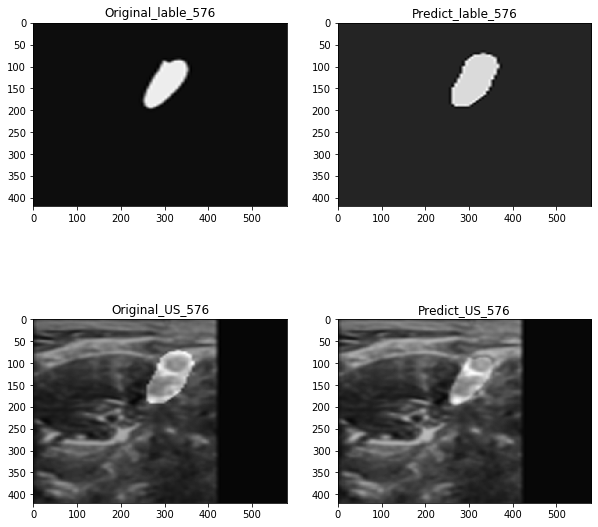

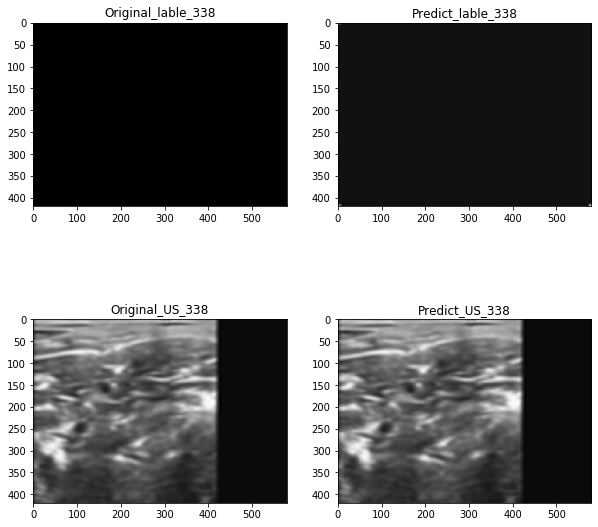

In [17]:
import h5py
import pandas as pd
import time
import scipy
for ind_fil in [3,5,7,9]:
    for ind in ["/"]:
        image_c = np.load('./image_FROST_'+str(ind_fil)+'.npy')
        path = "./Result/U-Net/Frost/"+str(ind_fil) +ind
        #image_c = preprocess_img_n(image_t,ind_fil)
        CAE = get_unet()
        folds = list(StratifiedKFold(n_splits=5, shuffle=True,
                             random_state=42).split(image_c[:, 0, 0], mask_c[:, 0, 0]))
        for j, (train_idx, val_idx) in enumerate(folds):
            now = time.localtime()
            s = "%02d-%02d-%02d_%02d;%02d" % (now.tm_year-2000,
                                          now.tm_mon, now.tm_mday, now.tm_hour, now.tm_min)
            print('\nFold ', j)
            image_train_cv = image_c[train_idx]
            mask_train_cv = mask_c[train_idx]
            image_valid_cv = image_c[val_idx]
            mask_valid_cv = mask_c[val_idx]

            name_weights = path+"/final_model_fold_" + \
                str(j) + "_weights.h5"
            callbackk = get_callbacks(name_weights=name_weights, patience_lr=10)

            history = CAE.fit(image_train_cv, mask_train_cv, epochs=50, verbose=2, shuffle=True, validation_data=(
            image_valid_cv, mask_valid_cv), batch_size=32, callbacks=callbackk)

            if history.history['dice_coef'][-1] < 0.05:
                break
            df = pd.DataFrame({"val_loss": history.history['val_loss'],
                           "val_dice_coef": history.history['val_dice_coef'],
                           "val_precision": history.history['val_precision'],
                           "val_recall": history.history['val_recall']})
            df = df*100
            df.to_csv(
                path+'/history_{:2.3}_{}.csv'.format(history.history['val_dice_coef'][-1], s))
            print(CAE.evaluate(image_valid_cv, mask_valid_cv, verbose=2))

        mask_predict = CAE.predict(image_valid_cv, verbose=2)

        mask_r = mask_predict.reshape(1127, 96, 96)
        mask_test_u = mask_valid_cv.reshape(1127, 96, 96)
        image_test_u = image_valid_cv.reshape(1127, 96, 96)

        img_test_o = (mask_r*2)+image_test_u
        img_predict_o = image_test_u+(mask_test_u*2)

        np.random.seed(0)
        for num in np.random.choice(1127, 10, replace=False):
            plt.figure(figsize=(10, 10))
            plt.subplot(2, 2, 1)
            plt.imshow(cv2.resize(mask_test_u[num], (580, 420),
                                  interpolation=cv2.INTER_CUBIC), cmap='gray')
            plt.title('Original_lable_'+str(num))

            plt.subplot(2, 2, 2)
            plt.imshow(cv2.resize(mask_r[num], (580, 420),
                                  interpolation=cv2.INTER_CUBIC), cmap='gray')
            plt.title('Predict_lable_'+str(num))

            plt.subplot(2, 2, 3)
            plt.imshow(cv2.resize(img_test_o[num], (580, 420),
                                  interpolation=cv2.INTER_CUBIC), cmap='gray')
            plt.title('Original_US_'+str(num))

            plt.subplot(2, 2, 4)
            plt.imshow(cv2.resize(img_predict_o[num], (580, 420),
                                  interpolation=cv2.INTER_CUBIC), cmap='gray')
            plt.title('Predict_US_'+str(num))
            plt.savefig(path+'/Result'+str(num)+'.png')
            plt.show()

In [43]:
def preprocess_img_n(imgs,lit):
    imgs_p = np.ndarray(
        (imgs.shape[0], train_image_rows, train_image_cols), dtype=np.float32)
    for i in tqdm_notebook(np.arange(0,imgs.shape[0])):
        img = imgs[i] = lee_filter(imgs[i].astype('float32'),lit)
        imgs_p[i] = resize(imgs[i].astype('float32'), (train_image_rows,
                                                       train_image_cols), mode='reflect', preserve_range=True)
        mean = np.mean(imgs_p[i])
        std = np.std(imgs_p[i])

        imgs_p[i] -= mean
        imgs_p[i] /= std
        
    imgs_p = imgs_p[..., np.newaxis]
    return imgs_p


from sklearn.model_selection import StratifiedKFold
folds = list(StratifiedKFold(n_splits=5, shuffle=True,
                             random_state=42).split(image_c[:, 0, 0], mask_c[:, 0, 0]))



Fold  0
Train on 4508 samples, validate on 1127 samples
Epoch 1/50
 - 19s - loss: 5.1562 - dice_coef: 0.0311 - recall: 0.5836 - precision: 0.0242 - mean_iou: 0.5849 - val_loss: 3.9360 - val_dice_coef: 2.6079e-06 - val_recall: 3.9587e-11 - val_precision: 0.1944 - val_mean_iou: 0.9879
Epoch 2/50
 - 15s - loss: 3.2327 - dice_coef: 0.0131 - recall: 0.1919 - precision: 0.0143 - mean_iou: 0.8866 - val_loss: 2.6070 - val_dice_coef: 0.0640 - val_recall: 0.4540 - val_precision: 0.0431 - val_mean_iou: 0.8704
Epoch 3/50
 - 15s - loss: 2.0866 - dice_coef: 0.3440 - recall: 0.4664 - precision: 0.3301 - mean_iou: 0.9706 - val_loss: 1.8654 - val_dice_coef: 0.4016 - val_recall: 0.4935 - val_precision: 0.3659 - val_mean_iou: 0.9813
Epoch 4/50
 - 15s - loss: 1.6725 - dice_coef: 0.4857 - recall: 0.5532 - precision: 0.4622 - mean_iou: 0.9828 - val_loss: 1.6153 - val_dice_coef: 0.4495 - val_recall: 0.4959 - val_precision: 0.4574 - val_mean_iou: 0.9845
Epoch 5/50
 - 15s - loss: 1.4812 - dice_coef: 0.5129 -

Epoch 38/50
 - 15s - loss: 0.5852 - dice_coef: 0.6275 - recall: 0.6701 - precision: 0.6169 - mean_iou: 0.9869 - val_loss: 0.6477 - val_dice_coef: 0.5638 - val_recall: 0.5891 - val_precision: 0.5776 - val_mean_iou: 0.9870
Epoch 39/50
 - 15s - loss: 0.5731 - dice_coef: 0.6343 - recall: 0.6697 - precision: 0.6280 - mean_iou: 0.9870 - val_loss: 0.6451 - val_dice_coef: 0.5617 - val_recall: 0.6636 - val_precision: 0.5158 - val_mean_iou: 0.9851
Epoch 40/50
 - 15s - loss: 0.5655 - dice_coef: 0.6376 - recall: 0.6625 - precision: 0.6352 - mean_iou: 0.9874 - val_loss: 0.6378 - val_dice_coef: 0.5639 - val_recall: 0.6902 - val_precision: 0.4975 - val_mean_iou: 0.9843
Epoch 41/50
 - 15s - loss: 0.5662 - dice_coef: 0.6342 - recall: 0.6761 - precision: 0.6239 - mean_iou: 0.9870 - val_loss: 0.6247 - val_dice_coef: 0.5748 - val_recall: 0.6602 - val_precision: 0.5343 - val_mean_iou: 0.9856
Epoch 42/50
 - 15s - loss: 0.5649 - dice_coef: 0.6316 - recall: 0.6735 - precision: 0.6211 - mean_iou: 0.9869 - val_

Epoch 25/50
 - 15s - loss: 0.4795 - dice_coef: 0.6478 - recall: 0.6875 - precision: 0.6405 - mean_iou: 0.9873 - val_loss: 0.5284 - val_dice_coef: 0.6016 - val_recall: 0.6827 - val_precision: 0.5599 - val_mean_iou: 0.9856
Epoch 26/50
 - 15s - loss: 0.4763 - dice_coef: 0.6511 - recall: 0.6904 - precision: 0.6358 - mean_iou: 0.9874 - val_loss: 0.5325 - val_dice_coef: 0.5966 - val_recall: 0.5963 - val_precision: 0.6353 - val_mean_iou: 0.9875
Epoch 27/50
 - 15s - loss: 0.4735 - dice_coef: 0.6523 - recall: 0.6924 - precision: 0.6394 - mean_iou: 0.9874 - val_loss: 0.5285 - val_dice_coef: 0.5991 - val_recall: 0.6114 - val_precision: 0.6235 - val_mean_iou: 0.9873
Epoch 28/50
 - 15s - loss: 0.4703 - dice_coef: 0.6543 - recall: 0.6882 - precision: 0.6444 - mean_iou: 0.9875 - val_loss: 0.5336 - val_dice_coef: 0.5935 - val_recall: 0.6357 - val_precision: 0.5831 - val_mean_iou: 0.9865
Epoch 29/50
 - 15s - loss: 0.4687 - dice_coef: 0.6550 - recall: 0.6871 - precision: 0.6495 - mean_iou: 0.9876 - val_

Epoch 20/50
 - 15s - loss: 0.4302 - dice_coef: 0.6754 - recall: 0.6976 - precision: 0.6736 - mean_iou: 0.9880 - val_loss: 0.4391 - val_dice_coef: 0.6690 - val_recall: 0.7173 - val_precision: 0.6596 - val_mean_iou: 0.9884
Epoch 21/50
 - 15s - loss: 0.4297 - dice_coef: 0.6756 - recall: 0.7013 - precision: 0.6696 - mean_iou: 0.9880 - val_loss: 0.4387 - val_dice_coef: 0.6693 - val_recall: 0.7096 - val_precision: 0.6672 - val_mean_iou: 0.9885
Epoch 22/50
 - 15s - loss: 0.4275 - dice_coef: 0.6776 - recall: 0.6967 - precision: 0.6779 - mean_iou: 0.9880 - val_loss: 0.4401 - val_dice_coef: 0.6674 - val_recall: 0.7218 - val_precision: 0.6508 - val_mean_iou: 0.9882
Epoch 23/50
 - 15s - loss: 0.4319 - dice_coef: 0.6728 - recall: 0.6988 - precision: 0.6673 - mean_iou: 0.9879 - val_loss: 0.4402 - val_dice_coef: 0.6671 - val_recall: 0.7162 - val_precision: 0.6550 - val_mean_iou: 0.9884
Epoch 24/50
 - 15s - loss: 0.4308 - dice_coef: 0.6736 - recall: 0.6951 - precision: 0.6727 - mean_iou: 0.9880 - val_

Epoch 11/50
 - 15s - loss: 0.4189 - dice_coef: 0.6809 - recall: 0.7062 - precision: 0.6773 - mean_iou: 0.9883 - val_loss: 0.4226 - val_dice_coef: 0.6774 - val_recall: 0.6964 - val_precision: 0.7183 - val_mean_iou: 0.9884
Epoch 12/50
 - 15s - loss: 0.4155 - dice_coef: 0.6842 - recall: 0.7063 - precision: 0.6802 - mean_iou: 0.9883 - val_loss: 0.4232 - val_dice_coef: 0.6768 - val_recall: 0.6988 - val_precision: 0.7147 - val_mean_iou: 0.9883
Epoch 13/50
 - 15s - loss: 0.4219 - dice_coef: 0.6776 - recall: 0.7025 - precision: 0.6729 - mean_iou: 0.9882 - val_loss: 0.4239 - val_dice_coef: 0.6759 - val_recall: 0.6996 - val_precision: 0.7126 - val_mean_iou: 0.9883
Epoch 14/50
 - 15s - loss: 0.4144 - dice_coef: 0.6853 - recall: 0.7087 - precision: 0.6836 - mean_iou: 0.9883 - val_loss: 0.4238 - val_dice_coef: 0.6761 - val_recall: 0.6977 - val_precision: 0.7147 - val_mean_iou: 0.9884
Epoch 15/50
 - 15s - loss: 0.4170 - dice_coef: 0.6826 - recall: 0.7046 - precision: 0.6807 - mean_iou: 0.9883 - val_

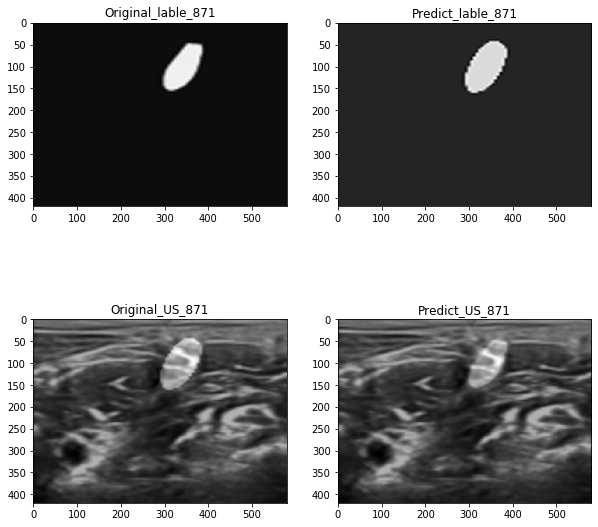

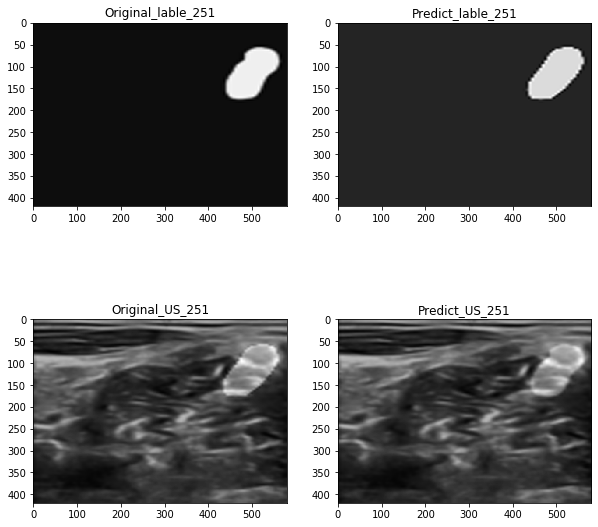

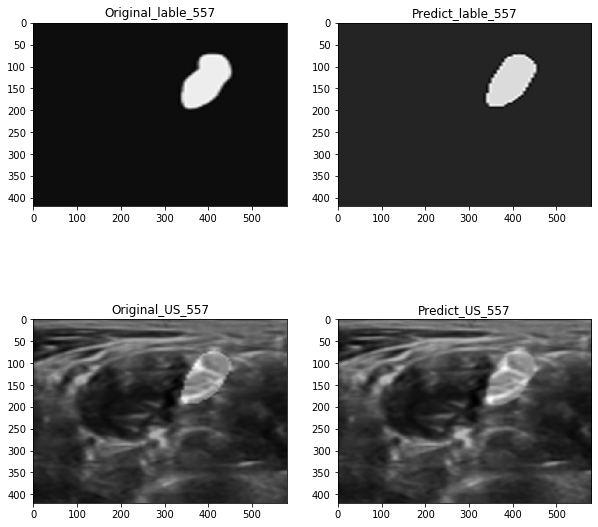

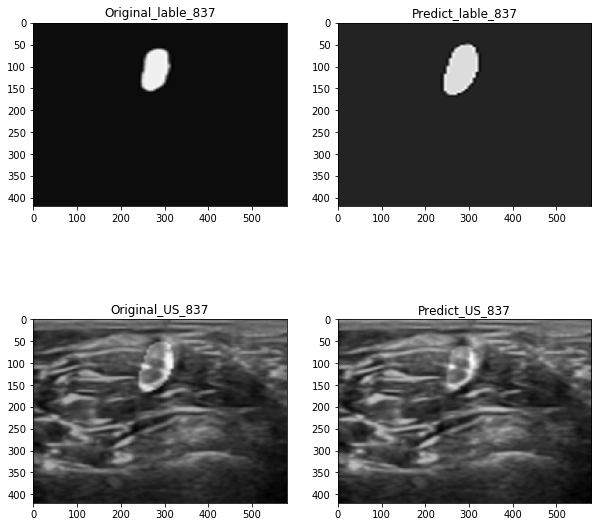

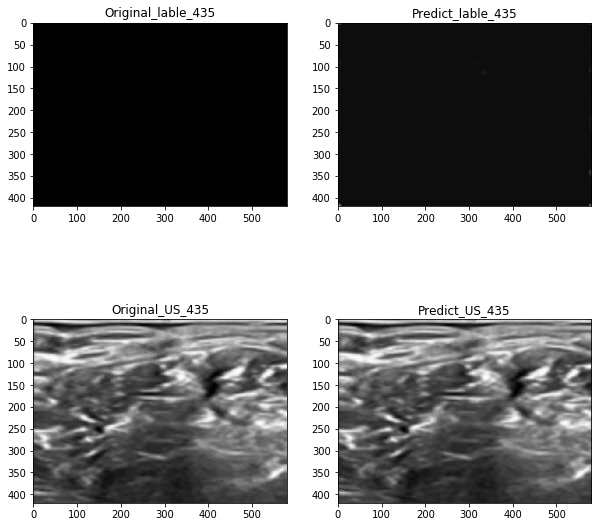

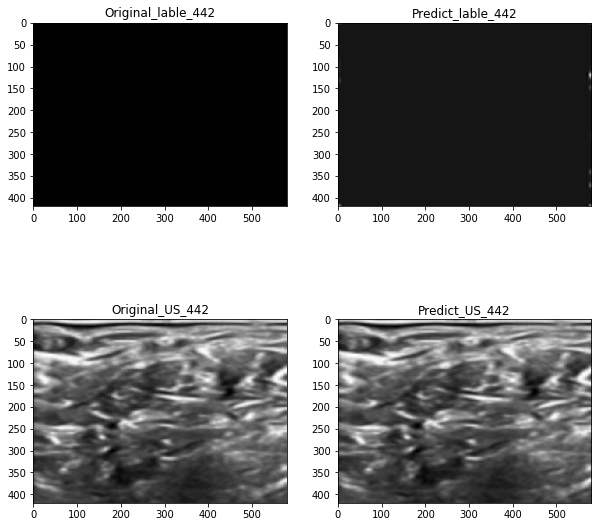

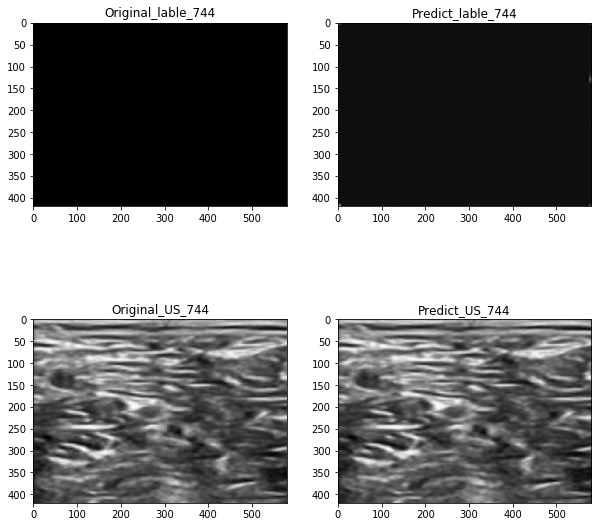

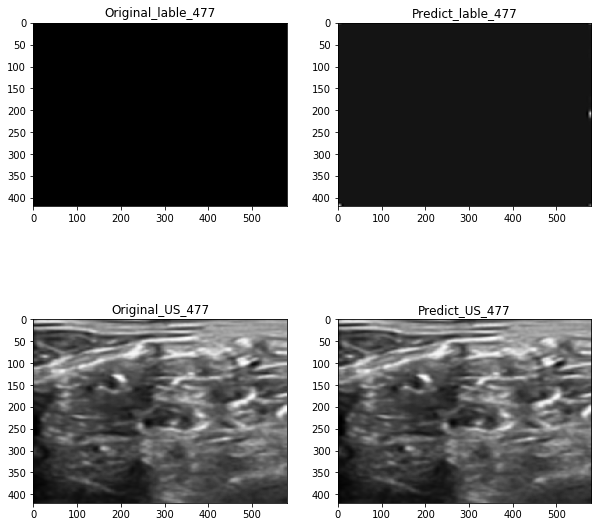

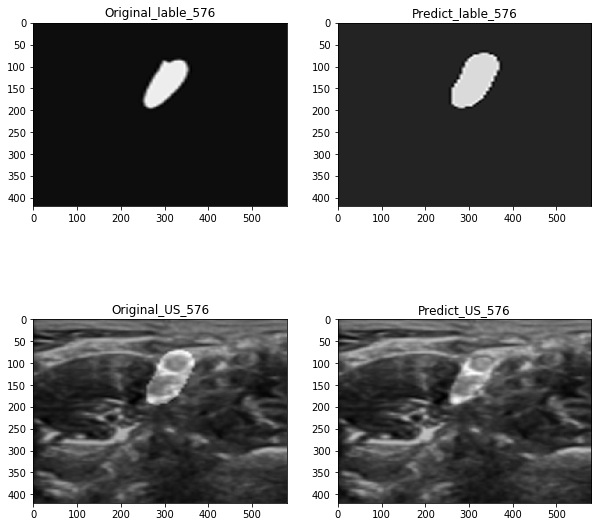

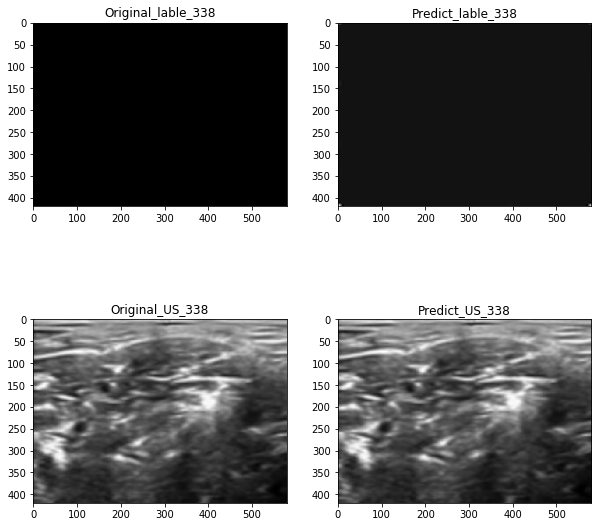



Fold  0
Train on 4508 samples, validate on 1127 samples
Epoch 1/50
 - 19s - loss: 5.1339 - dice_coef: 0.0418 - recall: 0.6533 - precision: 0.0408 - mean_iou: 0.5820 - val_loss: 3.9593 - val_dice_coef: 4.5885e-06 - val_recall: 3.9587e-11 - val_precision: 0.8889 - val_mean_iou: 0.9880
Epoch 2/50
 - 15s - loss: 3.3682 - dice_coef: 0.0059 - recall: 0.0739 - precision: 0.1184 - mean_iou: 0.9487 - val_loss: 2.8262 - val_dice_coef: 0.0392 - val_recall: 0.6884 - val_precision: 0.0202 - val_mean_iou: 0.5947
Epoch 3/50
 - 15s - loss: 2.3159 - dice_coef: 0.2376 - recall: 0.4582 - precision: 0.2226 - mean_iou: 0.9077 - val_loss: 1.9349 - val_dice_coef: 0.4087 - val_recall: 0.5591 - val_precision: 0.3378 - val_mean_iou: 0.9789
Epoch 4/50
 - 15s - loss: 1.7522 - dice_coef: 0.4701 - recall: 0.5510 - precision: 0.4411 - mean_iou: 0.9822 - val_loss: 1.6802 - val_dice_coef: 0.4395 - val_recall: 0.6171 - val_precision: 0.3560 - val_mean_iou: 0.9790
Epoch 5/50
 - 15s - loss: 1.5260 - dice_coef: 0.5117 -

Epoch 38/50
 - 15s - loss: 0.5795 - dice_coef: 0.6332 - recall: 0.6708 - precision: 0.6251 - mean_iou: 0.9870 - val_loss: 0.6615 - val_dice_coef: 0.5505 - val_recall: 0.5657 - val_precision: 0.5935 - val_mean_iou: 0.9871
Epoch 39/50
 - 15s - loss: 0.5749 - dice_coef: 0.6338 - recall: 0.6715 - precision: 0.6288 - mean_iou: 0.9869 - val_loss: 0.6391 - val_dice_coef: 0.5688 - val_recall: 0.6612 - val_precision: 0.5288 - val_mean_iou: 0.9853
Epoch 40/50
 - 15s - loss: 0.5707 - dice_coef: 0.6343 - recall: 0.6771 - precision: 0.6164 - mean_iou: 0.9870 - val_loss: 0.6574 - val_dice_coef: 0.5486 - val_recall: 0.5420 - val_precision: 0.6104 - val_mean_iou: 0.9874
Epoch 41/50
 - 15s - loss: 0.5672 - dice_coef: 0.6348 - recall: 0.6676 - precision: 0.6292 - mean_iou: 0.9871 - val_loss: 0.6543 - val_dice_coef: 0.5497 - val_recall: 0.5566 - val_precision: 0.6101 - val_mean_iou: 0.9872
Epoch 42/50
 - 15s - loss: 0.5612 - dice_coef: 0.6373 - recall: 0.6697 - precision: 0.6278 - mean_iou: 0.9871 - val_

Epoch 11/50
 - 15s - loss: 0.4757 - dice_coef: 0.6639 - recall: 0.6907 - precision: 0.6582 - mean_iou: 0.9877 - val_loss: 0.4890 - val_dice_coef: 0.6529 - val_recall: 0.7128 - val_precision: 0.6312 - val_mean_iou: 0.9880
Epoch 12/50
 - 15s - loss: 0.4734 - dice_coef: 0.6657 - recall: 0.6912 - precision: 0.6600 - mean_iou: 0.9878 - val_loss: 0.4900 - val_dice_coef: 0.6514 - val_recall: 0.7138 - val_precision: 0.6279 - val_mean_iou: 0.9879
Epoch 13/50
 - 15s - loss: 0.4761 - dice_coef: 0.6625 - recall: 0.6816 - precision: 0.6649 - mean_iou: 0.9878 - val_loss: 0.4881 - val_dice_coef: 0.6527 - val_recall: 0.7097 - val_precision: 0.6338 - val_mean_iou: 0.9880
Epoch 14/50
 - 15s - loss: 0.4732 - dice_coef: 0.6648 - recall: 0.6872 - precision: 0.6630 - mean_iou: 0.9878 - val_loss: 0.4862 - val_dice_coef: 0.6541 - val_recall: 0.6991 - val_precision: 0.6451 - val_mean_iou: 0.9882
Epoch 15/50
 - 15s - loss: 0.4737 - dice_coef: 0.6639 - recall: 0.6876 - precision: 0.6601 - mean_iou: 0.9878 - val_

Epoch 6/50
 - 15s - loss: 0.4569 - dice_coef: 0.6716 - recall: 0.6985 - precision: 0.6662 - mean_iou: 0.9881 - val_loss: 0.4629 - val_dice_coef: 0.6659 - val_recall: 0.6949 - val_precision: 0.6948 - val_mean_iou: 0.9880
Epoch 7/50
 - 15s - loss: 0.4538 - dice_coef: 0.6747 - recall: 0.7013 - precision: 0.6678 - mean_iou: 0.9880 - val_loss: 0.4633 - val_dice_coef: 0.6654 - val_recall: 0.6977 - val_precision: 0.6905 - val_mean_iou: 0.9879
Epoch 8/50
 - 15s - loss: 0.4509 - dice_coef: 0.6775 - recall: 0.7049 - precision: 0.6692 - mean_iou: 0.9881 - val_loss: 0.4637 - val_dice_coef: 0.6649 - val_recall: 0.6929 - val_precision: 0.6944 - val_mean_iou: 0.9880
Epoch 9/50
 - 15s - loss: 0.4518 - dice_coef: 0.6766 - recall: 0.7039 - precision: 0.6698 - mean_iou: 0.9881 - val_loss: 0.4638 - val_dice_coef: 0.6648 - val_recall: 0.6945 - val_precision: 0.6924 - val_mean_iou: 0.9879
Epoch 10/50
 - 15s - loss: 0.4491 - dice_coef: 0.6792 - recall: 0.7036 - precision: 0.6743 - mean_iou: 0.9882 - val_loss

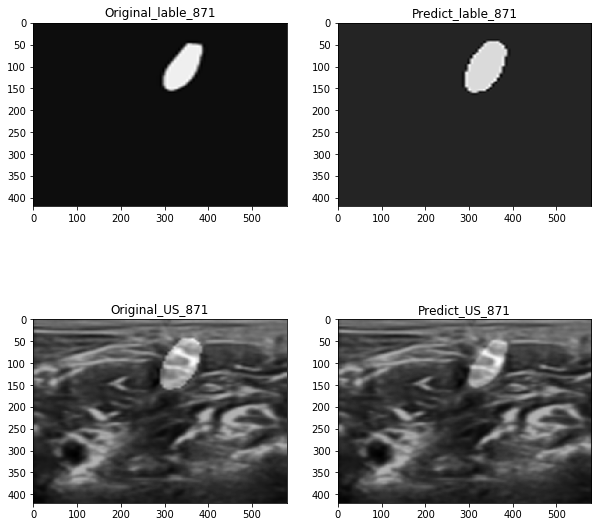

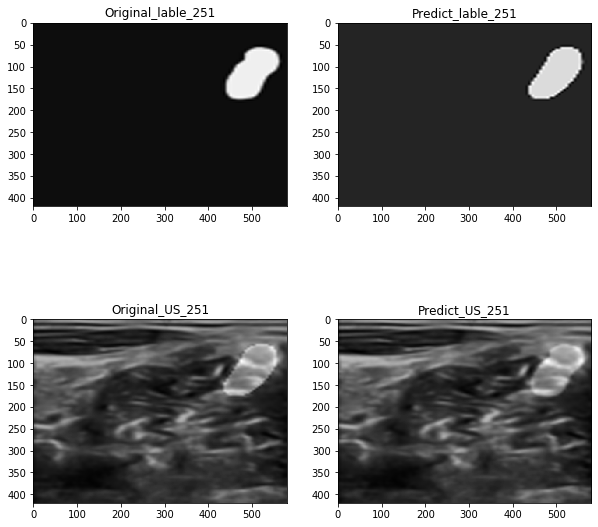

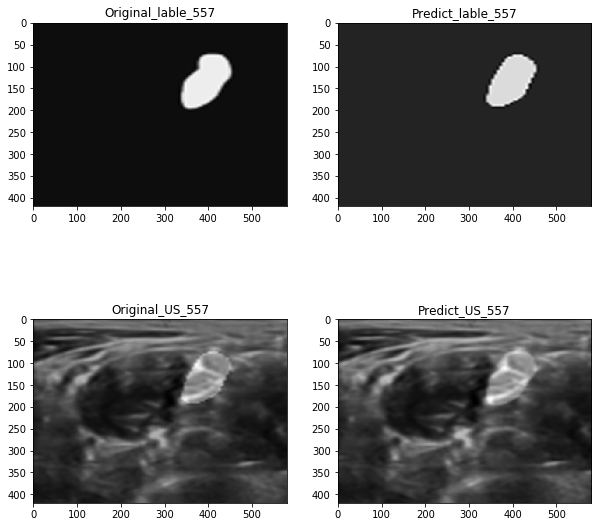

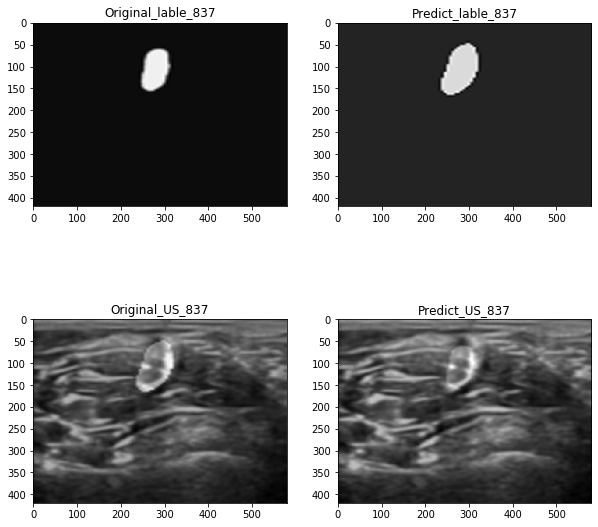

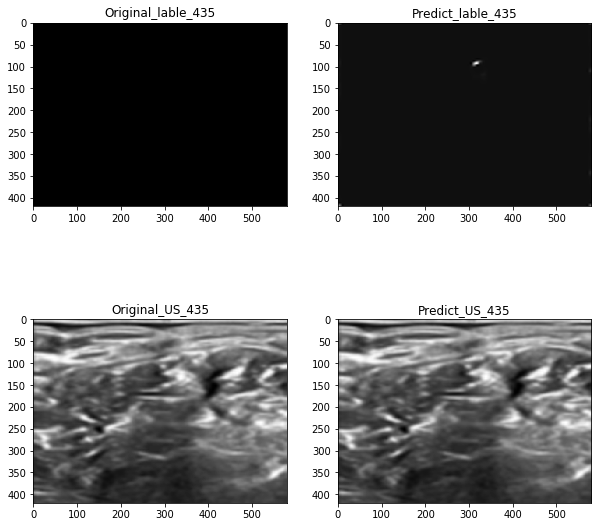

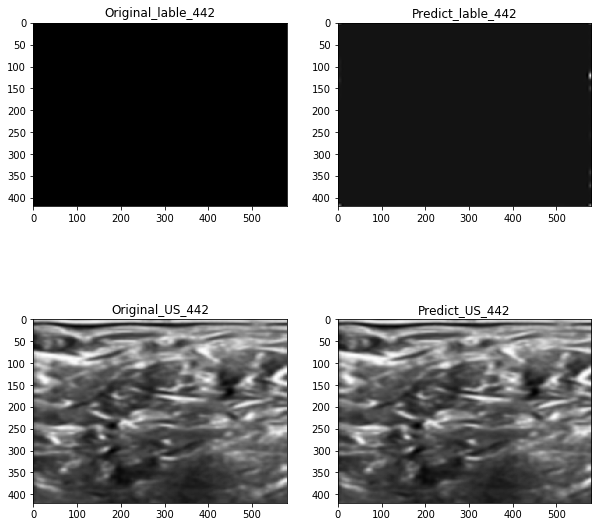

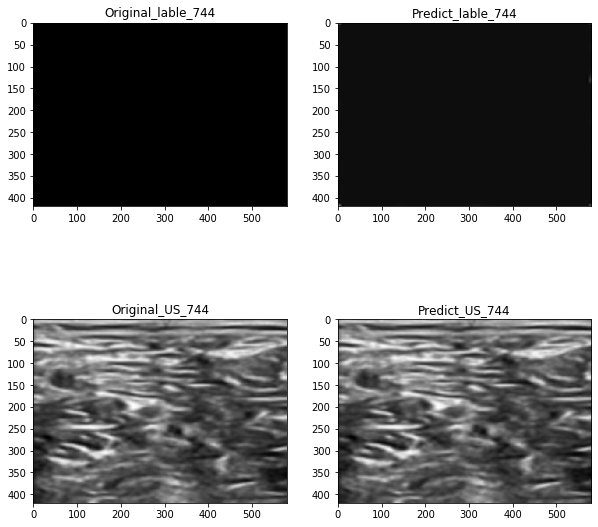

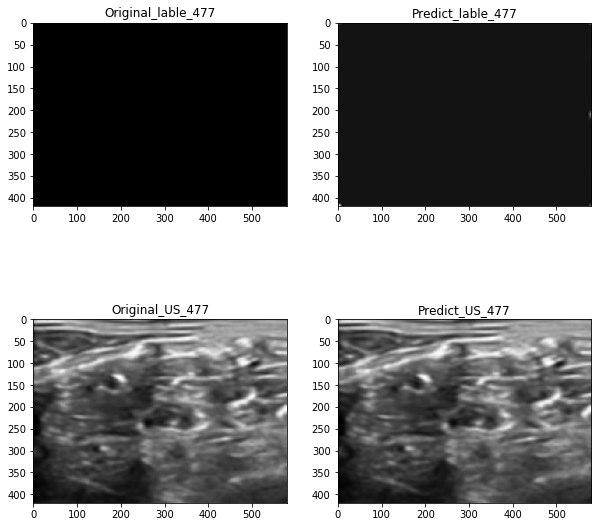

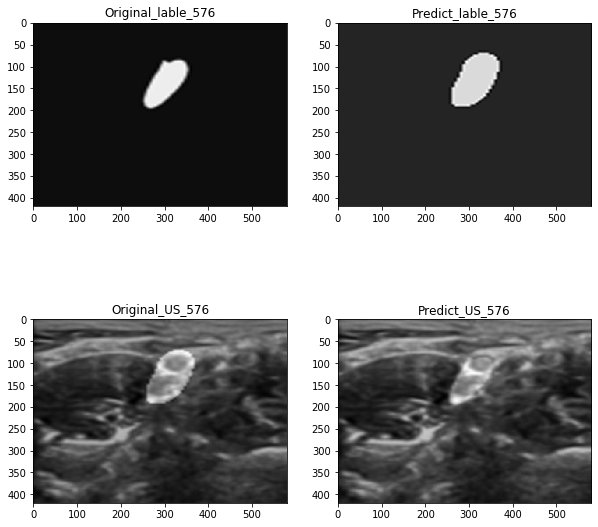

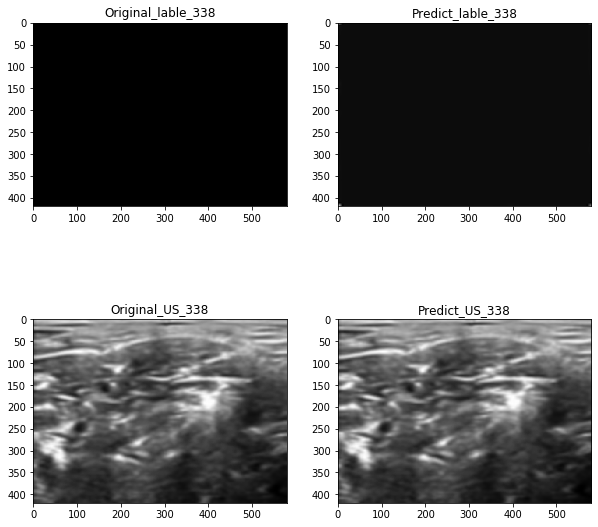



Fold  0
Train on 4508 samples, validate on 1127 samples
Epoch 1/50
 - 19s - loss: 5.1248 - dice_coef: 0.0463 - recall: 0.7026 - precision: 0.0272 - mean_iou: 0.5574 - val_loss: 3.9209 - val_dice_coef: 0.0031 - val_recall: 6.3354e-04 - val_precision: 0.4478 - val_mean_iou: 0.9879
Epoch 2/50
 - 15s - loss: 3.2082 - dice_coef: 0.2415 - recall: 0.3850 - precision: 0.2233 - mean_iou: 0.9591 - val_loss: 2.7243 - val_dice_coef: 0.3945 - val_recall: 0.3889 - val_precision: 0.4413 - val_mean_iou: 0.9850
Epoch 3/50
 - 15s - loss: 2.4651 - dice_coef: 0.4649 - recall: 0.5440 - precision: 0.4343 - mean_iou: 0.9822 - val_loss: 2.3729 - val_dice_coef: 0.3961 - val_recall: 0.4001 - val_precision: 0.4562 - val_mean_iou: 0.9851
Epoch 4/50
 - 15s - loss: 2.1341 - dice_coef: 0.5061 - recall: 0.5754 - precision: 0.4788 - mean_iou: 0.9834 - val_loss: 2.0697 - val_dice_coef: 0.4560 - val_recall: 0.6212 - val_precision: 0.3752 - val_mean_iou: 0.9802
Epoch 5/50
 - 15s - loss: 1.9031 - dice_coef: 0.5251 - rec

Epoch 38/50
 - 15s - loss: 0.6115 - dice_coef: 0.6364 - recall: 0.6798 - precision: 0.6228 - mean_iou: 0.9868 - val_loss: 0.6793 - val_dice_coef: 0.5671 - val_recall: 0.5986 - val_precision: 0.5808 - val_mean_iou: 0.9868
Epoch 39/50
 - 15s - loss: 0.6047 - dice_coef: 0.6379 - recall: 0.6740 - precision: 0.6311 - mean_iou: 0.9871 - val_loss: 0.6703 - val_dice_coef: 0.5723 - val_recall: 0.6488 - val_precision: 0.5495 - val_mean_iou: 0.9857
Epoch 40/50
 - 15s - loss: 0.6016 - dice_coef: 0.6357 - recall: 0.6749 - precision: 0.6208 - mean_iou: 0.9870 - val_loss: 0.6696 - val_dice_coef: 0.5681 - val_recall: 0.6133 - val_precision: 0.5756 - val_mean_iou: 0.9865
Epoch 41/50
 - 15s - loss: 0.5954 - dice_coef: 0.6369 - recall: 0.6777 - precision: 0.6234 - mean_iou: 0.9870 - val_loss: 0.6639 - val_dice_coef: 0.5682 - val_recall: 0.6193 - val_precision: 0.5687 - val_mean_iou: 0.9864
Epoch 42/50
 - 15s - loss: 0.5876 - dice_coef: 0.6392 - recall: 0.6817 - precision: 0.6231 - mean_iou: 0.9870 - val_

Epoch 25/50
 - 15s - loss: 0.4864 - dice_coef: 0.6551 - recall: 0.6788 - precision: 0.6523 - mean_iou: 0.9877 - val_loss: 0.5700 - val_dice_coef: 0.5705 - val_recall: 0.5616 - val_precision: 0.6336 - val_mean_iou: 0.9876

Epoch 00025: ReduceLROnPlateau reducing learning rate to 9.999999747378752e-06.
Epoch 00025: early stopping
[0.5700319458556155, 0.5705358982086182, 0.5615572929382324, 0.6335622072219849, 0.9876400232315063]

Fold  2
Train on 4508 samples, validate on 1127 samples
Epoch 1/50
 - 15s - loss: 0.4811 - dice_coef: 0.6591 - recall: 0.6830 - precision: 0.6558 - mean_iou: 0.9877 - val_loss: 0.4848 - val_dice_coef: 0.6576 - val_recall: 0.7191 - val_precision: 0.6348 - val_mean_iou: 0.9880
Epoch 2/50
 - 15s - loss: 0.4808 - dice_coef: 0.6585 - recall: 0.6801 - precision: 0.6562 - mean_iou: 0.9877 - val_loss: 0.4834 - val_dice_coef: 0.6583 - val_recall: 0.7160 - val_precision: 0.6386 - val_mean_iou: 0.9881
Epoch 3/50
 - 15s - loss: 0.4809 - dice_coef: 0.6577 - recall: 0.6877 - 

Epoch 36/50
 - 15s - loss: 0.4474 - dice_coef: 0.6769 - recall: 0.6990 - precision: 0.6742 - mean_iou: 0.9880 - val_loss: 0.4741 - val_dice_coef: 0.6527 - val_recall: 0.7190 - val_precision: 0.6266 - val_mean_iou: 0.9878
Epoch 37/50
 - 15s - loss: 0.4487 - dice_coef: 0.6753 - recall: 0.6949 - precision: 0.6757 - mean_iou: 0.9881 - val_loss: 0.4729 - val_dice_coef: 0.6537 - val_recall: 0.6773 - val_precision: 0.6639 - val_mean_iou: 0.9885
Epoch 38/50
 - 15s - loss: 0.4492 - dice_coef: 0.6745 - recall: 0.6981 - precision: 0.6717 - mean_iou: 0.9880 - val_loss: 0.4720 - val_dice_coef: 0.6539 - val_recall: 0.7131 - val_precision: 0.6319 - val_mean_iou: 0.9880
Epoch 39/50
 - 15s - loss: 0.4457 - dice_coef: 0.6778 - recall: 0.6986 - precision: 0.6764 - mean_iou: 0.9881 - val_loss: 0.4713 - val_dice_coef: 0.6547 - val_recall: 0.6996 - val_precision: 0.6453 - val_mean_iou: 0.9882
Epoch 40/50
 - 15s - loss: 0.4480 - dice_coef: 0.6752 - recall: 0.6925 - precision: 0.6767 - mean_iou: 0.9881 - val_

Epoch 11/50
 - 15s - loss: 0.4373 - dice_coef: 0.6805 - recall: 0.6970 - precision: 0.6831 - mean_iou: 0.9882 - val_loss: 0.4642 - val_dice_coef: 0.6566 - val_recall: 0.6886 - val_precision: 0.6735 - val_mean_iou: 0.9886
Epoch 12/50
 - 15s - loss: 0.4382 - dice_coef: 0.6794 - recall: 0.7059 - precision: 0.6723 - mean_iou: 0.9881 - val_loss: 0.4651 - val_dice_coef: 0.6557 - val_recall: 0.6905 - val_precision: 0.6695 - val_mean_iou: 0.9886
Epoch 13/50
 - 15s - loss: 0.4366 - dice_coef: 0.6810 - recall: 0.7075 - precision: 0.6742 - mean_iou: 0.9881 - val_loss: 0.4658 - val_dice_coef: 0.6550 - val_recall: 0.6877 - val_precision: 0.6716 - val_mean_iou: 0.9886

Epoch 00013: ReduceLROnPlateau reducing learning rate to 9.999999974752428e-08.
Epoch 00013: early stopping
[0.46583224384786814, 0.6549539566040039, 0.6876804828643799, 0.67155522108078, 0.9886014461517334]


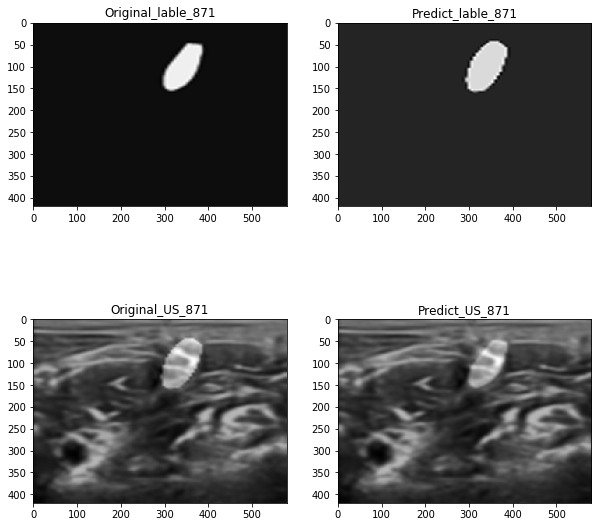

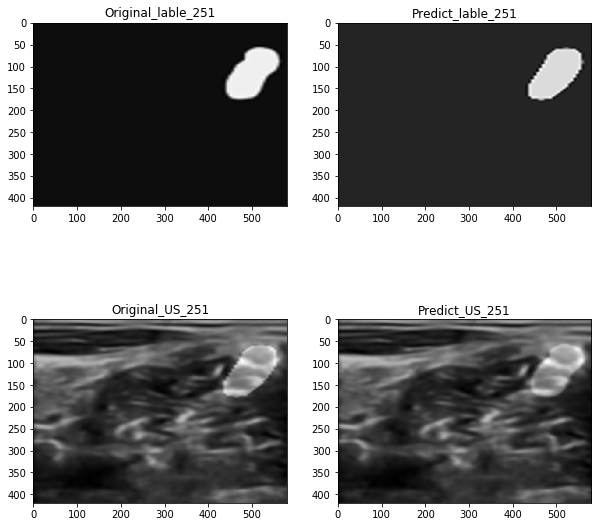

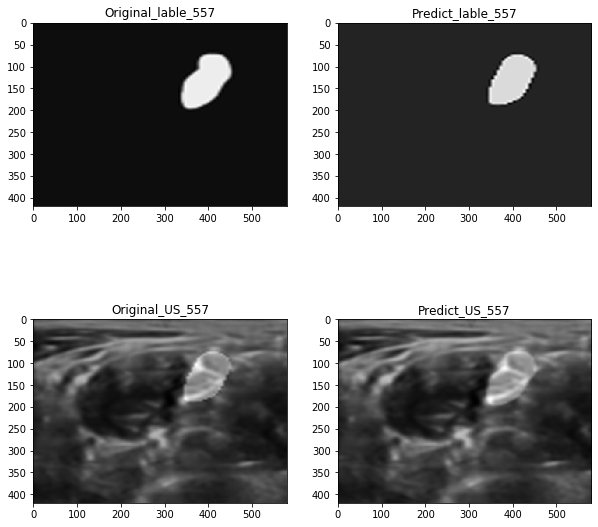

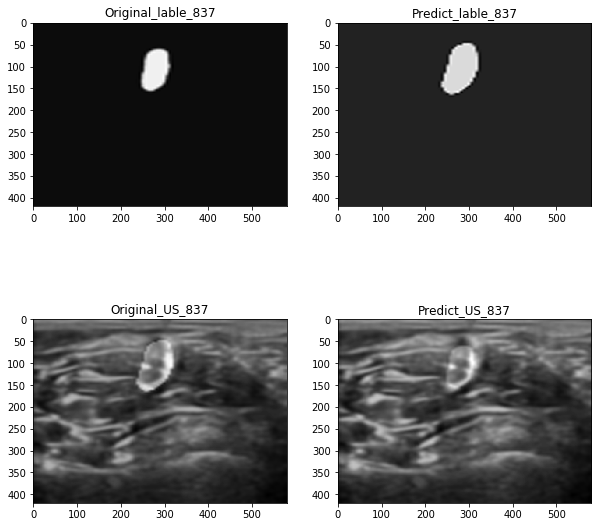

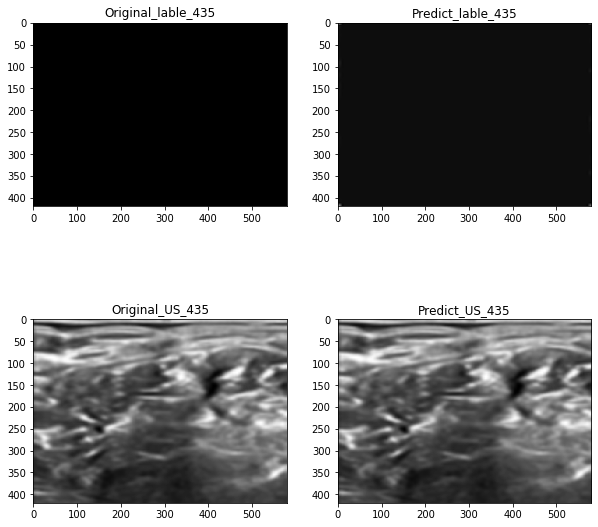

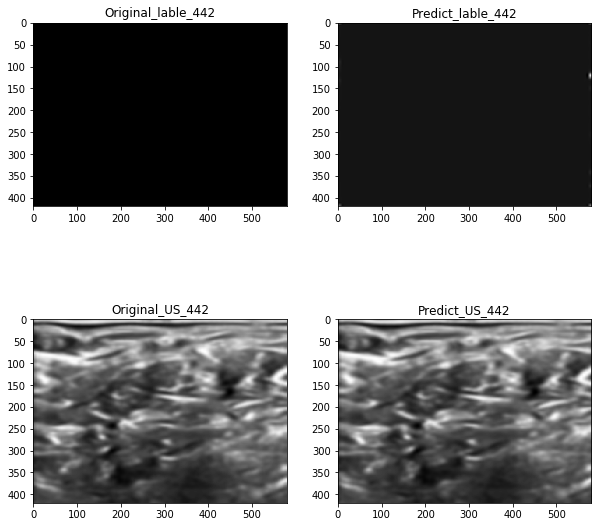

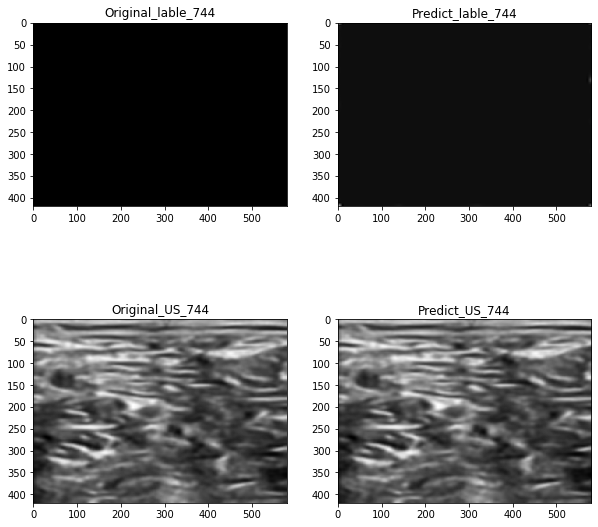

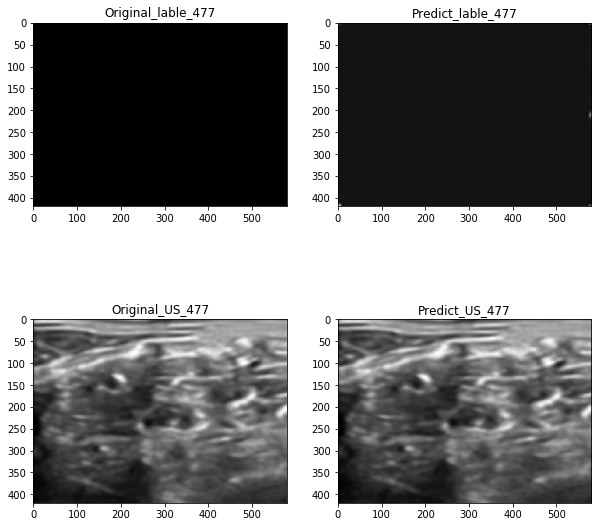

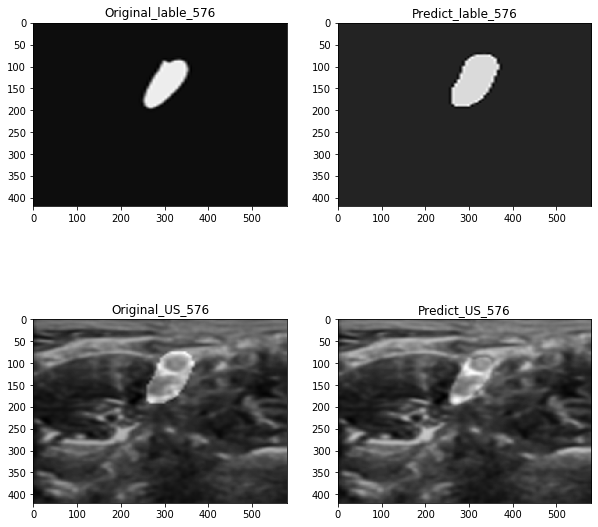

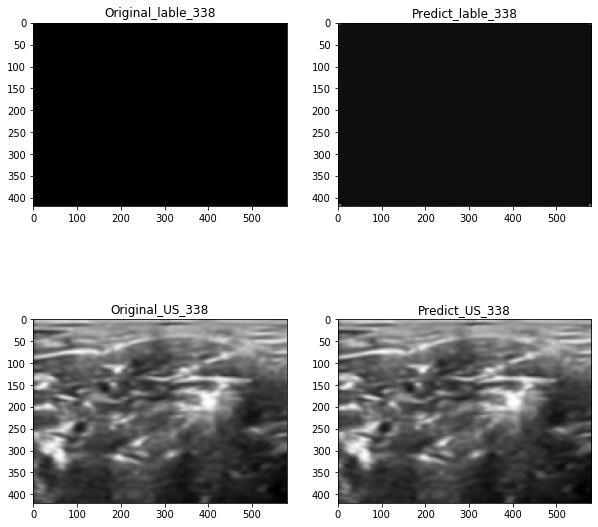



Fold  0
Train on 4508 samples, validate on 1127 samples
Epoch 1/50
 - 20s - loss: 5.1258 - dice_coef: 0.0415 - recall: 0.7055 - precision: 0.0251 - mean_iou: 0.5465 - val_loss: 3.8887 - val_dice_coef: 0.0011 - val_recall: 3.9587e-11 - val_precision: 0.8333 - val_mean_iou: 0.9880
Epoch 2/50
 - 15s - loss: 3.1453 - dice_coef: 0.3378 - recall: 0.5099 - precision: 0.3167 - mean_iou: 0.9634 - val_loss: 2.8112 - val_dice_coef: 0.3812 - val_recall: 0.3608 - val_precision: 0.4663 - val_mean_iou: 0.9857
Epoch 3/50
 - 15s - loss: 2.5307 - dice_coef: 0.4737 - recall: 0.5459 - precision: 0.4434 - mean_iou: 0.9826 - val_loss: 2.4256 - val_dice_coef: 0.4131 - val_recall: 0.4180 - val_precision: 0.4533 - val_mean_iou: 0.9852
Epoch 4/50
 - 15s - loss: 2.2014 - dice_coef: 0.5067 - recall: 0.5707 - precision: 0.4839 - mean_iou: 0.9836 - val_loss: 2.1251 - val_dice_coef: 0.4663 - val_recall: 0.5210 - val_precision: 0.4628 - val_mean_iou: 0.9843
Epoch 5/50
 - 15s - loss: 1.9644 - dice_coef: 0.5277 - rec

Epoch 38/50
 - 16s - loss: 0.6160 - dice_coef: 0.6343 - recall: 0.6676 - precision: 0.6258 - mean_iou: 0.9871 - val_loss: 0.6945 - val_dice_coef: 0.5542 - val_recall: 0.5788 - val_precision: 0.5861 - val_mean_iou: 0.9870
Epoch 39/50
 - 16s - loss: 0.6064 - dice_coef: 0.6374 - recall: 0.6643 - precision: 0.6343 - mean_iou: 0.9872 - val_loss: 0.6814 - val_dice_coef: 0.5610 - val_recall: 0.5989 - val_precision: 0.5659 - val_mean_iou: 0.9866
Epoch 40/50
 - 15s - loss: 0.6033 - dice_coef: 0.6345 - recall: 0.6773 - precision: 0.6196 - mean_iou: 0.9869 - val_loss: 0.6737 - val_dice_coef: 0.5630 - val_recall: 0.6519 - val_precision: 0.5270 - val_mean_iou: 0.9853
Epoch 41/50
 - 15s - loss: 0.5987 - dice_coef: 0.6328 - recall: 0.6642 - precision: 0.6308 - mean_iou: 0.9872 - val_loss: 0.6684 - val_dice_coef: 0.5622 - val_recall: 0.6387 - val_precision: 0.5440 - val_mean_iou: 0.9857
Epoch 42/50
 - 16s - loss: 0.5893 - dice_coef: 0.6371 - recall: 0.6754 - precision: 0.6236 - mean_iou: 0.9870 - val_

Epoch 25/50
 - 15s - loss: 0.4873 - dice_coef: 0.6534 - recall: 0.6772 - precision: 0.6517 - mean_iou: 0.9877 - val_loss: 0.5673 - val_dice_coef: 0.5737 - val_recall: 0.5672 - val_precision: 0.6314 - val_mean_iou: 0.9873
Epoch 26/50
 - 15s - loss: 0.4885 - dice_coef: 0.6510 - recall: 0.6860 - precision: 0.6388 - mean_iou: 0.9874 - val_loss: 0.5525 - val_dice_coef: 0.5885 - val_recall: 0.6223 - val_precision: 0.5855 - val_mean_iou: 0.9865
Epoch 27/50
 - 15s - loss: 0.4954 - dice_coef: 0.6430 - recall: 0.6755 - precision: 0.6370 - mean_iou: 0.9875 - val_loss: 0.5736 - val_dice_coef: 0.5638 - val_recall: 0.5195 - val_precision: 0.6836 - val_mean_iou: 0.9882

Epoch 00027: ReduceLROnPlateau reducing learning rate to 9.999999747378752e-06.
Epoch 00027: early stopping
[0.5736091826590375, 0.5638282895088196, 0.5195082426071167, 0.6835768222808838, 0.9882205724716187]

Fold  2
Train on 4508 samples, validate on 1127 samples
Epoch 1/50
 - 15s - loss: 0.4865 - dice_coef: 0.6503 - recall: 0.6737 


Epoch 00033: ReduceLROnPlateau reducing learning rate to 9.999999747378752e-07.
Epoch 00033: early stopping
[0.47077358490932064, 0.6521992087364197, 0.7103216648101807, 0.6322903037071228, 0.9880136847496033]

Fold  3
Train on 4508 samples, validate on 1127 samples
Epoch 1/50
 - 15s - loss: 0.4474 - dice_coef: 0.6730 - recall: 0.7049 - precision: 0.6619 - mean_iou: 0.9880 - val_loss: 0.4477 - val_dice_coef: 0.6719 - val_recall: 0.6944 - val_precision: 0.6917 - val_mean_iou: 0.9883
Epoch 2/50
 - 15s - loss: 0.4468 - dice_coef: 0.6735 - recall: 0.6978 - precision: 0.6699 - mean_iou: 0.9881 - val_loss: 0.4479 - val_dice_coef: 0.6716 - val_recall: 0.6932 - val_precision: 0.6939 - val_mean_iou: 0.9883
Epoch 3/50
 - 15s - loss: 0.4531 - dice_coef: 0.6672 - recall: 0.6904 - precision: 0.6630 - mean_iou: 0.9881 - val_loss: 0.4479 - val_dice_coef: 0.6716 - val_recall: 0.6931 - val_precision: 0.6935 - val_mean_iou: 0.9883
Epoch 4/50
 - 15s - loss: 0.4463 - dice_coef: 0.6740 - recall: 0.7049 - 

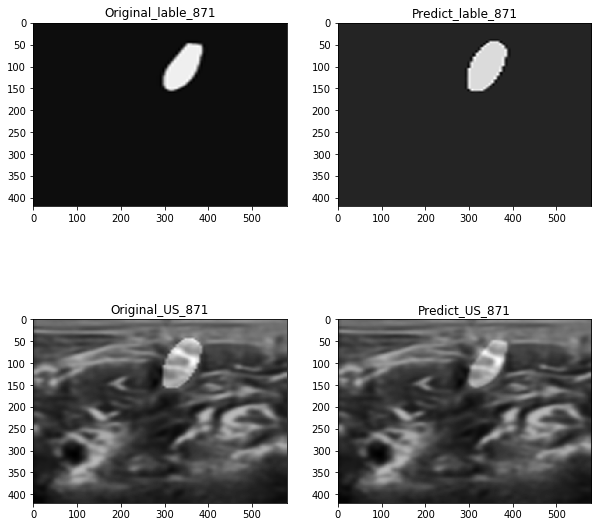

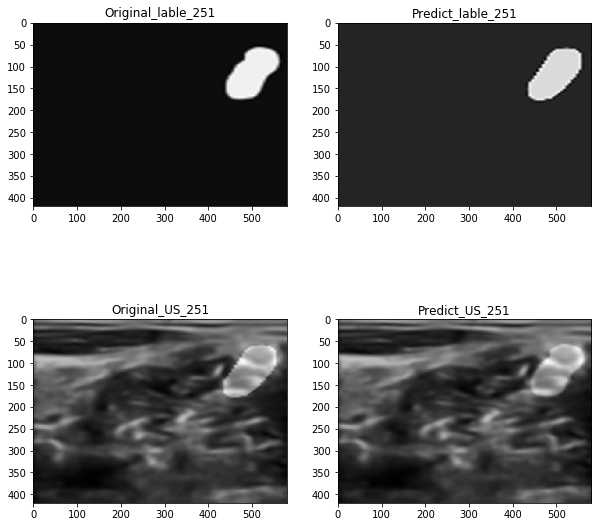

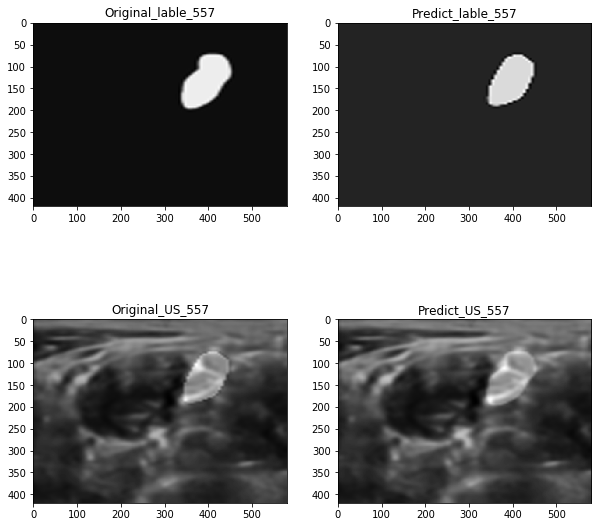

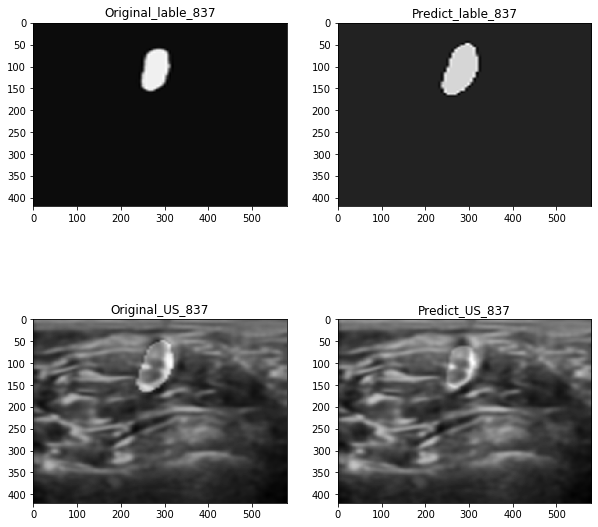

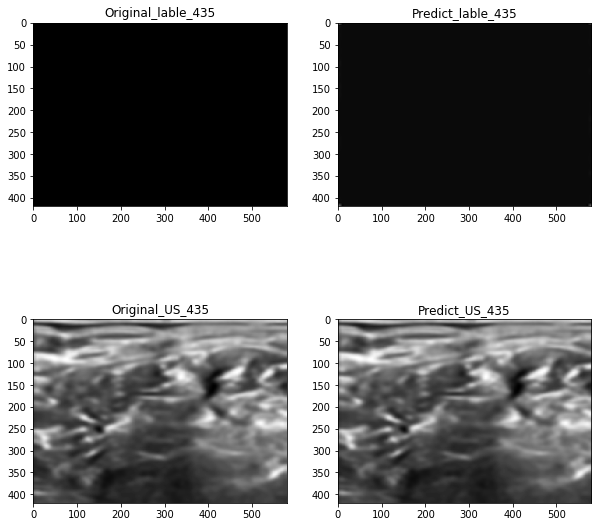

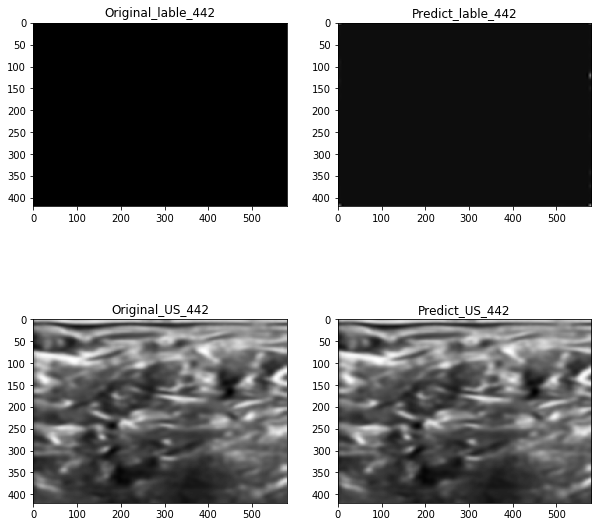

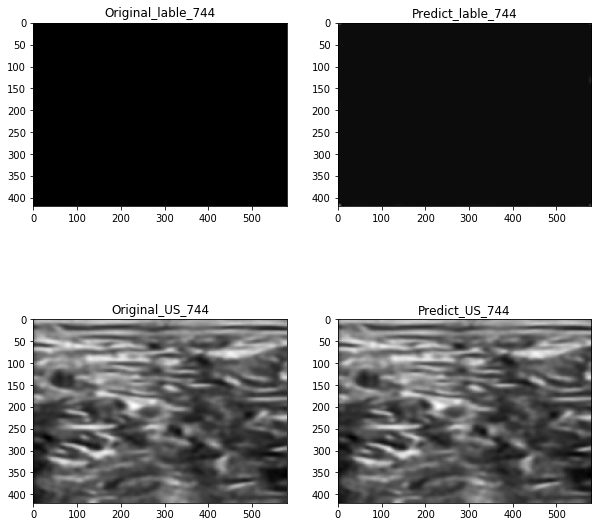

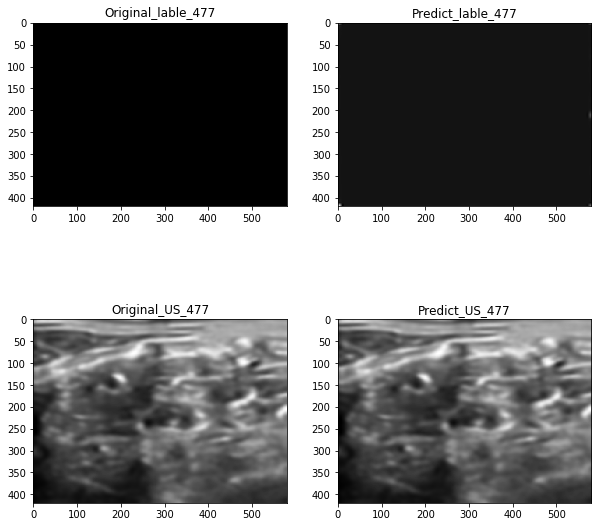

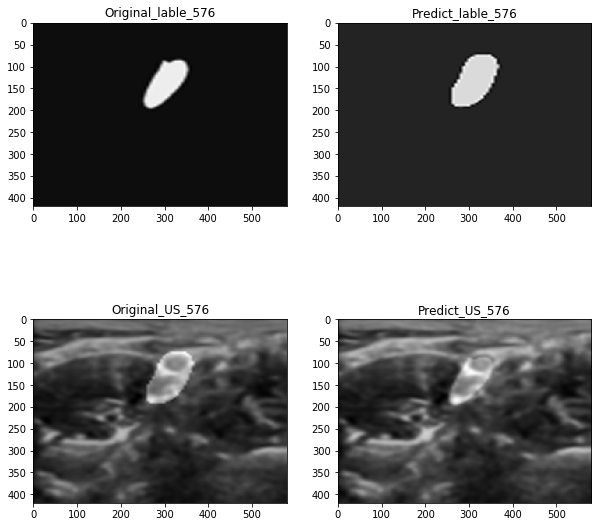

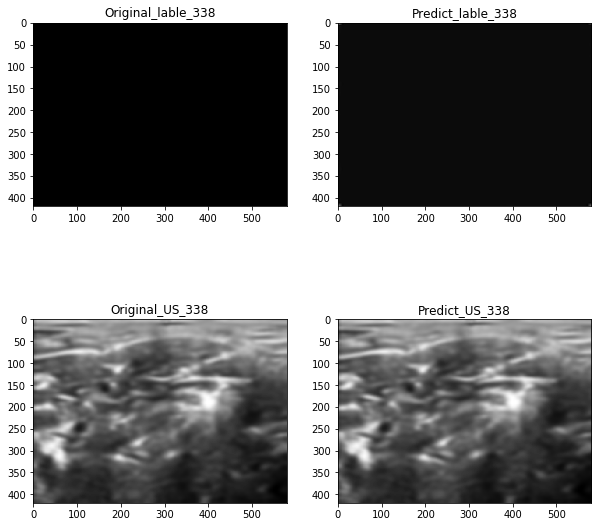

In [46]:
import h5py
import pandas as pd
import time
for ind_fil in [3,5,7,9]:
    for ind in ["/"]:
        path = "./Result/U-Net/Lee/"+str(ind_fil) +ind
        image_c = preprocess_img_n(image_t,ind_fil)
        CAE = get_unet()

        for j, (train_idx, val_idx) in enumerate(folds):
            now = time.localtime()
            s = "%02d-%02d-%02d_%02d;%02d" % (now.tm_year-2000,
                                          now.tm_mon, now.tm_mday, now.tm_hour, now.tm_min)
            print('\nFold ', j)
            image_train_cv = image_c[train_idx]
            mask_train_cv = mask_c[train_idx]
            image_valid_cv = image_c[val_idx]
            mask_valid_cv = mask_c[val_idx]

            name_weights = path+"/final_model_fold_" + \
                str(j) + "_weights.h5"
            callbackk = get_callbacks(name_weights=name_weights, patience_lr=10)

            history = CAE.fit(image_train_cv, mask_train_cv, epochs=50, verbose=2, shuffle=True, validation_data=(
            image_valid_cv, mask_valid_cv), batch_size=32, callbacks=callbackk)

            if history.history['dice_coef'][-1] < 0.05:
                break
            df = pd.DataFrame({"val_loss": history.history['val_loss'],
                           "val_dice_coef": history.history['val_dice_coef'],
                           "val_precision": history.history['val_precision'],
                           "val_recall": history.history['val_recall']})
            df = df*100
            df.to_csv(
                path+'/history_{:2.3}_{}.csv'.format(history.history['val_dice_coef'][-1], s))
            print(CAE.evaluate(image_valid_cv, mask_valid_cv, verbose=2))

        mask_predict = CAE.predict(image_valid_cv, verbose=2)

        mask_r = mask_predict.reshape(1127, 96, 96)
        mask_test_u = mask_valid_cv.reshape(1127, 96, 96)
        image_test_u = image_valid_cv.reshape(1127, 96, 96)

        img_test_o = (mask_r*2)+image_test_u
        img_predict_o = image_test_u+(mask_test_u*2)

        np.random.seed(0)
        for num in np.random.choice(1127, 10, replace=False):
            plt.figure(figsize=(10, 10))
            plt.subplot(2, 2, 1)
            plt.imshow(cv2.resize(mask_test_u[num], (580, 420),
                                  interpolation=cv2.INTER_CUBIC), cmap='gray')
            plt.title('Original_lable_'+str(num))

            plt.subplot(2, 2, 2)
            plt.imshow(cv2.resize(mask_r[num], (580, 420),
                                  interpolation=cv2.INTER_CUBIC), cmap='gray')
            plt.title('Predict_lable_'+str(num))

            plt.subplot(2, 2, 3)
            plt.imshow(cv2.resize(img_test_o[num], (580, 420),
                                  interpolation=cv2.INTER_CUBIC), cmap='gray')
            plt.title('Original_US_'+str(num))

            plt.subplot(2, 2, 4)
            plt.imshow(cv2.resize(img_predict_o[num], (580, 420),
                                  interpolation=cv2.INTER_CUBIC), cmap='gray')
            plt.title('Predict_US_'+str(num))
            plt.savefig(path+'/Result'+str(num)+'.png')
            plt.show()